# This notebook generates pi0 plots for specific set of pickles

In [1]:
%matplotlib inline
import platform
print(platform.python_version())
from ROOT import TFile,vector
import ROOT

import matplotlib.pyplot as plt
import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
import math


import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.interpolate import interp1d
from scipy.integrate import quad
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
from textwrap import wrap
import copy

import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

3.5.2
Welcome to JupyROOT 6.14/08


In [2]:
# davios functions for plotting...

def Tune1(df):
    return df['xsec_tune1_weight'].values

def CV(df):
    wgt = []
    if 'xsec_corr_weight' in df.columns:
        wgt = df['xsec_corr_weight'].values
    else:
        for i in range(len(df)):
            wgt.append(1.0)
#     if False:
    if 'new_weight' in df.columns:
        tmpweights1 = df['new_weight'].values

    else:
        tmpweights1 = []
        for i in range(len(wgt)):
            tmpweights1.append(1.0)
    
    if 'pot_weight' in df.columns:
#     if False:
        tmpweights2 = df['pot_weight'].values
    else:
        tmpweights2 = []
        for i in range(len(wgt)):
            tmpweights2.append(1.0)
            
    for i in range(len(wgt)):
        wgt[i] = wgt[i]*tmpweights1[i]*tmpweights2[i]
#         
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    
    return wgt

def Spline(df):
    wgt = df['spline_weight'].values
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    return wgt


class sampHist:

    def __init__(self,samp_df,samp_l,samp_c,samp_wind,samp_s):
        self._df = samp_df.copy()
        self._label = samp_l
        self._color = samp_c
        self._scale = samp_s
        self._wi = samp_wind
        if samp_wind == 0:
            self._wgt = np.ones(len(samp_df))
        if samp_wind == 1:
            self._wgt = CV(samp_df)

    def setweight(self,windex):
        if windex == 0:
            self._wgt = np.ones(len(self._df))
        if windex == 1:
            self._wgt = CV(self._df)

    def dist(self,s_var):
        return self._df[s_var].values

    def cosdist(self,s_var):
        return np.cos(self._df[s_var].values)

    def applycut(self,s_cut):
        newhist = copy.deepcopy(self)
        newhist._df = self._df.query(s_cut)
        newhist.setweight(self._wi)
        return newhist

class SimpleHisto:

    def __init__ (self,df_df,f_scale,i_wgt,s_color,s_label):
        temp_df = df_df.copy()
        temp_df['myscale'] = f_scale
        self.mydf = temp_df
        self.mycolor = s_color
        self.mylabel = s_label
        self.iwgt = i_wgt

        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def GetHist(self,s_varname):
        temp_df = self.mydf.query(self.mycut)
        if self.iwgt == 1:
            myweight = CV(temp_df)
        elif self.iwgt == 0:
            myweight = np.ones(len(temp_df))
        return temp_df[s_varname].values,myweight,temp_df['myscale'].values,self.mycolor,self.mylabel

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

class StackedHisto:

    def  __init__ (self,a_df_mc,a_df_scale):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layeriwgt = []
        self.stratxweight = []

        temp_a_df = []
        for i in range(len(a_df_mc)):
            temp_df = a_df_mc[i].copy()
            temp_df['myscale'] = a_df_scale[i]
            temp_a_df.append(temp_df)
        self.mymc = pd.concat(temp_a_df)
        self.mycut ='(shower1_E_Y>0 or shower1_E_Y<=0)'


    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def AddLayer(self,df_layer,df_scale,i_wgt,s_label,s_color):
        temp_df = df_layer.copy()
        temp_df['myscale'] = df_scale
        self.mylayer.append(temp_df)
        self.layerlabel.append(s_label)
        self.layercolor.append(s_color)
        self.layeriwgt.append(i_wgt)

    def AddStrata(self,s_strata,s_label,s_color,f_wgt=1.0):
        self.mystrata.append(s_strata)
        self.stratalabel.append(s_label)
        self.stratacolor.append(s_color)
        self.stratxweight.append(f_wgt)

    def GetHists(self,s_varname):
        a_vals = []        # (nxN)
        a_wgts = []
        a_scale = []
        a_cols = []        # (nx1)
        a_labels = []

        # first, run  through strata
        for i in range(len(self.mystrata)):
            # isolate this stratum with current cut
            temp_df = self.mymc.query(self.mystrata[i]+' and '+self.mycut)
            print(len(temp_df))
            a_vals.append(temp_df[s_varname].values)
            a_wgts.append(CV(temp_df) * self.stratxweight[i])   # ah, this is if we want to scale an individual stratum
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.stratacolor[i])
            a_labels.append(self.stratalabel[i])

        for i in range(len(self.mylayer)):
            temp_df = self.mylayer[i].query(self.mycut)

            a_vals.append(temp_df[s_varname].values)
            if self.layeriwgt[i] == 1:
                a_wgts.append(CV(temp_df))
            elif self.layeriwgt[i] == 0:
                a_wgts.append(np.ones(len(temp_df)))
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.layercolor[i])
            a_labels.append(self.layerlabel[i])

        return  np.asarray(a_vals),np.asarray(a_wgts),np.asarray(a_scale),a_cols,a_labels

    def ClearLayers(self):
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layerwgt = []

    def ClearStrata(self):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []


class distVar:

    def __init__(self,s_name,n_range,s_label='',s_cov=''):
        self.myname = s_name
        self.myrange = n_range
        self.myscov = s_cov
        if s_label == '':
            self.mylabel = s_name
        else:
            self.mylabel = s_label
            
def PmuGivenX(mu,x):

    # Returns the probability density value that the true mean is mu given that you
    # have observed x events. Actually employs a series approximation because the real formula
    # involves a very very large numerator and denominator and overflows even high precision
    # variables if your bins contain more than a few hundred events
    # Approximation is good to O(0.1%) or better at all values

    pi  = np.pi
    c   = [1.,-1./12,1./288,139./51840,-571./2488320,-163879./209018880]

    if x == 0:
        return np.exp(-mu)
    else:
        poly = sum(c[i]/x**(i+0.5) for i in range(len(c)))
        return 1/np.sqrt(2*pi)*np.exp(x+x*np.log(mu/x)-mu)*poly


def distplot_wratio_davio(myvar,nbins,myrange,stackedhists,datahist,stxcoord,m_cov,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #consFac is new and consolidates all MC strata whose contribution is less than a given percent threshold.
    # (my legend was too full of useless stuff)

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    data_vals,data_wgt,data_scale,_,data_label = datahist.GetHist(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])
        print("SUM", h1.sum())

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])


    vals_data_raw,_ = np.histogram(data_vals,nbins,range=myrange,weights=data_wgt)
    vals_data,_ = np.histogram(data_vals,nbins,range=myrange,weights=np.multiply(data_wgt,data_scale))
    bincenters = np.diff(binedges)/2 + binedges[:-1]

    #jarretbars
    a_obslo = []
    a_obshi = []
    for i in range(nbins):
        obslo,obshi = GetErrorsData(vals_data[i])
        a_obshi.append(obshi-vals_data[i])
        a_obslo.append(vals_data[i]-obslo)

    #m_cov is fractional, so we multiply it by MC
    for i in range(nbins):
        for j in range(nbins):
            if(vals_mc[i] > 0 and vals_mc[j] > 0):
                m_cov[i][j] *= vals_mc[i]*vals_mc[j]
#             else if math.isnan(vals_mc[i]) or math.isnan(vals_mc[j]):
#                 m_cov[i][j] = 0
            else:
                m_cov[i][j] = 0
#             else:
#                 print("uh oh!",vals_mc[i],vals_mc[j] )

    # Normalization uncertainty:
    for i in range(len(m_cov)):
        for j in range(len(m_cov[i])):
            if math.isnan(m_cov[i][j]):
                m_cov[i][j]=0.0000000001
                
    fNorm_squared = m_cov.sum() / np.power(vals_mc.sum(),2)
#     print("first", m_cov)
    print('Normalization Uncertainty:',np.sqrt(fNorm_squared))

    yerr_mc_sys = np.sqrt(np.diag(m_cov))
    yerr_mc_total = np.sqrt(np.diag(m_cov) + yerrsq_mc)
    print("yerr_mc_total", yerr_mc_total)

    yerrsq_data = np.zeros(nbins)
    for i in range(nbins):
        if vals_mc_raw[i] > 0:
            ndof += 1
            if vals_data[i] > 0:
                yerrsq_data[i] += (3.0*vals_data[i]*vals_mc[i]*normshift)/(vals_mc[i]*normshift+2.0*vals_data[i])
            else:
                yerrsq_data[i] += vals_mc[i]*normshift/2.0
            m_cov[i][i] += yerrsq_data[i] + yerrsq_mc[i]
        else:
            m_cov[i][i] += 999

        
    yerr_data = np.sqrt(yerrsq_data)
    print("yerr_data", sum(yerr_data))
    er_rat_line = np.zeros(nbins)
    er_rat_line_sys = np.zeros(nbins)
    er_rat_dotshi = np.zeros(nbins)
    er_rat_dotslo = np.zeros(nbins)

    for i in range(nbins):
        if vals_mc[i] > 0:
            er_rat_line[i] = yerr_mc_total[i]/float(vals_mc[i])
            er_rat_line_sys[i] = yerr_mc_sys[i]/float(vals_mc[i])
            er_rat_dotshi[i] = a_obshi[i]/float(vals_mc[i])
            er_rat_dotslo[i] = a_obslo[i]/float(vals_mc[i])

    chisq = 0.0
    invcov = np.linalg.inv(m_cov)
    print('ERROR HERE')
    print(er_rat_dotslo)
    print(er_rat_dotshi)

    # calc chi2
    print ("chi2 in bins")
    for i in range(nbins):
        for j in range(nbins):
            if vals_mc_raw[i] > 0 and vals_mc_raw[j] > 0:
                chisq += (vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j]
                if (i==j):
                    print ((vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j])
    pval = 1 - stats.chi2.cdf(chisq, ndof)
    print(chisq/float(ndof),pval)

    fig,ax = plt.subplots(figsize=fs)
    fig.patch.set_alpha(1)
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, .75])
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ymax = max((vals_data+np.asarray(a_obshi)).max(),(vals_mc+yerr_mc_sys).max())*1.4

    ax0.set_ylim(0,ymax)
    ax0.set_xlim(myrange)
    ax1.set_ylim(0,2)
    ax1.set_xlim(myrange)
    ax1.set_xlabel(stxcoord,fontsize=20)
    ax0.set_ylabel('Event Count',fontsize=25)
    ax1.set_ylabel('Data/MC',fontsize=25)
    ax0.set_title('MCC9 Data/MC',fontsize=30)

    ax0.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax0.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax0.errorbar(bincenters,vals_data,fmt='o',yerr=(a_obslo,a_obshi),color='black',capsize=5,label=data_label+' (%i)'%vals_data.sum(),markersize=8,zorder=20,elinewidth=2)
    ax0.errorbar(bincenters,vals_data,fmt='o',color='white',zorder=19,markersize=18)

    errboxes_tot = []
    errboxes_sys = []

    for i in range(len(bincenters)):
        rect0 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_sys[i])),binedges[i+1]-binedges[i],yerr_mc_sys[i]*2)
        errboxes_sys.append(rect0)
        rect1 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_total[i])),binedges[i+1]-binedges[i],yerr_mc_total[i]*2)
        errboxes_tot.append(rect1)
    pc_sys = PatchCollection(errboxes_tot,facecolor='red', alpha=.3,hatch='X',edgecolor='white')
    pc_sys_outline = PatchCollection(errboxes_tot,facecolor='none', alpha=.9,hatch='X',edgecolor='white',zorder=11)
    pc_tot = PatchCollection(errboxes_sys,facecolor=None,alpha=.1,hatch='/',zorder=12)
    ax0.add_collection(pc_sys)
    ax0.add_collection(pc_sys_outline)
    ax0.add_collection(pc_tot)
    ax0.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0,label='MC Systematic Error')
    ax0.hist(np.zeros(1),(1,2),facecolor='red', alpha=.3,hatch='X',edgecolor='white',label='MC Sys+Stat Error')
    ax0.legend(loc='upper right',fontsize=20,frameon=False,ncol=1)

    errboxes_rat_tot = []
    errboxes_rat_sys = []
    for i in range(len(er_rat_dotshi)):
        rect0 = Rectangle((binedges[i],1-er_rat_line[i]),binedges[i+1]-binedges[i],er_rat_line[i]*2)
        errboxes_rat_tot.append(rect0)
        rect1 = Rectangle((binedges[i],1-er_rat_line_sys[i]),binedges[i+1]-binedges[i],er_rat_line_sys[i]*2)
        errboxes_rat_sys.append(rect1)

    pc_rat_tot = PatchCollection(errboxes_rat_tot, facecolor='red', alpha=.3)
    pc_rat_sys = PatchCollection(errboxes_rat_sys, facecolor=None, alpha=.1,hatch='/',zorder=12)
    ax1.add_collection(pc_rat_tot)
    ax1.add_collection(pc_rat_sys)
    ax1.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0)

    ax1.hist(np.zeros(1),(1,2),facecolor='red',alpha=.3,zorder=0)
    ax1.errorbar(bincenters,np.true_divide(vals_data,vals_mc),yerr=(er_rat_dotshi,er_rat_dotslo),fmt='o',color='maroon',capsize=0,markersize=8,elinewidth=2)

    #ax1.legend(loc='lower right',fontsize=15,frameon=False)

    ax1.axhline(1,color='black',linestyle=':')
    ax0.annotate(r'$\sum$data/$\sum$MC = %.2f $\pm$ %.2f'%(vals_data.sum()/float(vals_mc.sum()),np.sqrt(fNorm_squared)),xy=(.01,.92),xycoords='axes fraction',fontsize=20,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))

    ax1.annotate('p-value: %.3f\n'%pval+r'$\chi^2_{CNP}/%i  (dof)$: %.3f'%(ndof,chisq/float(ndof)),xy=(.85,.7), xycoords='axes fraction',fontsize=17,bbox=dict(boxstyle="round4", fc="w",alpha=.9),zorder=30)

    plt.tight_layout()

    return fig,ax0,ax1,pval

def distplot_mc(myvar,nbins,myrange,stackedhists,stxcoord,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #for plotting truth variables

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])
   
  

   

    fig,ax = plt.subplots(figsize=fs)

    ymax = (vals_mc).max()*1.4

    ax.set_ylim(0,ymax)
    ax.set_xlim(myrange)
    ax.set_xlabel(stxcoord,fontsize=20)
    ax.set_ylabel('Event Count',fontsize=25)
    ax.set_title('MCC9 MC',fontsize=30)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16) 
    
    x_res=[]
    y_res=[]
    for i in range(10):
        x_res.append(0.0)
        y_res.append(i*(ymax)/10.0)
    
    plt.plot(x_res,y_res,'--',color='black',label="resolution = 0.0")

    ax.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax.legend(loc='upper right',fontsize=20,frameon=False,ncol=1)

    
    plt.tight_layout()

    return fig,ax

In [3]:
NUMU_R1_POT = 9.083e19
NUMU_R1_1MIL_POT = 1.33678E+21
NUE_R1_POT  = 9.80259e+22

DETVAR_CV_POT =  9.65858292241e+19

NUMU_R3_POT = 8.98773223801e+20
NUE_R3_POT = 4.707047e+22

NUMU_R2_POT = 4.08963968669e+20
NUMU_R2_1MIL_POT = 1.2992E+21
NUE_R2_POT = 9.2085012316e+22

CCPI0_R1_POT = 6.95344e+20
CCPI0_R3_POT = 5.92213e+20
NCPI0_R1_POT = 2.90401e+21
NCPI0_R3a_POT = 2.62745e+20
NCPI0_R3b_POT = 2.22482e+21

DATA_R1_OPEN_POT = 4.403e+19
DATA_R3_OPEN_POT = 8.786e+18
DATA_R1_PI0FILTER_POT =1.746e+20
DATA_R2D_PI0FILTER_POT = 2.050e+20
DATA_R2E_PI0FILTER_POT = 6.507e+19
DATA_R3F_PI0FILTER_POT = 4.3e+19
DATA_R3G_PI0FILTER_POT = 2e+20

FAKE_DATA_1_RUN1_POT = 1.925e20
FAKE_DATA_1_RUN3_POT = 2.83e20

EXT_R1_PI0FILTER_POT = 22474918.0/41898673.0 * DATA_R1_PI0FILTER_POT 
EXT_R1_OPEN_POT = 22474918.0 / 9776965.0* DATA_R1_OPEN_POT
EXT_R1_FAKE1_POT = 22474918.0 /41898673.0* FAKE_DATA_1_RUN1_POT

EXT_R2D_PI0FILTER_POT =  39566274.0/49422124.0 * DATA_R2D_PI0FILTER_POT
EXT_R2E_PI0FILTER_POT =  39566274.0/19914275.0 * DATA_R2E_PI0FILTER_POT
EXT_R3F_PI0FILTER_POT =  39566274.0/11229268.0 * DATA_R3F_PI0FILTER_POT
EXT_R3G_PI0FILTER_POT =  39566274.0/51705212.0 * DATA_R3G_PI0FILTER_POT
EXT_R3_OPEN_POT = 39566274.0/2263559.0 * DATA_R3_OPEN_POT
EXT_R3_FAKE1_POT = 39566274.0/11229268.0 * FAKE_DATA_1_RUN3_POT

POT_SCALE_FACTOR = 1.0 #if I feel like playing with scaling
# CURRENT TOTAL
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT
print("total POT: ",DATA_POT_TOTAL)
print("1", EXT_R1_PI0FILTER_POT)
print("2", EXT_R2E_PI0FILTER_POT+EXT_R2D_PI0FILTER_POT)
print("3", EXT_R3G_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT)

total POT:  6.8767e+20
1 9.365739776054483e+19
2 2.9340153832119832e+20
3 3.045558940373219e+20


In [4]:
NUMU_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NUMU_R1_POT)
NUE_R1_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NUE_R1_POT)
EXT_R1_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(EXT_R1_OPEN_POT)
CCPI0_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(CCPI0_R1_POT)
NCPI0_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NCPI0_R1_POT)


NUMU_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_POT)
NUMU_R1_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_1MIL_POT)
NUE_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUE_R1_POT)
EXT_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(EXT_R1_PI0FILTER_POT)
CCPI0_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(CCPI0_R1_POT)
NCPI0_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NCPI0_R1_POT)

NUMU_R1_FAKE1_SCALE = (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(NUMU_R1_POT)
NUE_R1_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(NUE_R1_POT)
EXT_R1_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(EXT_R1_FAKE1_POT)

NUMU_R2D_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUE_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUE_R2_POT)
NUMU_R2D_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_1MIL_POT)
EXT_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(EXT_R2D_PI0FILTER_POT)
NUMU_R2E_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUMU_R2E_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_1MIL_POT)
NUE_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUE_R2_POT)
EXT_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(EXT_R2E_PI0FILTER_POT)

NUMU_R3_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(NUMU_R3_POT)
NUE_R3_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(NUE_R3_POT)
EXT_R3_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(EXT_R3_OPEN_POT)
NUMU_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(EXT_R3F_PI0FILTER_POT)
NUMU_R3_FAKE1_SCALE = (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(NUMU_R3_POT)
NUE_R3_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(NUE_R3_POT)
EXT_R3_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(EXT_R3_FAKE1_POT)
NUMU_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(EXT_R3G_PI0FILTER_POT)

CCPI0_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3F_PI0FILTER_POT))/ float(CCPI0_R3_POT)
NCPI0_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3F_PI0FILTER_POT))/ float(NCPI0_R3a_POT+NCPI0_R3b_POT)
CCPI0_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3G_PI0FILTER_POT))/ float(CCPI0_R3_POT)
NCPI0_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3G_PI0FILTER_POT))/ float(NCPI0_R3a_POT+NCPI0_R3b_POT)


NUMU_R3_DETVAR_SCALE = (DETVAR_CV_POT)/ float(NUMU_R3_POT)

In [5]:
# Or, we can load from pickles if you, you know, want to.
# Pickle read for easy access later, eh?

tag = 'Nov_20_run1_numu'
df_numu_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
# df_numu_goodruns_pmtprecut = read_root('/media/disk1/kmason/mcc9_v29e_dl_run1_C1_part0_pi0_sideband_dlana_v1_1_4_fvv.root','dlana/FinalVertexVariables')
tag = 'Feb_4_run1_numu'
df_numu_1mil_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Feb_5_run1_numu_dlana'
df_numu_1mil_goodruns_pmtprecut_ana = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run1_nue'
df_nue_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run1_ext'
df_ext_goodruns_pmtprecut = pd.read_pickle('../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)
tag ='Nov_20_open_run1'
df_data_goodruns_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)

tag = 'Nov_20_run2_numu'
df_numu_r2_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Mar_19_run2_numu_1Mil'
df_numu_r2_1mil_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run2_nue'
df_nue_r2_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)

tag = 'Nov_20_run3_numu'
df_numu_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run3_nue'
df_nue_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run3_ext'
df_ext_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)

tag = 'Jan_15_run1_CCPi0'
df_ccpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
print("all events: ", len(df_ccpi0_r1_goodruns_pmtprecut))
print(" haspi0 events: ", len(df_ccpi0_r1_goodruns_pmtprecut.query("haspi0==1")))
tag = 'Jan_15_run3_CCPi0'
df_ccpi0_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# tag = 'May_20_run1_NCPi0'
# df_ncpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# tag = 'May_20_run3_NCPi0'
# df_ncpi0_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)

tag = 'Jan_15_run1_NCPi0'
df_ncpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run3a_NCPi0'
df_ncpi0_r3a_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run3b_NCPi0'
df_ncpi0_r3b_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# combine r3a,r3b files
df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3a_goodruns_pmtprecut.append(df_ncpi0_r3b_goodruns_pmtprecut)

ccpi0r1pi0=np.ones(len(df_ccpi0_r1_goodruns_pmtprecut))
df_ccpi0_r1_goodruns_pmtprecut["newhaspi0"] = ccpi0r1pi0
ccpi0r3pi0=np.ones(len(df_ccpi0_r3_goodruns_pmtprecut))
df_ccpi0_r3_goodruns_pmtprecut["newhaspi0"] = ccpi0r3pi0

ncpi0r1pi0=np.ones(len(df_ncpi0_r1_goodruns_pmtprecut))
df_ncpi0_r1_goodruns_pmtprecut["newhaspi0"] = ncpi0r1pi0
ncpi0r3pi0=np.ones(len(df_ncpi0_r3_goodruns_pmtprecut))
df_ncpi0_r3_goodruns_pmtprecut["newhaspi0"] = ncpi0r3pi0

tag = 'Nov_20_pi0box_run1'
df_data_r1_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run2D'
df_data_r2D_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run2E'
df_data_r2E_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run3F'
df_data_r3F_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run3G'
df_data_r3G_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)


all events:  3307
 haspi0 events:  3307


In [6]:
# nbins=20
# RSE = ['run','subrun','event']
# sort = 'shower1_E_Y'

# df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
# df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
# # df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0")
# # df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0")
# df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0 and Proton_Edep >= 50 and InFiducial == 1 and gamma_1_true>0 and gamma_2_true>0")
# df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0 and Proton_Edep >= 50 and InFiducial == 1 and gamma_1_true>0 and gamma_2_true>0")

# print("len:",len(df_ncpi0_r1_goodruns_pmtprecut)+len(df_ncpi0_r3_goodruns_pmtprecut))

# # scale CV weights:
# def potscale(df,scalefactor=1.0,ext=False,pi0weights=False,typefit=0):
#     pot_weight = []

# #     #poly , type 0
# #     a_NC=  2.093816660137859e-06
# #     b_NC=  -0.003246790877041392
# #     c_NC=  1.5648383057401296


#     # exp, type 1
# #     a_NC=  1.9626392307915423
# #     b_NC=  -0.003828134293419718
# #     c_NC=  -0.08572830500953435


#     #line, type 2

# #     a_NC=  -0.00144457389761155
# #     b_NC=  1.2327958121598968

# #     c_NC =0
    
#     #norm, type 3
#     a_NC = 0.7163444846478344
#     b_NC = 0
#     c_NC = 0
    
#     mom = df['pi0_momentum_true'].values
#     wgt = df['xsec_corr_weight'].values
#     for i in range(len(df)):
#         passcut = False
#         if (df['MC_scedr'].values[i] <=5 and df['MC_scedr'].values[i] >0 and df['Proton_Edep'].values[i] >=50 and df['InFiducial'].values[i] ==1 and df['gamma_1_true'].values[i] >0 and df['gamma_2_true'].values[i] >0 ):
#             passcut =True
#         ptot=mom[i]
#         if ext==False and pi0weights==True and typefit==0 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC*(ptot**2)+b_NC*ptot+c_NC))
            
#         elif ext==False and pi0weights==True and typefit==1 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC*np.exp(b_NC*ptot)+c_NC))
        
#         elif ext==False and pi0weights==True and typefit==2 and passcut:
#             if (ptot <700):
#                 pot_weight.append(scalefactor*wgt[i]*(a_NC * ptot + b_NC))
#             else:
#                 pot_weight.append(scalefactor*wgt[i]*(a_NC * 700 + b_NC))
#         elif ext==False and pi0weights==True and typefit==3 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC))
#         else:
#             pot_weight.append(scalefactor*wgt[i])
#     return pot_weight

# # general mc
# w_nc_1 =potscale(df_ncpi0_r1_goodruns_pmtprecut,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT,False,False)
# w_nc_3 =potscale(df_ncpi0_r3_goodruns_pmtprecut,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT),False,False)
# df_ncpi0_r1_goodruns_pmtprecut['pot_weight'] = w_nc_1
# df_ncpi0_r3_goodruns_pmtprecut['pot_weight'] = w_nc_3

# pi0_nc_1 =potscale(df_ncpi0_r1_goodruns_pmtprecut,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT,False,True,3)
# pi0_nc_3 =potscale(df_ncpi0_r3_goodruns_pmtprecut,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT),False,True,3)
# df_ncpi0_r1_goodruns_pmtprecut['pi0_weight'] = pi0_nc_1
# df_ncpi0_r3_goodruns_pmtprecut['pi0_weight'] = pi0_nc_3

# df_ncpi0_total = df_ncpi0_r1_goodruns_pmtprecut.append(df_ncpi0_r3_goodruns_pmtprecut)

# # Make data plots, normalized
# # checking to see if any bins look realyl off
# var_standard = df_ncpi0_total["pi0_momentum_true"].values
# var_pot = df_ncpi0_total["pot_weight"].values
# var_pi0 = df_ncpi0_total["pi0_weight"].values

# # turn into histograms
# standard_Hist,binedges = np.histogram( var_standard, bins = nbins, range = [0,1000],weights = var_pot)
# weight_Hist,binedges = np.histogram( var_standard, bins = nbins, range = [0,1000],weights = var_pi0)

# bincenters = np.ones(len(binedges)-1)
# for i in range(len(binedges)-1):
#     bincenters[i] = binedges[i]+(1000.0/(20.0*2))
    
# a_obslo = []
# a_obshi = []
# errscale = (DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R1_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT+NCPI0_R1_POT)
# for i in range(nbins):
#     obslo,obshi = GetErrorsData(standard_Hist[i])
#     a_obshi.append((obshi-standard_Hist[i])*errscale)
#     a_obslo.append((standard_Hist[i]-obslo)*errscale)
# m_cov=np.genfromtxt('covar_forXinQuestion_true_v3.txt',delimiter=',')
# m_cov2=np.genfromtxt('covar_forXinQuestion_true_v2.txt',delimiter=',')

# print("RATIO HERE")
# fig = plt.figure(figsize=(6, 3.2))
# ax = fig.add_subplot(111)
# plt.imshow(m_cov-m_cov2)
# plt.gca().invert_yaxis()
# ax.set_aspect('equal')
# cax = fig.add_axes([0.12, 0.1, 0.78, 0.8])
# cax.get_xaxis().set_visible(False)
# cax.get_yaxis().set_visible(False)
# cax.patch.set_alpha(0)
# cax.set_frame_on(False)
# plt.colorbar(orientation='vertical')
# plt.show()
# plt.close()


# # m_cov=np.genfromtxt('covar_forXinQuestion.txt',delimiter=',')
# # m_cov=np.zeros((nbins,nbins))

# #m_cov is fractional, so we multiply it by MC
# for i in range(nbins):
#     for j in range(nbins):
#         if(standard_Hist[i] > 0 and standard_Hist[j] > 0):
#             m_cov[i][j] *= standard_Hist[i]*standard_Hist[j]
# #             else if math.isnan(vals_mc[i]) or math.isnan(vals_mc[j]):
# #                 m_cov[i][j] = 0
#         else:
#             m_cov[i][j] = 0
# #             else:
# #                 print("uh oh!",vals_mc[i],vals_mc[j] )

# # Normalization uncertainty:
# for i in range(len(m_cov)):
#     for j in range(len(m_cov[i])):
#         if math.isnan(m_cov[i][j]):
#             m_cov[i][j]=0.0000000001

# yerr_mc_sys = np.sqrt(np.diag(m_cov))
# print(yerr_mc_sys)
# er_rat_dotshi = []
# er_rat_dotslo = []

# for i in range(nbins):
#     if standard_Hist[i] > 0:
#         er_rat_dotshi.append((yerr_mc_sys[i]))
#         er_rat_dotslo.append((yerr_mc_sys[i]))
#     else:
#         er_rat_dotshi.append(0)
#         er_rat_dotslo.append(0)

# yerrsq_data = np.zeros(nbins)
# for i in range(nbins):
#     if standard_Hist[i] > 0:
#         if weight_Hist[i] > 0:
#             yerrsq_data[i] += (3.0*weight_Hist[i]*standard_Hist[i])/(standard_Hist[i]+2.0*weight_Hist[i])
#         else:
#             yerrsq_data[i] += standard_Hist[i]/2.0
#         m_cov[i][i] += yerrsq_data[i]
#     else:
#         m_cov[i][i] += 999

#  # calc chi2
# ndof=20
# chisq = 0.0
# invcov = np.linalg.inv(m_cov)
# print(invcov)
# for i in range(0,nbins):
#     for j in range(0,nbins):
#         if standard_Hist[i] > 0 and standard_Hist[j] > 0:
#             chisq += (standard_Hist[i] - weight_Hist[i]) * (standard_Hist[j] - weight_Hist[j]) *invcov[i][j]
# pval = 1 - stats.chi2.cdf(chisq, ndof)
# print("Chi2: ",chisq,chisq/ndof,pval)

# plt.errorbar(bincenters,standard_Hist,yerr=(er_rat_dotslo,er_rat_dotshi), fmt='o', color = 'red', ecolor='red', capsize=5,label = 'MC CV weight')
# plt.errorbar(bincenters,weight_Hist,yerr=(a_obslo,a_obshi), fmt='o', color = 'black', ecolor='black', capsize=5,label = 'MC DL Pi0 weight')
# plt.title("true pi0 events, only simple selection weighted")
# plt.legend(loc='upper right',fontsize=15,frameon=False,ncol=1)
# plt.show()
# plt.close()
# print(bincenters)

# for i in range(nbins):
#     print("bin: ",i+1,"fractional error = ",er_rat_dotslo[i]/float(standard_Hist[i]))
    


In [7]:
# df = df_ncpi0_r1_goodruns_pmtprecut
# file1 = open("2021May25_pi0selection_NCPi0_run1.txt","w")
# file1.write("[run,subrun,event,pi0_momentum_true,weight,MC_scedr,Proton_Edep,InFiducial,shower_energy_true,secondshower_energy_true]\n")
# for event in range(len(df)):
#     teststr = "[" +str(df['run'].values[event])+","+str(df['subrun'].values[event])+","+str(df['event'].values[event])
#     teststr2 = ","+ str(df['pi0_momentum_true'].values[event])+","+ str(df['pi0_weight'].values[event])
#     teststr3 = ","+ str(df['MC_scedr'].values[event])+","+ str(df['Proton_Edep'].values[event])+","+ str(df['InFiducial'].values[event])+","+ str(df['gamma_1_true'].values[event])+","+ str(df['gamma_2_true'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2+teststr3)
# file1.close()


# df = df_ncpi0_r3_goodruns_pmtprecut
# file1 = open("2021May25_pi0selection_NCPi0_run3.txt","w")
# file1.write("[run,subrun,event,pi0_momentum_true,weight]\n")
# for event in range(len(df_ncpi0_r3_goodruns_pmtprecut)):
#     teststr = "[" +str(df['run'].values[event])+","+str(df['subrun'].values[event])+","+str(df['event'].values[event])
#     teststr2 = ","+ str(df['pi0_momentum_true'].values[event])+","+ str(df['pi0_weight'].values[event])
#     teststr3 = ","+ str(df['MC_scedr'].values[event])+","+ str(df['Proton_Edep'].values[event])+","+ str(df['InFiducial'].values[event])+","+ str(df['gamma_1_true'].values[event])+","+ str(df['gamma_2_true'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2+teststr3)
# file1.close()

In [8]:
# start with classic pi0 cuts on each df
precuts= 'good ==1 and PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and NTracks ==2 and _pi0mass>0 and _pi0mass<400 and Proton_Edep>60.0  and Electron_Edep>35.0'
# cut on new shower variables separately
cuts_new = 'good ==1 and PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and _pi0mass_new<400 and DeltaMass_new >0 and DeltaMass_new <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y_new>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass_new>0 and BDTscore_1e1p<.7 and MPID_muon <= 100'
# cuts_new=precuts
cuts_2 = 'good==1 and PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and _pi0mass_new<400 and DeltaMass_new >0 and DeltaMass_new <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y_new>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass_new>0 and BDTscore_1e1p<.7 and MPID_muon <= 100'

RSE = ['run','subrun','event']
sort = 'shower1_E_Y'

# precuts for open run 1 test
df_numu_pre = df_numu_goodruns_pmtprecut.query(precuts+ 'and not (ccnc==0 and abs(nu_pdg)==12)')
df_numu_pre = df_numu_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_pre = df_nue_goodruns_pmtprecut.query(precuts+ ' and not (ccnc==0 and abs(nu_pdg)==14)')
df_nue_pre = df_nue_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_pre = df_ext_goodruns_pmtprecut.query(precuts)
df_ext_pre = df_ext_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r1_open_pre = df_data_goodruns_pmtprecut.query(precuts)
df_data_r1_open_pre = df_data_r1_open_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_data_r1_open_pre)/len(df_numu_pre))


df_ccpi0_r1_pre = df_ccpi0_r1_goodruns_pmtprecut.query(precuts)
df_ccpi0_r1_pre = df_ccpi0_r1_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r1_pre = df_ncpi0_r1_goodruns_pmtprecut.query(precuts)
df_ncpi0_r1_pre = df_ncpi0_r1_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

# now apply cuts
df_numu_pi0 = df_numu_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_pi0 = df_numu_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_numu_1mil_pi0 = df_numu_1mil_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_1mil_pi0 = df_numu_1mil_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(df_numu_goodruns_pmtprecut['xsec_corr_weight'].values)
df_nue_pi0 = df_nue_goodruns_pmtprecut.query(cuts_new + ' and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_pi0 = df_nue_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_pi0 = df_ext_goodruns_pmtprecut.query(cuts_new)
df_ext_pi0 = df_ext_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r1_open_pi0 = df_data_goodruns_pmtprecut.query(cuts_new)
df_data_r1_open_pi0 = df_data_r1_open_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_data_r1_open_pi0)/len(df_numu_pi0))

df_numu_r2_pi0 = df_numu_r2_goodruns_pmtprecut.query(cuts_new + 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r2_pi0 = df_numu_r2_pi0.sort_values(sort,ascending=False).drop_duplicates('CVIndex').sort_index()
df_numu_r2_1mil_pi0 = df_numu_r2_1mil_goodruns_pmtprecut.query(cuts_new + 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r2_1mil_pi0 = df_numu_r2_1mil_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_r2_pi0 = df_nue_r2_goodruns_pmtprecut.query(cuts_new)
df_nue_r2_pi0 = df_nue_r2_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_nue_r2_pi0))

df_numu_r3_pi0 = df_numu_r3_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r3_pi0 = df_numu_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_r3_pi0 = df_nue_r3_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_r3_pi0 = df_nue_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_r3_pi0 = df_ext_r3_goodruns_pmtprecut.query(cuts_new)
df_ext_r3_pi0 = df_ext_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pmtprecut.query(cuts_new)
df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pmtprecut.query(cuts_new)
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pmtprecut.query(cuts_new)
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pmtprecut.query(cuts_new)
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pmtprecut.query(cuts_new)
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

df_data_r2_pi0filter_pi0 = df_data_r2D_pi0filter_pi0.append(df_data_r2E_pi0filter_pi0)
df_data_r3_pi0filter_pi0 = df_data_r3F_pi0filter_pi0.append(df_data_r3G_pi0filter_pi0)

# mc pi0 samples
df_ccpi0_r1_pi0 = df_ccpi0_r1_goodruns_pmtprecut.query(cuts_new)
df_ccpi0_r1_pi0 = df_ccpi0_r1_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ccpi0_r3_pi0 = df_ccpi0_r3_goodruns_pmtprecut.query(cuts_2)
df_ccpi0_r3_pi0 = df_ccpi0_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r1_pi0 = df_ncpi0_r1_goodruns_pmtprecut.query(cuts_2)
df_ncpi0_r1_pi0 = df_ncpi0_r1_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r3_pi0 = df_ncpi0_r3_goodruns_pmtprecut.query(cuts_2)
df_ncpi0_r3_pi0 = df_ncpi0_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print("pi0 lengths: ", len(df_ccpi0_r1_pi0), len(df_ccpi0_r3_pi0), len(df_ncpi0_r1_pi0), len(df_ncpi0_r3_pi0))

0.1280952380952381
[1.         1.         1.         ... 1.17870595 1.14509094 1.53516845]
0.10013908205841446
2532
pi0 lengths:  1121 1011 1134 0


In [9]:
# # print list of ncpi0 run 1 events
# print("run subrun event")
# for i in range(len(df_ncpi0_r1_pi0)):
#     print(df_ncpi0_r1_pi0['run'].values[i],df_ncpi0_r1_pi0['subrun'].values[i],df_ncpi0_r1_pi0['event'].values[i])

In [10]:
# # print some values
# print(len(df_numu_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_ccpi0_r1_pi0))
# print(len(df_ccpi0_r3_pi0))
# print()

# print(len(df_numu_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_ncpi0_r1_pi0))
# print(len(df_ncpi0_r3_pi0))
# print()
# print(len(df_numu_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))

# tot=0
# # loop through original sample
# numu_orig = df_numu_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# numu_high = df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# numu_ana = df_numu_1mil_goodruns_pmtprecut_ana.query("haspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# print('run subrun event vtx_x vtx_y vtx_z _pi0mass shower1_E_Y shower2_E_Y Proton_Edep Electron_Edep Electron_ThetaRecoB_1e1p BDTscore_1e1p')

# for i in range(len(numu_orig)):
#     r_old = numu_orig['run'].values[i]
#     s_old = numu_orig['subrun'].values[i]
#     e_old = numu_orig['event'].values[i]
#     found =False
#     for ii in range(len(numu_high)):
#         r_high = numu_high['run'].values[ii]
#         s_high = numu_high['subrun'].values[ii]
#         e_high= numu_high['event'].values[ii]
#         if(r_old==r_high and s_old==s_high and e_old==e_high):
#             found=True
#     if True:
#         tot+=1
#         #now loop through the dlanafiles to get match
#         foundana=False
#         for ii in range(len(numu_ana)):
#             r_ana = numu_ana['run'].values[ii]
#             s_ana = numu_ana['subrun'].values[ii]
#             e_ana = numu_ana['event'].values[ii]
#             if(r_old==r_ana and s_old==s_ana and e_old==e_ana):
#                 foundana=True
#                 print("500k",r_old,s_old,e_old,numu_orig['vtx_x'].values[i],numu_orig['vtx_y'].values[i],numu_orig['vtx_z'].values[i],numu_orig['_pi0mass'].values[i],numu_orig['shower1_E_Y'].values[i],numu_orig['shower2_E_Y'].values[i],numu_orig['Proton_Edep'].values[i],numu_orig['Electron_Edep'].values[i],numu_orig['Electron_ThetaRecoB_e1ep'].values[i],numu_orig['BDTscore_1e1p'].values[i])
#                 print("1Mil",r_ana,s_ana,e_ana,numu_ana['vtx_x'].values[i],numu_ana['vtx_y'].values[i],numu_ana['vtx_z'].values[i],numu_ana['_pi0mass'].values[ii],numu_ana['shower1_E_Y'].values[ii],numu_ana['shower2_E_Y'].values[ii],numu_ana['Proton_Edep'].values[ii],numu_ana['Electron_Edep'].values[ii],numu_ana['Electron_ThetaRecoB_e1ep'].values[ii],numu_ana['BDTscore_1e1p'].values[ii])
#                 print()
# # import json
# # # print('number of events in 3 and not 4', tot)
# # f_bnb_run1_1mil_1= open("../data/truthvariables_numu1_1mil_1.json", "r")
# # truthdata_bnb_run1_1mil_1 = json.load(f_bnb_run1_1mil_1)
# # f_bnb_run1_1mil_2= open("../data/truthvariables_numu1_1mil_2.json", "r")
# # truthdata_bnb_run1_1mil_2 = json.load(f_bnb_run1_1mil_2)
# # for i in range(len(numu_orig)):
# #     r_old = numu_orig['run'].values[i]
# #     s_old = numu_orig['subrun'].values[i]
# #     e_old = numu_orig['event'].values[i]
# #     found =False
# #     for i in range(len(truthdata_bnb_run1_1mil_1["entries"])):
# #         if found ==False:
# #             truth_run = truthdata_bnb_run1_1mil_1["entries"][i]["run"]
# #             truth_subrun = truthdata_bnb_run1_1mil_1["entries"][i]["subrun"]
# #             truth_event = truthdata_bnb_run1_1mil_1["entries"][i]["event"]
# #             # check to see if json entry matches df entry
# #             if (truth_run ==r_old and truth_subrun ==s_old and truth_event ==e_old ):
# #                 found = True
# #     if found==False:
# #         for i in range(len(truthdata_bnb_run1_1mil_2["entries"])):
# #             if found ==False:
# #                 truth_run = truthdata_bnb_run1_1mil_2["entries"][i]["run"]
# #                 truth_subrun = truthdata_bnb_run1_1mil_2["entries"][i]["subrun"]
# #                 truth_event = truthdata_bnb_run1_1mil_2["entries"][i]["event"]
# #                 # check to see if json entry matches df entry
# #                 if (truth_run ==r_old and truth_subrun ==s_old and truth_event ==e_old ):
# #                     found = True
# #     if found==False:
# #         tot+=1
    
# print('number of events in 3 and not 4', tot)

In [11]:
# if I want simple variables

# file1 = open("Nov9_pi0selection_bnb_overlay_run1.txt","w")
# file1.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_pi0)):
#     teststr = str(df_numu_pi0['run'].values[event])+" "+str(df_numu_pi0['subrun'].values[event])+" "+str(df_numu_pi0['event'].values[event])+" "+str(df_numu_pi0['Enu_true'].values[event])+" "+str(df_numu_pi0['haspi0'].values[event])+"\n"
#     file1.write(teststr)
# file1.close()

# file2 = open("Nov9_pi0selection_bnb_overlay_run2.txt","w")
# file2.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_r2_pi0)):
#     teststr = str(df_numu_r2_pi0['run'].values[event])+" "+str(df_numu_r2_pi0['subrun'].values[event])+" "+str(df_numu_r2_pi0['event'].values[event])+" "+str(df_numu_r2_pi0['Enu_true'].values[event])+" "+str(df_numu_r2_pi0['haspi0'].values[event])+"\n"
#     file2.write(teststr)
# file2.close()

# file3 = open("Nov9_pi0selection_bnb_overlay_run3.txt","w")
# file3.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_r3_pi0)):
#     teststr = str(df_numu_r3_pi0['run'].values[event])+" "+str(df_numu_r3_pi0['subrun'].values[event])+" "+str(df_numu_r3_pi0['event'].values[event])+" "+str(df_numu_r3_pi0['Enu_true'].values[event])+" "+str(df_numu_r3_pi0['haspi0'].values[event])+"\n"
#     file3.write(teststr)
# file3.close()

In [12]:
#  print out counts ratios
# print("data Ratios (normalized to 1e20)")
# d1 = float(len(df_data_r1_pi0filter_pi0)*(1e20/DATA_R1_PI0FILTER_POT))
# d2 = float((len(df_data_r3F_pi0filter_pi0)+len(df_data_r3G_pi0filter_pi0))*(1e20/(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)))
# d3 = float((len(df_data_r2D_pi0filter_pi0)+len(df_data_r2E_pi0filter_pi0))*(1e20/(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT))) 
# print("run1/run3: (",d1,")/(",d3,")")
# print("      = ", d1/d3 )
# print("run1/run2: (",d1,")/(",d2,")")
# print("      = ",d1/d2)
# print("run2/run3: (",d2,")/(",d3,")")
# print("      = ", d2/d3)
# print(" ")
# print("MC Ratios")
# print("run1/run3: (",len(df_numu_pi0)*(1e20/(NUMU_R1_POT)),"),(",len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT)),")")
# print("      = ", float(len(df_numu_pi0)*(1e20/(NUMU_R1_POT)))/float(len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT))))
# print("run1/run2: (",len(df_numu_pi0)*(1e20/(NUMU_R1_POT)),"),(",len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)),")")
# print("      = ", float(len(df_numu_pi0)*(1e20/(NUMU_R1_POT)))/float(len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT))))
# print("run2/run3: (",len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)),"),(",len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT)),")")
# print("      = ", float(len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)))/float(len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT))))

# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
# cols = df_nue_pi0.columns.tolist()
# print("")
# print("Variables in DF:")
# print(cols)

In [13]:
#seperate out truth types

# first preselection:
# df_bnb_ncpi0_pre = df_numu_pre.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
# df_bnb_ccpi0_pre = df_numu_pre.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
# df_bnb_pi0_offvtx_pre = df_numu_pre.query("haspi0==1 and MC_scedr>=5 ") 
# df_bnb_other_offvtx_pre = df_numu_pre.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good_pre = df_numu_pre.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_pre = df_ncpi0_r1_pre.query('MC_scedr<5 ')
df_bnb_ccpi0_pre = df_ccpi0_r1_pre.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx_pre = df_ccpi0_r1_pre.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx_pre = df_ncpi0_r1_pre.query("MC_scedr>=5 ")
df_bnb_other_offvtx_pre = df_numu_pre.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_pre = df_numu_pre.query("haspi0==0 and MC_scedr<5")


# now all cuts
df_bnb_ncpi0 = df_ncpi0_r1_pi0.query('MC_scedr<5 ')
df_bnb_ccpi0 = df_ccpi0_r1_pi0.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx = df_ccpi0_r1_pi0.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx = df_ncpi0_r1_pi0.query("MC_scedr>=5 ") 
df_bnb_other_offvtx = df_numu_1mil_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good = df_numu_1mil_pi0.query("haspi0==0 and MC_scedr<5")


# df_bnb_ncpi0 = df_numu_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
# df_bnb_ccpi0 = df_numu_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
# df_bnb_pi0_offvtx = df_numu_pi0.query("haspi0==1 and MC_scedr>=5 ") 
# df_bnb_other_offvtx = df_numu_pi0.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good = df_numu_pi0.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_r2 = df_numu_r2_1mil_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
df_bnb_ccpi0_r2 = df_numu_r2_1mil_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
df_bnb_pi0_offvtx_r2 = df_numu_r2_1mil_pi0.query("haspi0==1 and MC_scedr>=5 ") 
df_bnb_other_offvtx_r2 = df_numu_r2_1mil_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_r2 = df_numu_r2_1mil_pi0.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_r3 = df_ncpi0_r3_pi0.query('MC_scedr<5 ')
df_bnb_ccpi0_r3 = df_ccpi0_r3_pi0.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx_r3 = df_ccpi0_r3_pi0.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx_r3 = df_ncpi0_r3_pi0.query("MC_scedr>=5 ") 
df_bnb_other_offvtx_r3 = df_numu_r3_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_r3 = df_numu_r3_pi0.query("haspi0==0 and MC_scedr<5")

In [14]:
# plot box cut variables at preselection.
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((0.0,400.0))
bins_list.append(20)

vartest_list.append('shower1_E_Y')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((0.0,800.0))
bins_list.append(20)

vartest_list.append('ChargeNearTrunk')
varname_list.append('Charge within 5 cm of vertex')
myrange_list.append((0.0,1000.0))
bins_list.append(20)

vartest_list.append('Electron_ThetaRecoB_e1ep')
varname_list.append('Leading Shower Theta (radians)')
myrange_list.append((0.0,3.2))
bins_list.append(20)

vartest_list.append('_shower_alpha')
varname_list.append('3D angle between showers (radians)')
myrange_list.append((0.0,3.2))
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('DeltaMass (MeV)')
myrange_list.append((750.0,2000))
bins_list.append(20)

847
2802
9908


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.842039111435573
SUM 479.669364149131
SUM 94.9293703754977
SUM 53.84510439039617
SUM 174.880565709803
SUM 6.308396934029263
SUM 146.60063298117487
Normalization Uncertainty: 0.0
yerr_mc_total [1.53508134 3.54309611 4.82983617 5.20132319 6.65735483 7.09270395
 7.66979264 7.60901601 6.73754962 4.65949391 3.58081877 2.8648629
 2.40862198 1.75475311 1.9760578  1.60912253 2.03828193 1.05036385
 1.4222211  1.25061251]
yerr_data 108.82268362260866
ERROR HERE
[0.24009671 0.10643367 0.08820964 0.08252737 0.06431271 0.05990153
 0.04910686 0.05049454 0.05511566 0.0806822  0.0991236  0.13852871
 0.17481017 0.17134046 0.1649845  0.27258963 0.16134938 0.34567259
 0.2076237  0.24314643]
[0.58552544 0.16610374 0.12036576 0.10935309 0.08172327 0.07611791
 0.06349264 0.06542857 0.07391165 0.11833987 0.16063961 0.23161603
 0.29760368 0.36379026 0.33362649

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.675259382715625
SUM 473.2012814687201
SUM 90.86159497894377
SUM 51.66322936610448
SUM 170.31801854164107
SUM 5.029731092086825
SUM 143.99053269070882
Normalization Uncertainty: 0.0
yerr_mc_total [3.1763421  6.9516715  8.42246368 7.95400846 7.2033253  6.01116032
 4.52146345 4.67148397 3.68171002 3.63530856 2.96585914 2.49477745
 2.49297472 1.83582528 1.46068167 1.28321694 1.24642815 0.79170857
 0.90125506 1.19447391]
yerr_data 99.76471580933054
ERROR HERE
[0.08957773 0.07486485 0.04764235 0.0551341  0.05638332 0.06616295
 0.08939958 0.07600429 0.07926632 0.06267592 0.09972782 0.13248306
 0.0622339  0.07300299 0.26913703 0.1978561  0.14279337 0.32224263
 0.26996158 0.18185515]
[0.1632764  0.0898474  0.05919627 0.0683311  0.07230829 0.08901461
 0.12781496 0.11410045 0.13768701 0.12674128 0.19368964 0.25730631
 0.19720411 0.3

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.43267068639572
SUM 470.4321311826141
SUM 94.59307928248533
SUM 53.63772248481046
SUM 173.2916381301194
SUM 6.230462456437013
SUM 144.8605661208642
Normalization Uncertainty: 0.0
yerr_mc_total [2.52172903 0.79977702 1.75220073 2.64051042 3.1468444  6.48846199
 7.08324642 7.7250351  6.71617074 6.52267542 5.41136204 4.76661959
 4.38219479 3.59743813 3.4574816  2.41615178 2.21873745 2.10294218
 1.37787053 1.80392426]
yerr_data 104.71521085928742
ERROR HERE
[ 0.22936637  0.96767563  0.37156192  0.22157112  0.17874392  0.0663202
  0.05668064  0.05533826  0.05557152  0.05336281  0.07085762  0.07911336
  0.05036643  0.06029411  0.05249528  0.13279046  0.12503683  0.09490235
  0.06533323 -0.0246589 ]
[0.35061386 1.71924613 0.58661949 0.32064571 0.24484741 0.08457394
 0.07190146 0.06884828 0.07285682 0.07228501 0.09919494 0.1168889

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.735906556795621
SUM 471.83673830976795
SUM 88.5573614262226
SUM 50.24002216439553
SUM 168.90483691126778
SUM 5.565042914728116
SUM 130.50501452330104
Normalization Uncertainty: 0.0
yerr_mc_total [3.47324841 5.3972799  6.95626954 7.34359549 6.65503892 5.95244017
 5.86796822 4.72592691 5.22916601 3.76681524 3.21272628 3.15496291
 2.15922078 2.02322935 2.2540064  2.73087631 2.37590214 2.01152523
 1.28828011 0.63447886]
yerr_data 108.39983857965613
ERROR HERE
[0.0504196  0.04674444 0.04113668 0.04922967 0.05090092 0.06118984
 0.04575393 0.07278843 0.06071807 0.15316568 0.15288366 0.15119229
 0.29431234 0.27190698 0.22508449 0.18032686 0.17864394 0.18679765
 0.33907404 0.70187266]
[0.1229586  0.075754   0.05916196 0.0652319  0.0702977  0.0852586
 0.07064271 0.10927267 0.09115221 0.20747748 0.23153002 0.22511901
 0.4207796  0.4

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.84203911143558
SUM 479.6693641491272
SUM 94.92937037549841
SUM 53.84510439039609
SUM 174.88056570980294
SUM 6.3083969340293296
SUM 146.6006329811749
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         5.45396279 6.06631629 6.01416507 6.32564763
 6.03508335 5.95421316 5.45051534 5.24604458 4.67838248 4.50420031
 3.93801049 3.93552561 3.69960724 3.18009094 2.95520304 1.89455363
 2.43787479 1.38711466]
yerr_data 111.39700323536887
ERROR HERE
[0.         0.         0.07309509 0.06573444 0.06651368 0.05489536
 0.06305362 0.04787622 0.07491705 0.05930511 0.08136118 0.10655494
 0.11089147 0.10735417 0.11091858 0.14178125 0.14468789 0.33297825
 0.17347499 0.23413289]
[0.         0.         0.09867132 0.08735088 0.08891717 0.07490703
 0.08603931 0.0712857  0.10262305 0.08903103 0.11701206 0.1465478
 0.16152981 0.15

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 12.81171552439557
SUM 479.6374732917123
SUM 93.28684334147196
SUM 53.205230309133626
SUM 173.74984595512535
SUM 5.896961367314028
SUM 145.29558283594184
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         0.         2.18361396 6.28047962 8.73753993
 9.43750271 7.66454483 6.42337895 5.33163236 4.39935914 3.21101816
 2.65842847 2.08498427 1.91556864 1.3308682  1.11437167 1.12284403
 0.19538165 0.83584115]
yerr_data 91.15278684578978
ERROR HERE
[0.         0.         0.         0.07113853 0.07603942 0.05436876
 0.03931631 0.05630183 0.06313994 0.06807203 0.07725174 0.12661892
 0.12885151 0.08962749 0.09248034 0.21089556 0.16577912 0.08039611
 1.51370769 0.12891756]
[0.         0.         0.         0.22542072 0.09448003 0.06510237
 0.04878851 0.07043078 0.08277938 0.09625766 0.1192744  0.19990511
 0.2289274  0.2

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


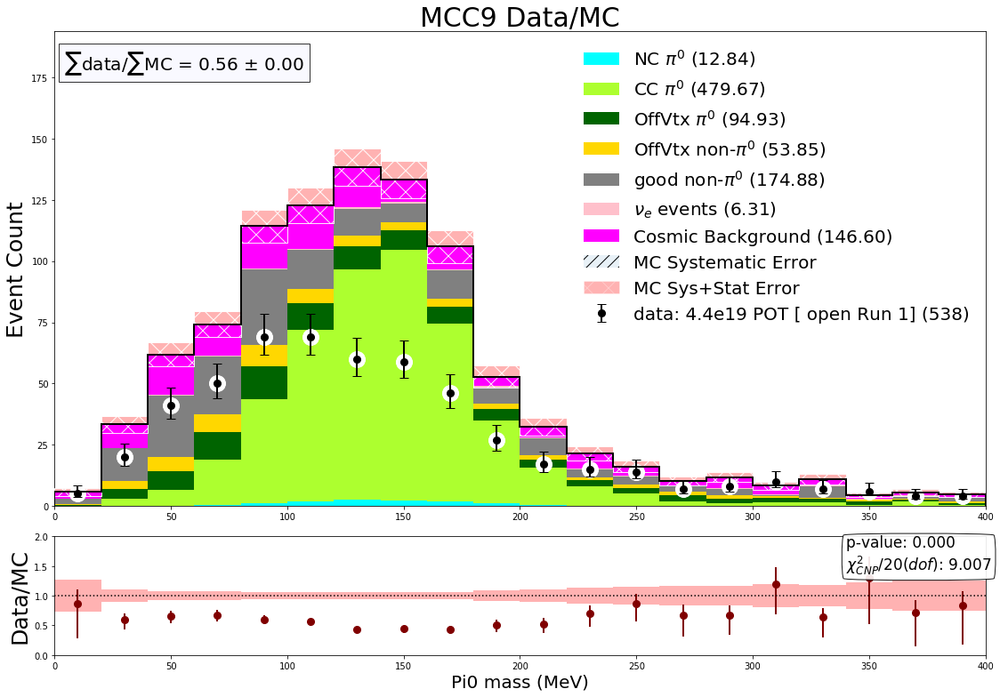

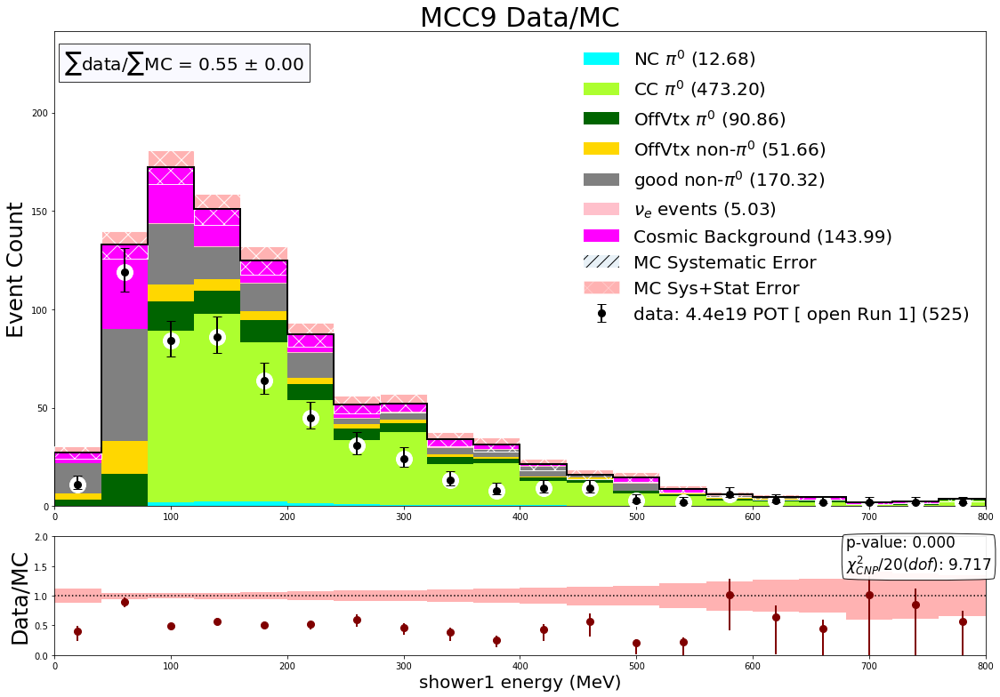

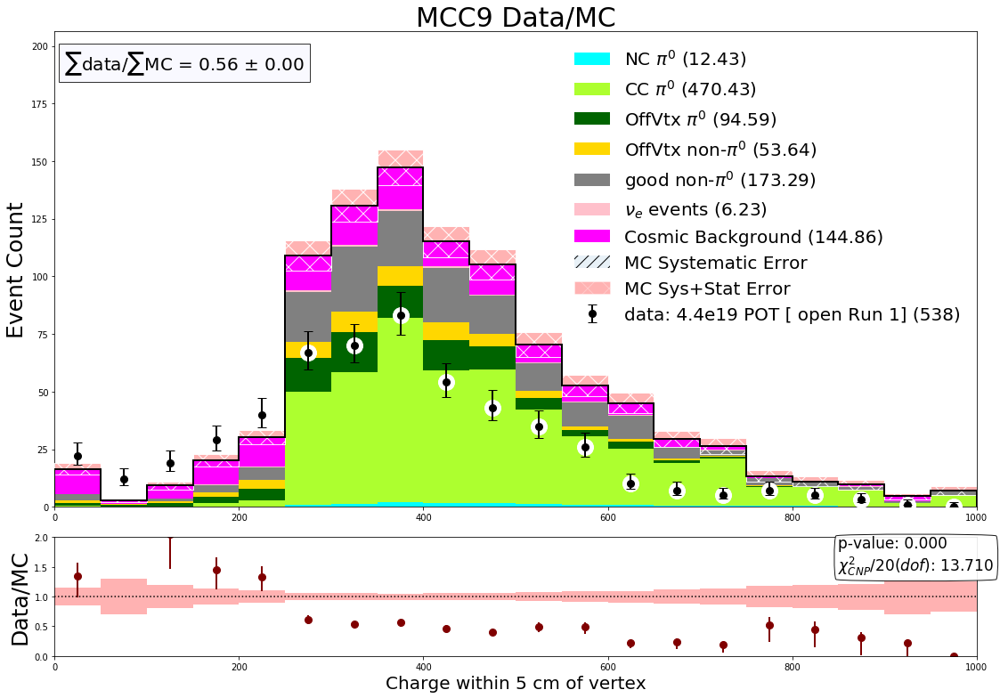

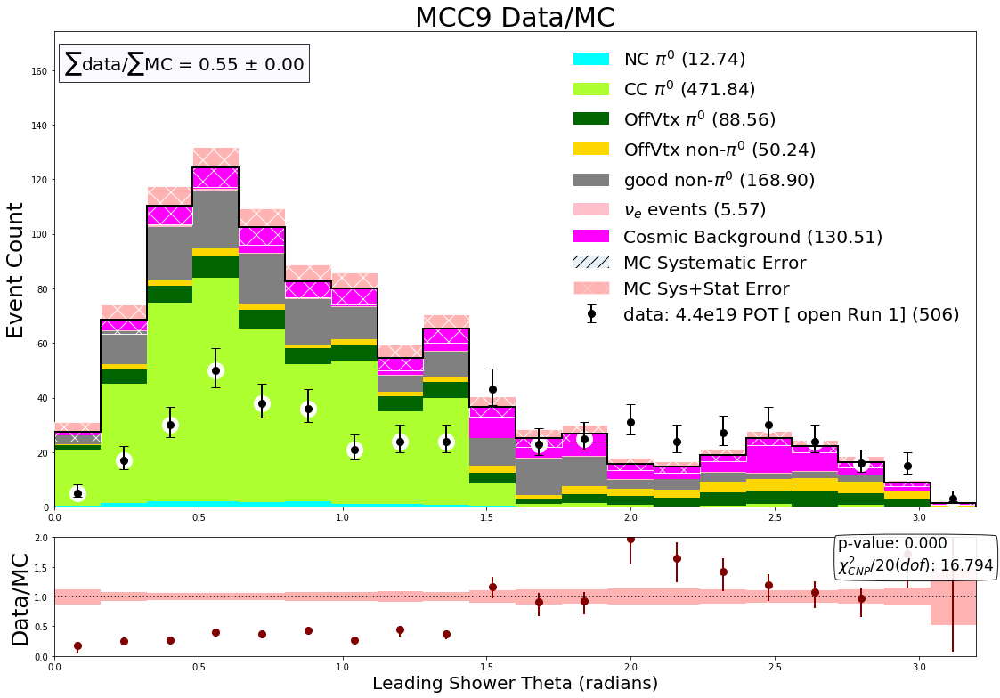

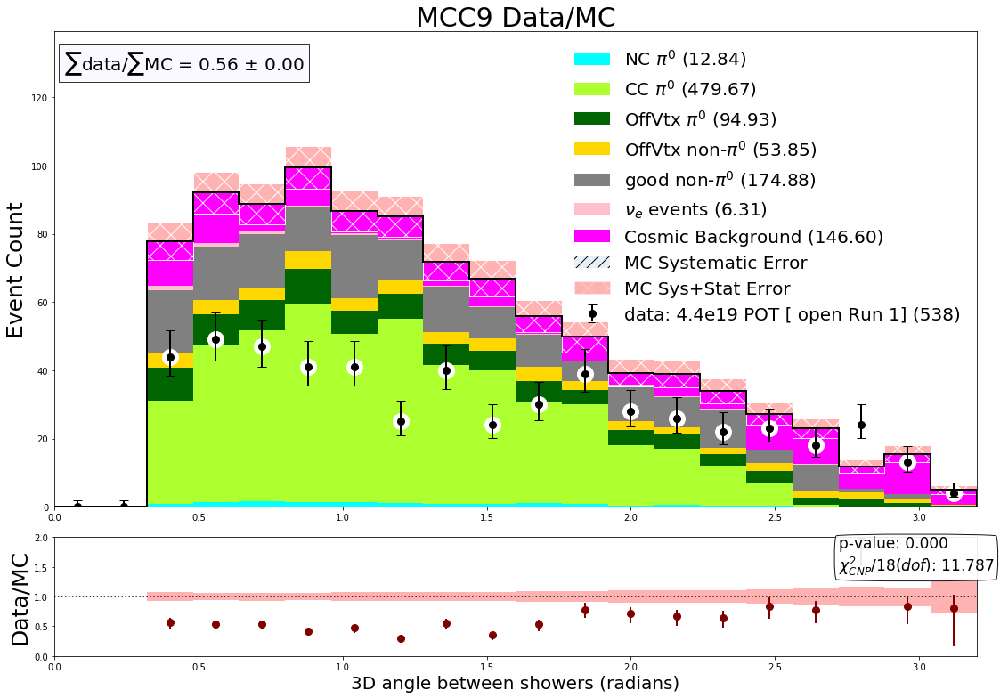

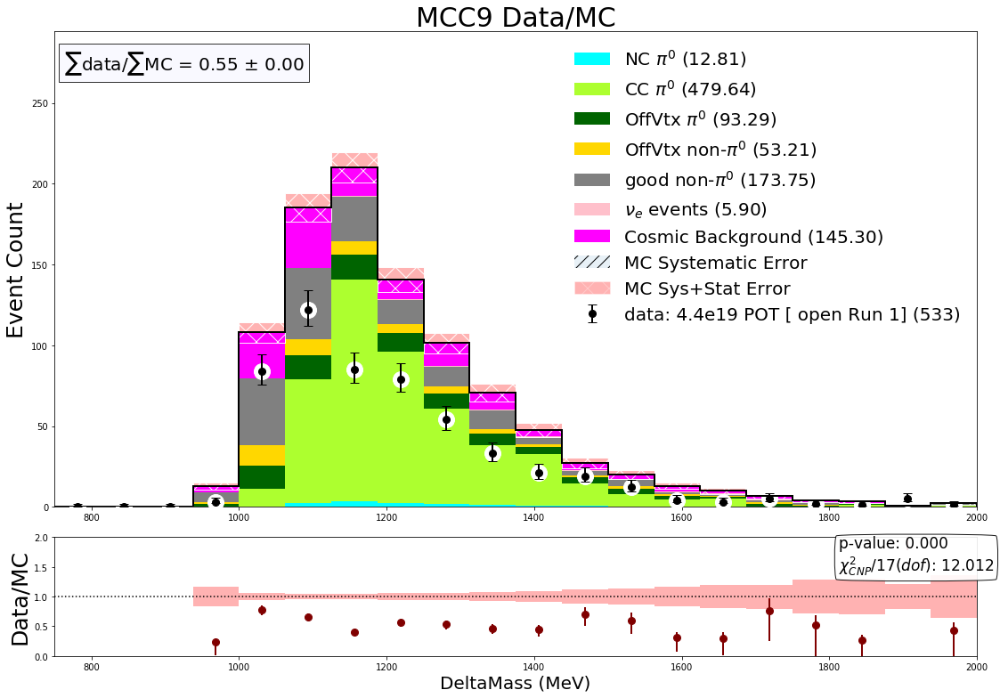

In [15]:
norm = 1.0
with PdfPages('output_preselection_210512.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        cov = np.zeros((nbins,nbins))
        
        run1_open_Hists = StackedHisto((df_bnb_ncpi0_pre,df_bnb_ccpi0_pre,df_bnb_ncpi0_offvtx_pre,df_bnb_ccpi0_offvtx_pre,df_bnb_other_offvtx_pre,df_bnb_other_good_pre,df_nue_pre),(NCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUE_R1_OPEN_SCALE*norm))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata(' MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_open_Hists.AddLayer(df_ext_pre,EXT_R1_OPEN_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_r1_open_pre,1.0,0,'','data: 4.4e19 POT [ open Run 1]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)

In [16]:
# plot all of the seperate pi0  distributions
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((0.0,400.0))
# detvar_list.append('../systematics/detvar_pi0mass_cov.txt')
sys_list.append('none')
detvar_list.append('none')
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('Delta mass (MeV)')
myrange_list.append((1000.0,1400.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(10)

vartest_list.append('pi0_energy_reco_new')
varname_list.append('Pi0 Energy (MeV)')
myrange_list.append((100.0,800.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('pi0_momentum_reco_new')
varname_list.append('Pi0 Momentum (MeV)')
myrange_list.append((100.0,800.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((80.0,450.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('shower2_E_Y_new')
varname_list.append('shower2 energy (MeV)')
myrange_list.append((35.0,350.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)


751
1425
383
672
930
928
2206


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 11.371345139996084
SUM 55.473924335726494
SUM 5.776643331118007
SUM 16.215504292520833
SUM 133.70435254886814
SUM 174.0526109012406
SUM 1.6551383449132768
SUM 20.010768893572823
Normalization Uncertainty: 0.0
yerr_mc_total [0.         2.31782908 3.90990629 4.23210413 4.50007243 4.8397527
 4.41942288 4.16088628 3.76498503 2.87403101 2.62234493 1.63999027
 1.84353168 1.53459185 1.28473471 0.98674034 1.31364591 0.69477466
 0.83990176 0.48548816]
yerr_data 59.4329781354318
ERROR HERE
[ 0.         -0.01447637  0.06172046  0.05798805  0.05641648  0.05333109
  0.0776274   0.0771186   0.09022469  0.06193185  0.0909067   0.1275993
  0.07626752 -0.03225629  0.17518617  0.11292383  0.1683474  -0.13779947
 -0.11319017 -0.29662121]
[0.         0.15567864 0.1198724  0.10569682 0.09604562 0.08642831
 0.11385927 0.11678992 0.13930426 0.15103362 0.20505885 0.40433121
 0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



737
870
383
672
271
339
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.06012376 0.06012376 0.06012376 ... 1.86424142 1.86424142 1.86424142]
SUM 44.25108728964429
SUM 219.01516683747212
SUM 22.907152523579466
SUM 64.30222687881299
SUM 527.0579848165696
SUM 687.1767514235472
SUM 6.563414831293635
SUM 85.75510522441058
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          9.27247101 15.63299695 16.82679165 17.91447834 19.1866716
 17.61042499 16.40254812 15.01313158 11.39657335 10.4703063   6.54162001
  7.41227071  6.12628097  5.09456512  3.91286906  5.20887118  2.75508148
  3.33058897  1.92514641]
yerr_data 110.18563975419903
ERROR HERE
[ 0.          0.06178971  0.03639762  0.03342746  0.02775577  0.02889963
  0.0289872   0.03352808  0.04334747  0.0514176   0.03492729  0.07407247
  0.07665115  0.08306871  0.02073232  0.06195422  0.13104742 -0.03545613
 -0.02895431 -0.07816695]
[0.         0.10331063 0.05095373 0.04544365 0.03773316 0.03728678
 0.03810034 0.04364043

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
SUM 77.63427563242419
SUM 320.7858332129161
SUM 156.4407554330619
SUM 51.057754892682745
SUM 58.75792374722231
SUM 13.069865503048604
SUM 102.42597440436268
Normalization Uncertainty: 0.0
yerr_mc_total [0.         2.42806873 3.77488118 4.20613697 5.32752499 6.36699756
 5.22729909 5.45984698 4.5860794  3.89053414 2.13064946 2.33084763
 1.87202424 2.7587383  1.63582957 2.08153429 0.73717493 1.41924777
 1.44348171 0.5175524 ]
yerr_data 99.50022969443638
ERROR HERE
[0.         0.19543996 0.1375772  0.10282143 0.08221416 0.07296247
 0.07746144 0.07233365 0.09134878 0.10102937 0.1850982  0.1450759
 0.0645639  0.18048779 0.20093037 0.06028489 0.42138617 0.26377258
 0.19118168 0.48500931]
[0.         0.36684536 0.18845633 0.14084709 0.10543483 0.09089583
 0.0937277  0.08881453 0.11321419 0.1

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
SUM 24.642255197082175
SUM 101.82211788860661
SUM 49.656585151362705
SUM 16.2064785895945
SUM 18.65062486942322
SUM 4.148566576992046
SUM 41.27177984967702
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.93934461 1.4186102  1.56695787 1.97914146 2.39134315
 1.82476866 1.94227502 1.61234848 1.44974977 0.74398143 0.86001514
 0.67023176 1.0729854  0.60475936 0.79296416 0.23399011 0.54687188
 0.55322558 0.16427871]
yerr_data 55.10447126987557
ERROR HERE
[ 0.          0.07400886  0.17388501  0.15559883  0.11716664  0.10446744
  0.12394213  0.12268138  0.10069108  0.13065694  0.28897785  0.27246139
  0.13783596  0.2359646  -0.05972609  0.17856231  0.24822586 -0.11515695
  0.1816306  -0.28870107]
[0.         0.57309895 0.32638622 0.27027792 0.18731286 0.15820755
 0.17436351 0.173

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



751
1425
383
672
930
928
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 11.386506933516081
SUM 55.48021267380861
SUM 5.806966918157998
SUM 16.217750127550165
SUM 133.70713438156187
SUM 174.06084566941152
SUM 1.6742399518834923
SUM 20.010768893572823
Normalization Uncertainty: 0.0
yerr_mc_total [2.41113728 4.01370093 4.75420233 5.31943262 4.62931216 4.81251438
 4.16689789 3.47144377 2.84169762 2.77772387]
yerr_data 48.19045976095675
ERROR HERE
[0.0497189  0.05958896 0.0710324  0.04043316 0.07453555 0.06466755
 0.06652936 0.08410642 0.087456   0.07494332]
[0.20527231 0.11184987 0.10576428 0.06760309 0.10857204 0.09885206
 0.11123518 0.14609434 0.17685079 0.16905015]
chi2 in bins
11.284563972345943
22.07403575816829
16.664385189443927
56.39467659646658
14.441570684315916
21.60911516769951
19.71283591691272
10.879664291547341
9.250450319751986
11.982805182666546
19.429410307931875 0.0


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



737
870
383
672
271
339
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.06012376 0.06012376 0.06012376 ... 1.86424142 1.86424142 1.86424142]
SUM 44.311211049548696
SUM 219.01516683747218
SUM 23.027400043388283
SUM 64.31113268840001
SUM 527.0579848165696
SUM 687.1767514235476
SUM 6.639161835086513
SUM 85.7551052244106
Normalization Uncertainty: 0.0
yerr_mc_total [ 9.61342064 15.89431081 18.95838127 21.12940784 18.3109511  19.14885876
 16.59902605 13.85620673 11.37863069 11.08245327]
yerr_data 90.68925054320425
ERROR HERE
[0.047343   0.03375052 0.0314192  0.02529732 0.03062315 0.03157267
 0.02908567 0.04341965 0.04376623 0.05951445]
[0.08629371 0.04702615 0.0401405  0.03214574 0.03927239 0.04019043
 0.04034385 0.05902774 0.06628045 0.08331543]
chi2 in bins
13.939553456770758
39.866979770427946
54.26422424805342
83.69468802345432
60.15693207100786
53.63207645450707
55.242331394660255
27.295484390486372
24.473577096158834
13.139060793326115
42.57049076988529 0.0


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
SUM 77.63427563242419
SUM 321.1514209521453
SUM 156.76746526955998
SUM 51.231463733482556
SUM 60.033302080662025
SUM 13.17218243090609
SUM 101.17687715552896
Normalization Uncertainty: 0.0
yerr_mc_total [2.01545619 3.96828615 5.57567183 5.70067018 5.96462461 5.26993305
 4.884956   4.73330187 4.68074222 4.11194994]
yerr_data 81.79690112037561
ERROR HERE
[0.33215184 0.11784722 0.08563591 0.0758619  0.06929119 0.0717502
 0.07889457 0.10387699 0.08767424 0.09717069]
[0.56546829 0.15908237 0.10503381 0.09238465 0.08546362 0.09014963
 0.10268984 0.13051493 0.11919054 0.13814518]
chi2 in bins
2.1540081942749327
0.2915058408068062
0.4405999149857493
2.3300645448545687
7.526980775335617
8.442424017791206
7.376059866999196
0.01696011075555618
5.889138932569753
4.711719303313808
3.9179461501687

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
SUM 24.642255197082175
SUM 101.93816078710215
SUM 49.76028763458686
SUM 16.26161631774496
SUM 19.055448616530164
SUM 4.181043467214932
SUM 40.76846546126632
Normalization Uncertainty: 0.0
yerr_mc_total [0.77557491 1.47082896 2.04685003 2.05802815 2.17668586 1.88868375
 1.7813608  1.73962194 1.75287195 1.54156485]
yerr_data 45.55593078577284
ERROR HERE
[0.21822323 0.15162923 0.13463266 0.10105144 0.11700613 0.11569394
 0.12551258 0.10434418 0.1286005  0.16709997]
[0.90096896 0.27637981 0.19362605 0.15170215 0.16634473 0.17226345
 0.19815842 0.18538581 0.22338134 0.2902556 ]
chi2 in bins
0.2714123883102181
1.5351769973431486
0.3825927229520082
6.388351559826724
1.6631149323071384
3.0048233140636533
2.6103309039072067
7.439800671414271
3.127530184915267
0.5789145141605467
2.700204818920

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



751
1425
383
672
930
928
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 11.310697965916107
SUM 55.014425299094455
SUM 5.776643331118008
SUM 16.206895712188878
SUM 133.69131545192346
SUM 172.9196811401644
SUM 1.5953970966753728
SUM 19.575752178495158
Normalization Uncertainty: 0.0
yerr_mc_total [2.78305459 5.07717688 5.47734537 5.08269697 4.23898192 3.7883694
 3.53282604 2.65949112 2.23418772 2.0569283  1.98035762 1.56248887
 1.27171489 1.10493988 1.08852849 0.1709973  0.49367032 0.4938994
 0.70337088 0.09087495]
yerr_data 57.26037922386218
ERROR HERE
[ 0.07834971  0.04524784  0.05942422  0.07310909  0.0569159   0.07025828
  0.06906205  0.11597783 -0.01220404  0.13642827  0.02969856  0.09546674
  0.13960285  0.08987154  0.23028025 -0.30380113 -0.24975119 -0.24724776
 -0.12160772 -1.0698621 ]
[ 0.19107195  0.0770317   0.08599551  0.10338034  0.09886392  0.12203987
  0.12963108  0.21769309  0.13124

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



737
870
383
672
271
339
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.06012376 0.06012376 0.06012376 ... 1.86424142 1.86424142 1.86424142]
SUM 44.010592250026654
SUM 217.25747568028967
SUM 22.907152523579466
SUM 64.26808974217988
SUM 527.0579848165697
SUM 682.7788300685212
SUM 6.326512220747694
SUM 83.89086380648864
Normalization Uncertainty: 0.0
yerr_mc_total [10.93618144 20.25712095 21.81209786 20.20446771 16.91328197 15.02256249
 13.94850922 10.59288663  8.88774512  8.18702906  7.88478843  6.23559427
  5.14034421  4.38159499  4.3740034   0.67798738  1.95760802  1.95852336
  2.78918289  0.36027069]
yerr_data 108.56550322954881
ERROR HERE
[0.04849434 0.0289611  0.02790179 0.03125939 0.02806368 0.03214694
 0.03387362 0.04439751 0.05034353 0.081884   0.05739941 0.0740412
 0.06424267 0.07076739 0.14394927 0.4193763  0.2370419  0.23330139
 0.05292478 0.48899322]
[0.0775273  0.03693224 0.03458041 0.03889092 0.03859671 0.04522477
 0.04934193 0.0700945  0.0857068  0.12516

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
SUM 77.4764862235572
SUM 319.39283121318766
SUM 155.3757676934866
SUM 50.93282588253135
SUM 59.66324575103257
SUM 12.639735818253358
SUM 103.67507165319635
Normalization Uncertainty: 0.0
yerr_mc_total [2.7885057  6.22996255 6.17313527 6.16527868 5.30645998 4.0331865
 4.02533674 3.39695393 2.82087999 2.71447402 2.37030181 2.29878539
 1.32820112 2.06141446 1.9351587  0.8717464  0.74765136 0.57757813
 1.32654581 0.36098194]
yerr_data 101.26473611891952
ERROR HERE
[ 0.19745388  0.08620348  0.07252377  0.06794923  0.08536328  0.10138874
  0.0891127   0.11310038  0.1103139   0.11046637  0.18093888  0.15267185
  0.18268008  0.09184763  0.09379591  0.38472501  0.24759929  0.12718972
  0.44016596 -0.17471266]
[0.28230065 0.10620039 0.08895155 0.08442785 0.10678521 0.13002511
 0.12206857 0.154

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
SUM 24.592170529594487
SUM 101.37995866849778
SUM 49.31854245763507
SUM 16.166824293543016
SUM 18.93798732204726
SUM 4.012037120457288
SUM 41.77509423808771
Normalization Uncertainty: 0.0
yerr_mc_total [1.0352811  2.35469773 2.27710454 2.27495899 1.94892389 1.42246371
 1.45367029 1.20457068 0.99698341 0.96676445 0.870812   0.85127597
 0.42159047 0.7876509  0.75468896 0.27670507 0.23731548 0.18333175
 0.52289901 0.11458095]
yerr_data 55.604445990882965
ERROR HERE
[ 0.14995837  0.12186466  0.12666604  0.09454375  0.12323518  0.15294969
  0.14384692  0.13511755  0.12534468  0.09411442  0.33833484  0.16583624
  0.25032208  0.08748318 -0.07323812  0.18452635 -0.1473831  -0.23463943
  0.31333153  2.02077309]
[0.40656813 0.1814514  0.1764896  0.1445214  0.18837968 0.24147596
 0.24489063 0.2

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



751
1425
383
672
930
928
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 10.71938801863631
SUM 51.58759784590178
SUM 5.306627731998169
SUM 14.596246045601102
SUM 122.51298549338907
SUM 162.41846943836097
SUM 1.5786019295553588
SUM 16.965651888029136
Normalization Uncertainty: 0.0
yerr_mc_total [4.75885939 5.73339616 4.93027509 4.18243182 3.84582889 3.07790134
 2.81790505 2.13809372 1.99885563 1.9350426  1.62573701 1.48302851
 0.72123496 1.28961663 0.1320494  0.5017303  0.5017216  0.50148858
 0.49747761 0.09086428]
yerr_data 53.83415269242808
ERROR HERE
[ 0.06655032  0.05040946  0.06906783  0.07261133  0.05583534  0.0982654
  0.07454291  0.0477017   0.10455159  0.06624519  0.08609873  0.05027878
  0.33089636  0.16440421 -0.44813474 -0.20914232 -0.21415419 -0.22063277
  0.40630572 -1.09910408]
[ 0.10173011  0.07505759  0.10204682  0.11608284  0.10844242  0.17458579
  0.16814696  0.19694397  0.28346

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



737
870
383
672
271
339
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.06012376 0.06012376 0.06012376 ... 1.86424142 1.86424142 1.86424142]
SUM 41.66576561375476
SUM 203.66490419616773
SUM 21.043315966542814
SUM 57.88109378973314
SUM 482.76870388241616
SUM 643.074768807069
SUM 6.259911353630851
SUM 72.70541529895681
Normalization Uncertainty: 0.0
yerr_mc_total [18.9504021  22.80123835 19.62730611 16.67545074 15.31579533 12.07356641
 11.21877939  8.56583996  7.95762153  7.67334942  6.52384052  5.92261209
  2.85937671  5.1625457   0.52351395  1.98956914  1.98954431  1.98862835
  1.97271494  0.36025392]
yerr_data 101.54137723397697
ERROR HERE
[ 0.03292881  0.02472977  0.03235465  0.03322772  0.02434119  0.04991549
  0.04077464  0.04281508  0.06433411  0.06745632  0.06603306  0.0500092
  0.12295124  0.10285378  0.43572869  0.36132822  0.09363811  0.09595196
  0.22397595 -0.28957598]
[0.0417714  0.03093571 0.0406516  0.04415449 0.03758208 0.06954954
 0.06437473 0.08036491

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
SUM 73.65447449108403
SUM 301.57573313742233
SUM 146.07425025473938
SUM 43.750401404258284
SUM 55.05316438875353
SUM 12.400580684654797
SUM 96.18048816019423
Normalization Uncertainty: 0.0
yerr_mc_total [6.08684805 6.59678271 6.11323674 4.25529566 4.28891125 3.83472601
 3.15838635 2.76696499 3.12514493 2.44412211 1.90415085 1.85812443
 1.10694251 1.93993754 0.91648484 0.752796   0.5237072  1.3099543
 0.42424499 0.35328325]
yerr_data 95.12015632643516
ERROR HERE
[ 0.07557508  0.07211762  0.07437089  0.08119375  0.10742048  0.10704086
  0.10822597  0.10351309  0.11019533  0.15772648  0.19872725  0.16703972
  0.0789997   0.13516822  0.20835528  0.46665273  0.15499481  0.12331322
  0.92711142 -0.18610148]
[0.09440801 0.08854928 0.09141652 0.10568248 0.13776045 0.14606175
 0.15079621 0.16

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
SUM 23.379008073828498
SUM 95.72455100122922
SUM 46.3661047028093
SUM 13.887017655488243
SUM 17.474680033054604
SUM 3.936125781221881
SUM 38.755207907623536
Normalization Uncertainty: 0.0
yerr_mc_total [2.27480749 2.47280779 2.26076493 1.4862309  1.55886989 1.40078883
 1.09421096 0.98164275 1.16983264 0.89113469 0.67928891 0.66632333
 0.35135975 0.75592407 0.2909057  0.23894847 0.16623233 0.51866765
 0.13466157 0.11213727]
yerr_data 51.72372032347575
ERROR HERE
[ 0.13677922  0.10564858  0.08920898  0.13115594  0.13804616  0.17715353
  0.11779832  0.23249031  0.09864342  0.0429571   0.36646915  0.06709051
  0.3588006  -0.07321297  0.16718261 -0.14400101 -0.28593423 -0.19956669
  1.59924339  1.00126017]
[0.19341348 0.15495908 0.14084255 0.20706813 0.23080922 0.29619563
 0.25010953 0.42

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



751
1425
383
672
930
928
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 10.992300301996213
SUM 53.84940547380722
SUM 5.700834363518033
SUM 15.939686829882769
SUM 131.6280597156705
SUM 170.44606415641735
SUM 1.4567488086584919
SUM 18.705718748339816
Normalization Uncertainty: 0.0
yerr_mc_total [5.23192337 4.71313259 4.22166009 4.30306441 4.08171506 3.16541084
 2.69854054 3.03069693 2.47798385 2.06019697 2.33034939 1.70821947
 1.31915951 1.48410176 1.66171184 1.00530858 0.99529188 1.01915963
 1.10161695 0.68336045]
yerr_data 62.21150253468215
ERROR HERE
[ 0.05715019  0.04016525  0.085719    0.0515219   0.08104245  0.09690771
  0.11876428  0.08484659  0.0747799   0.10122456  0.08152074  0.10814985
  0.12011219  0.05087318 -0.02417929  0.28847197  0.21823418  0.10260098
 -0.0540541   0.42228244]
[0.08736088 0.07539111 0.12981454 0.09391074 0.12956157 0.16833041
 0.21647573 0.17157412 0.20274377 0.27

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



737
870
383
672
271
339
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.06012376 0.06012376 0.06012376 ... 1.86424142 1.86424142 1.86424142]
SUM 42.808117051938524
SUM 212.73769841896313
SUM 22.60653372405742
SUM 63.208478775778595
SUM 519.0192298557166
SUM 673.1674681836812
SUM 5.776705473353928
SUM 80.16238097064469
Normalization Uncertainty: 0.0
yerr_mc_total [20.76637448 18.80972314 16.77070804 17.13663362 16.26248155 12.42383189
 10.79395971 12.05964986  9.82619334  8.16942579  9.29484161  6.81066589
  5.23107197  5.92744856  6.58946793  4.04824133  3.94632785  4.04143864
  4.36841893  2.80050012]
yerr_data 113.68597785894819
ERROR HERE
[0.02798864 0.03100062 0.04036889 0.03164109 0.02895708 0.04670913
 0.04373265 0.03771679 0.04388759 0.05331731 0.04757552 0.08013835
 0.09322667 0.09134263 0.04879227 0.14033916 0.02595545 0.10225786
 0.02344949 0.10495617]
[0.03562814 0.03983475 0.05147987 0.0422986  0.04116756 0.06508197
 0.06825056 0.05954702 0.07623353 0.0971

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
SUM 75.74080272602029
SUM 310.29489532302614
SUM 153.4022137899626
SUM 49.7213846371009
SUM 57.88130143045955
SUM 11.09551954426207
SUM 101.17687715552898
Normalization Uncertainty: 0.0
yerr_mc_total [4.87502889 6.07268301 5.39711166 4.84390939 5.17147591 4.1123352
 3.62708445 4.14234537 2.67640741 2.29715392 2.1917835  2.72196246
 1.40446736 1.46601127 1.77292756 2.10371378 1.68522902 1.01137396
 0.8333492  0.79788356]
yerr_data 104.51020411768349
ERROR HERE
[0.09589898 0.08148004 0.08358823 0.09174512 0.08792114 0.08907299
 0.11323887 0.10160763 0.13844726 0.12160352 0.17726275 0.11885963
 0.21858023 0.17191263 0.19560521 0.17495023 0.06607973 0.04378473
 0.06403859 0.15093711]
[0.11787879 0.10222241 0.10568249 0.11658211 0.11443891 0.12469499
 0.15339282 0.14224247 0.20784214 0.20

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
SUM 24.041239187229955
SUM 98.49214067643538
SUM 48.692107567379885
SUM 15.782295113834913
SUM 18.372372117463428
SUM 3.5218802768055073
SUM 40.768465461266324
Normalization Uncertainty: 0.0
yerr_mc_total [1.75138717 2.29205654 1.99804688 1.77003172 1.93699067 1.51017013
 1.3076614  1.54974196 0.95601146 0.79233056 0.76166388 1.01728204
 0.44579849 0.46533343 0.6425097  0.79883956 0.61827429 0.32102489
 0.26451723 0.25325992]
yerr_data 57.30365419259502
ERROR HERE
[ 0.13805759  0.10693365  0.1192871   0.13920197  0.16285328  0.13950661
  0.13079273  0.12971012  0.24366021  0.23863237  0.08834907  0.04139088
  0.15493477  0.26063424  0.30719735 -0.04633537 -0.05479405 -0.08077402
  0.20175058 -0.12952362]
[0.205562   0.16882613 0.18616321 0.21492373 0.24248174 0.24785805
 0.25402337 0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



751
1425
383
672
930
928
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
SUM 11.174241824236153
SUM 53.69769492049685
SUM 5.640187189438056
SUM 15.25211311587882
SUM 122.52623676434074
SUM 162.3503757163818
SUM 1.6127628218337502
SUM 18.705718748339816
Normalization Uncertainty: 0.0
yerr_mc_total [6.08448419e+00 5.36885691e+00 4.80822279e+00 4.14650768e+00
 3.40827066e+00 3.27629499e+00 2.39851178e+00 2.39321487e+00
 1.99930065e+00 1.22605189e+00 9.99084576e-01 1.17901660e+00
 9.94722877e-01 9.78332301e-01 9.69961703e-02 4.89346947e-01
 4.93655804e-01 4.84757979e-01 4.89109531e-01 1.55596015e-03]
yerr_data 52.82148238983977
ERROR HERE
[  0.04620766   0.05993524   0.07310798   0.05366843   0.06714801
   0.09854831   0.08401682   0.06226184   0.13014058   0.19554429
   0.09338608   0.08696689   0.23365973  -0.07588394   1.23856275
   0.49968252  -0.26175584  -0.34864496  -0.3030896  -32.22736247]
[6.77

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control t

737
870
383
672
271
339
2206
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.06012376 0.06012376 0.06012376 ... 1.86424142 1.86424142 1.86424142]
SUM 43.469478410886985
SUM 211.98440220874173
SUM 22.366038684439793
SUM 60.48192028236301
SUM 482.7686624371445
SUM 640.8260624359909
SUM 6.39537562326081
SUM 80.16238097064469
Normalization Uncertainty: 0.0
yerr_mc_total [2.41754080e+01 2.14185751e+01 1.90929763e+01 1.65335503e+01
 1.35521857e+01 1.29917798e+01 9.42160710e+00 9.56886606e+00
 7.92816718e+00 4.86112055e+00 4.02438861e+00 4.72809514e+00
 4.00736913e+00 3.87908187e+00 3.84564535e-01 1.94048478e+00
 1.95757722e+00 1.92228723e+00 1.93861447e+00 5.03788668e-03]
yerr_data 98.5010657467551
ERROR HERE
[ 0.0233583   0.02938114  0.03007982  0.03493957  0.03567922  0.03758216
  0.06226421  0.03860709  0.06422967  0.06320853  0.14009433  0.10236943
  0.14534075  0.03301744  1.26763435  0.12716267 -0.06623279  0.47042267
  0.13494274 20.81826536]
[2.88100775e-02 3.61152292e-0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
SUM 74.19443455463194
SUM 306.0024805490136
SUM 152.64094449056233
SUM 48.01944794394871
SUM 57.45183568731561
SUM 12.706923731809207
SUM 91.18409916485946
Normalization Uncertainty: 0.0
yerr_mc_total [7.41552717 6.16102284 5.55316976 4.66052464 4.07621849 3.54116918
 3.1991053  1.8695752  3.08215722 1.30559415 1.88429688 1.55993245
 0.85779959 1.43074206 1.53131125 1.34769312 0.44644346 1.37635589
 0.39199476 0.31573874]
yerr_data 93.60499283995627
ERROR HERE
[ 0.06616066  0.06456972  0.0846656   0.07880116  0.10953311  0.10901116
  0.11238952  0.15569878  0.12289294  0.17377251  0.19007317  0.25372166
  0.284319    0.20624715  0.14549853  0.21580346  0.22447484  0.26784991
  0.29274182 -0.25676806]
[0.07928113 0.07894673 0.10271947 0.10167057 0.14103013 0.15260682
 0.16264403 0.242

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


450
2619
1357
954
1064
2530
hstack gh_weights [1.         1.         1.09433712 ... 1.         1.         1.        ]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
SUM 23.550399299853183
SUM 97.12966541133758
SUM 48.450469551223925
SUM 15.242075501037778
SUM 18.236053405725016
SUM 4.033363547457665
SUM 36.741950353980755
Normalization Uncertainty: 0.0
yerr_mc_total [2.78411464 2.23112032 2.01698709 1.66287386 1.46788604 1.28371684
 1.14869794 0.59343053 1.15828492 0.41441469 0.67368782 0.58420592
 0.27227814 0.54988121 0.57652624 0.52831923 0.14170769 0.53571242
 0.12442487 0.1002201 ]
yerr_data 51.84209960539669
ERROR HERE
[ 0.09668877  0.11371446  0.12088781  0.12168949  0.10265271  0.14167702
  0.15113005  0.24498305  0.13367639  0.44575411  0.19906847  0.50085879
  0.19185616  0.41907706 -0.08222786  0.28391706  0.7071975  -0.1451994
 -0.54004974 -0.8089358 ]
[0.13602311 0.15772987 0.17609096 0.19212256 0.19937031 0.27516264
 0.30561044 0.5

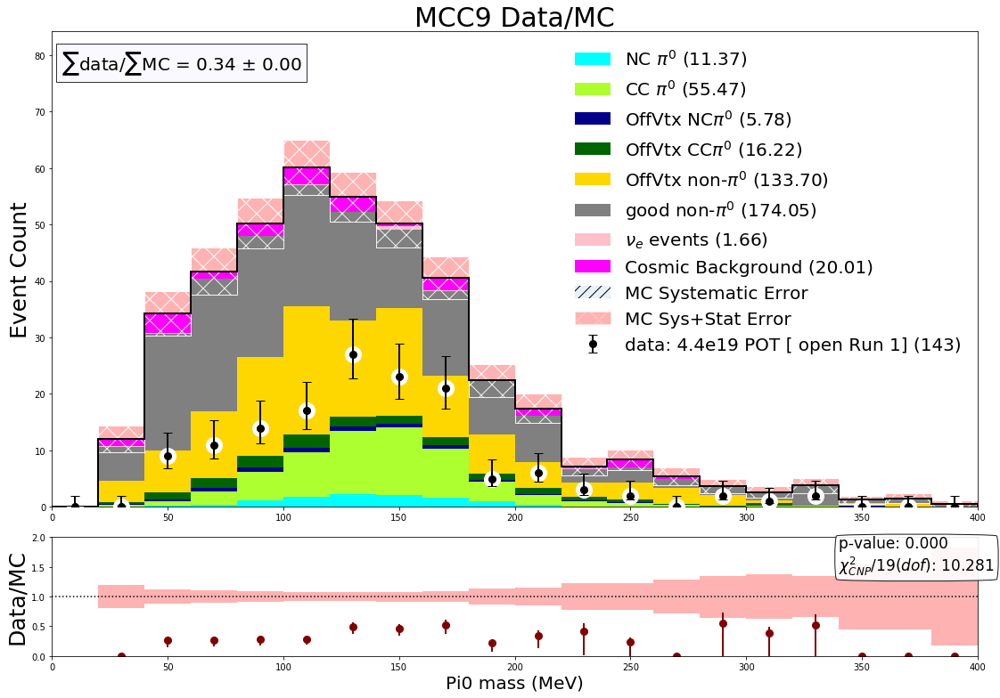

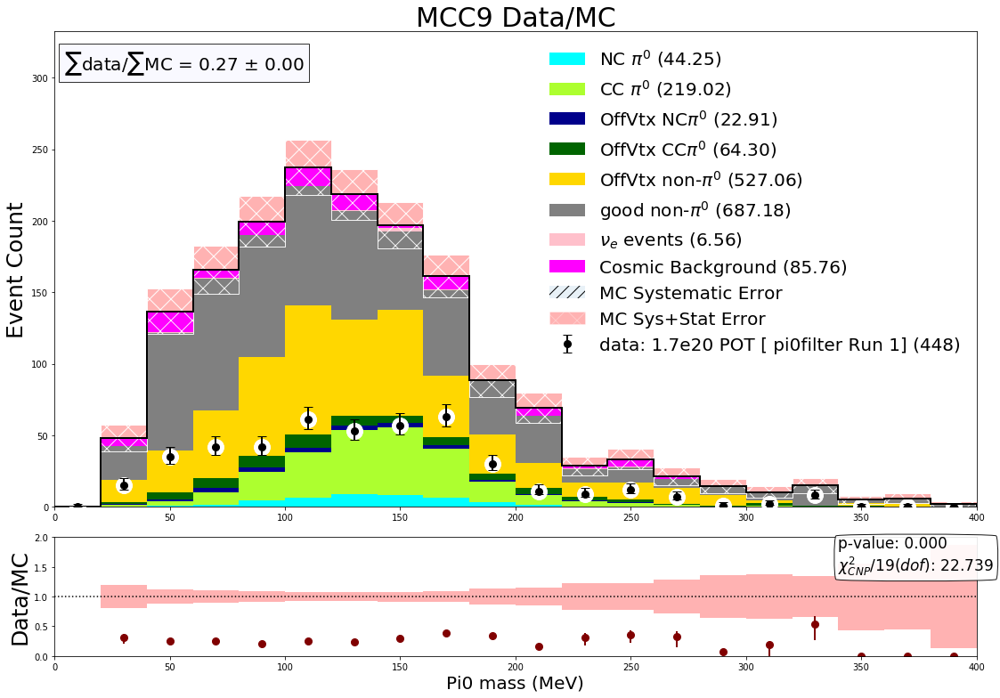

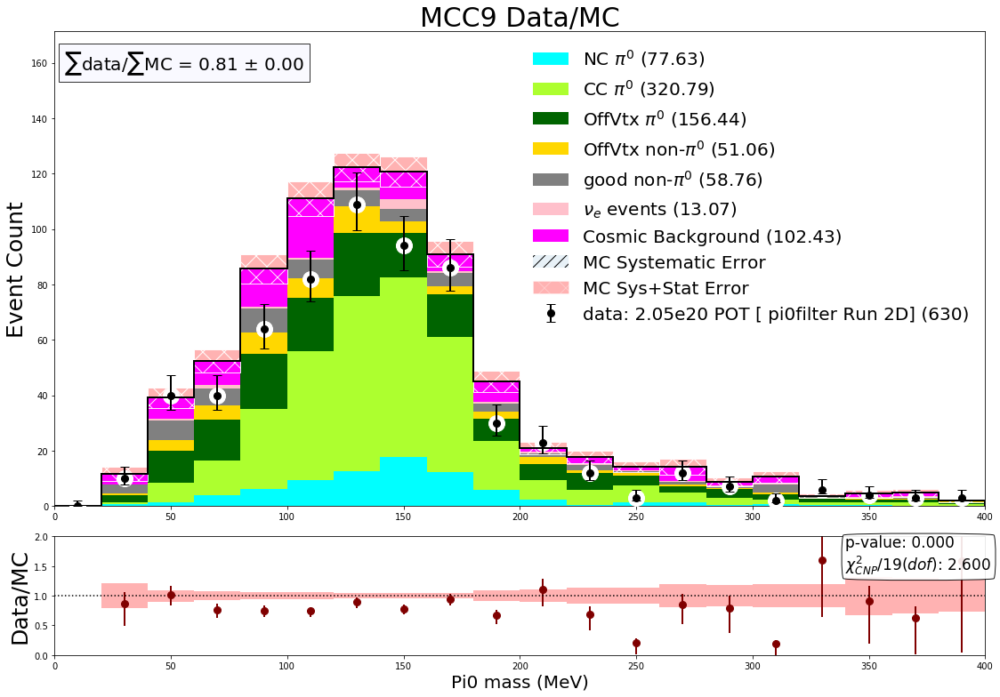

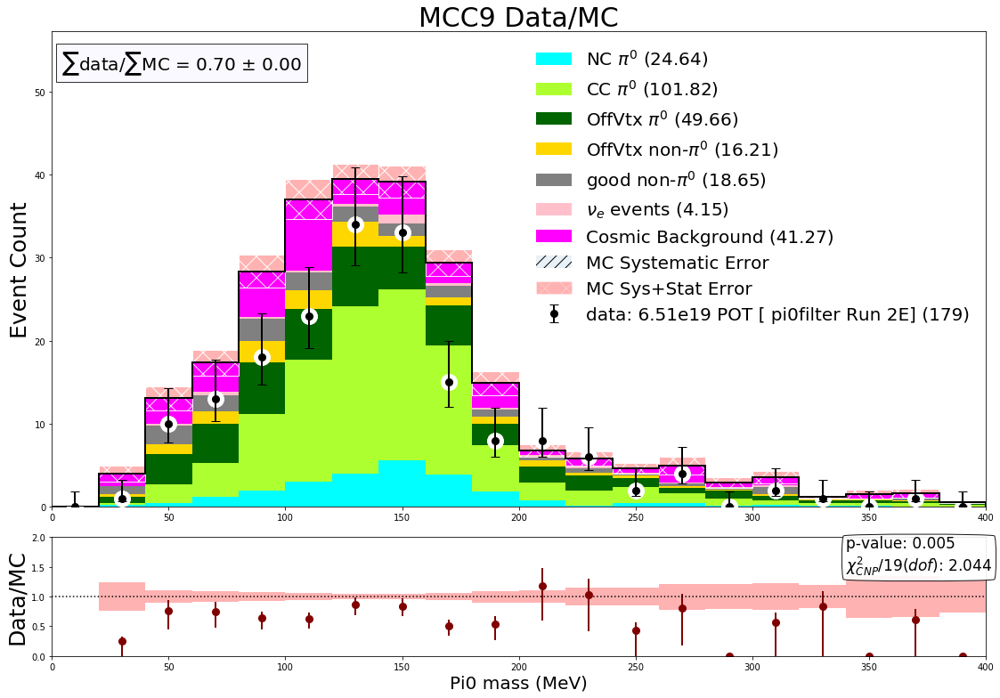

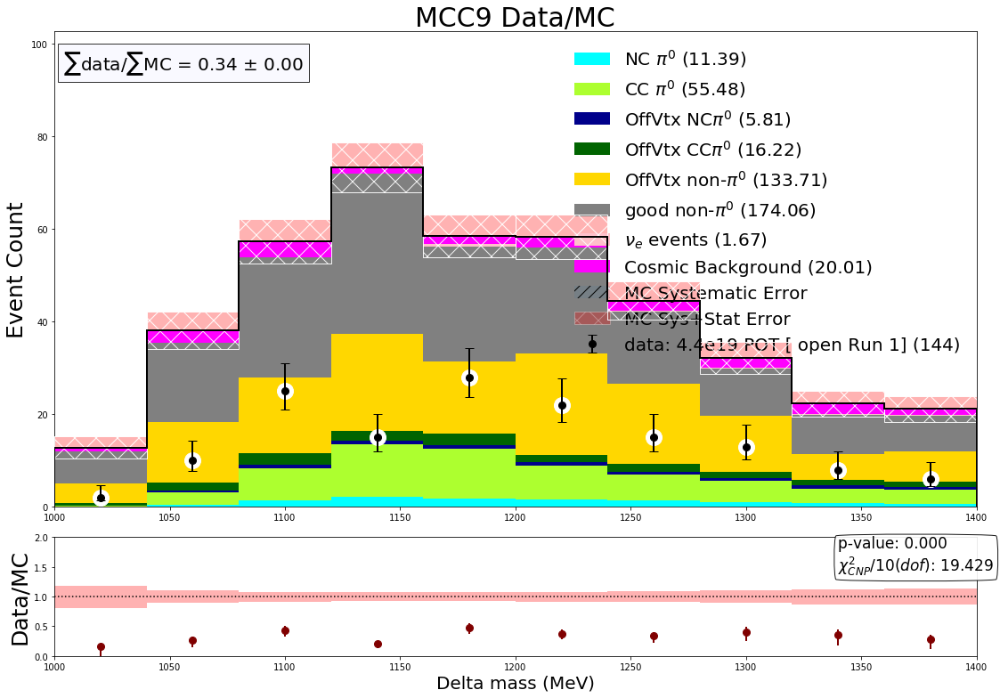

...

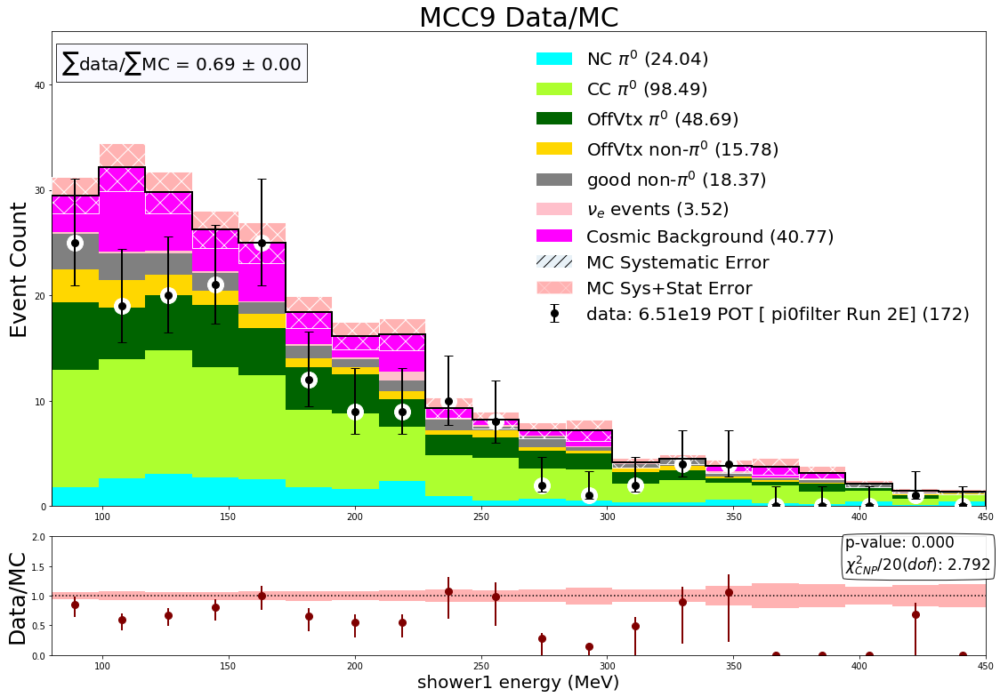

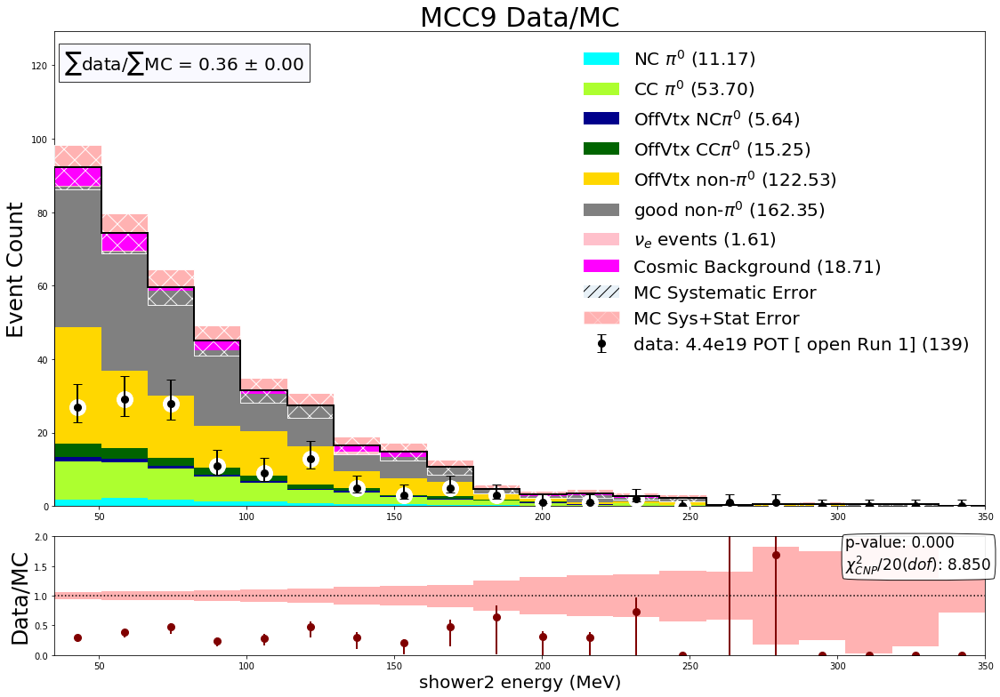

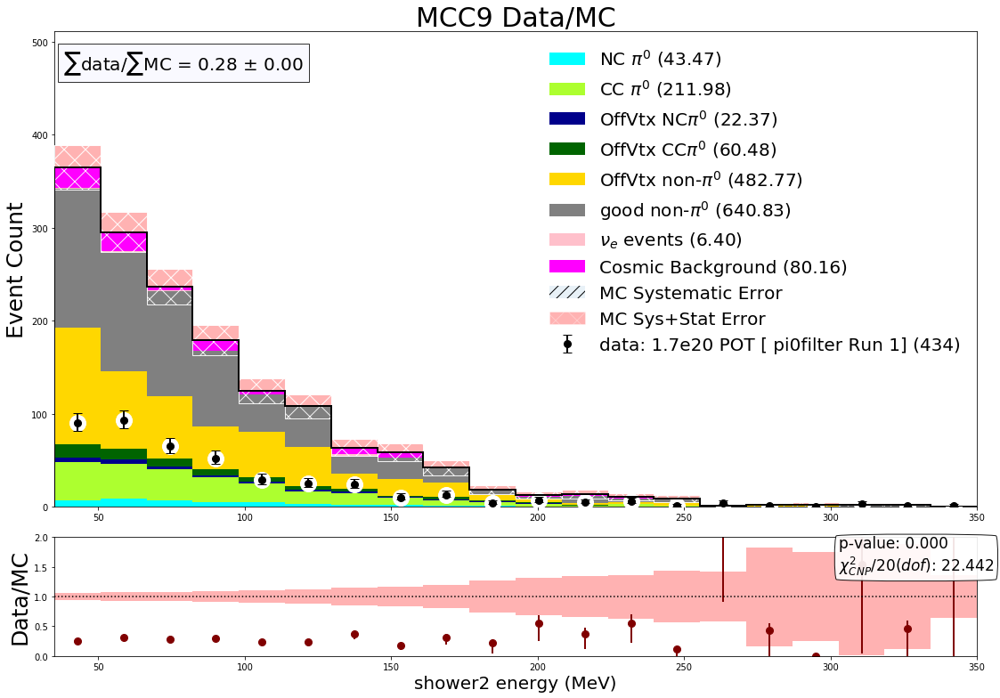

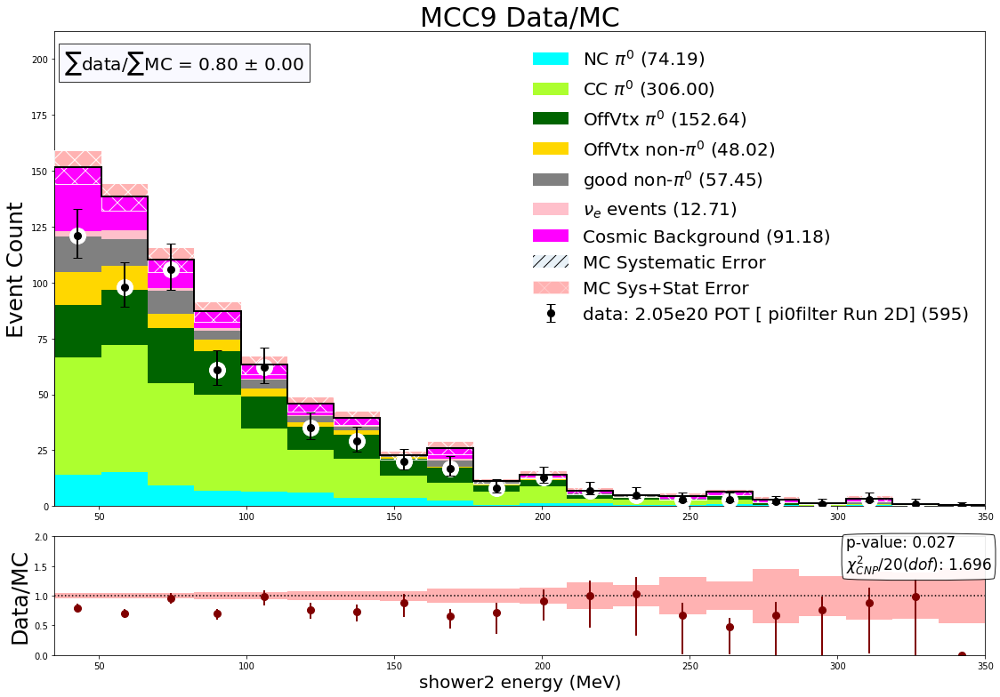

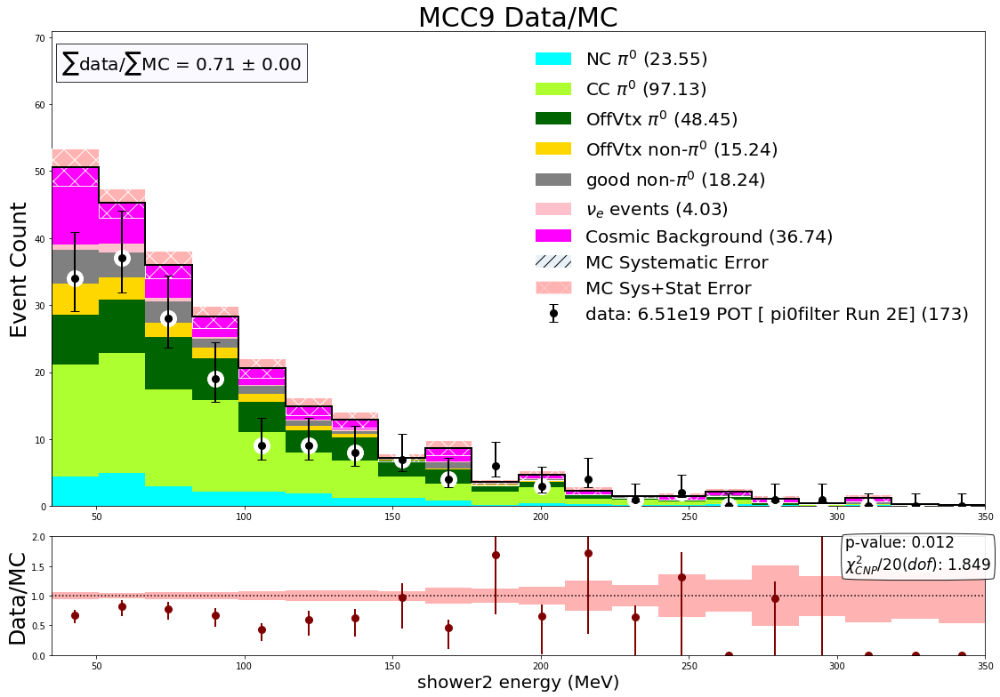

In [17]:
norm = 1.0
with PdfPages('output_201109.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        s_cov = np.zeros((nbins,nbins))
        if detvar_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov = np.genfromtxt(detvar_list[i],delimiter=',')
        
        cov = s_cov +d_cov
        run1_open_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_ncpi0_offvtx,df_bnb_ccpi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUE_R1_OPEN_SCALE*norm))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr>=5 ',r"OffVtx NC$\pi^0$",'darkblue')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==0 and MC_scedr>=5',r"OffVtx CC$\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_open_Hists.AddLayer(df_ext_pi0,EXT_R1_OPEN_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_r1_open_pi0,1.0,0,'','data: 4.4e19 POT [ open Run 1]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        run1_pi0filter_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_ncpi0_offvtx,df_bnb_ccpi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NCPI0_R1_PI0FILTER_SCALE*norm,CCPI0_R1_PI0FILTER_SCALE*norm,NCPI0_R1_PI0FILTER_SCALE*norm,CCPI0_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUE_R1_PI0FILTER_SCALE*norm))
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr>=5 ',r"OffVtx NC$\pi^0$",'darkblue')
        run1_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==0 and MC_scedr>=5 ',r"OffVtx CC$\pi^0$",'darkgreen')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_pi0filter_Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_pi0filter_DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [ pi0filter Run 1]')
        fig3,ax3,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_pi0filter_Hists,run1_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        run2D_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r2,df_bnb_ccpi0_r2,df_bnb_pi0_offvtx_r2,df_bnb_other_offvtx_r2,df_bnb_other_good_r2,df_nue_r2_pi0),(NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUE_R2D_PI0FILTER_SCALE*norm))
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2D_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2D_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2D_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2D_pi0filter_DataHist = SimpleHisto(df_data_r2D_pi0filter_pi0,1.0,0,'','data: 2.05e20 POT [ pi0filter Run 2D]')
        fig4,ax4,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2D_pi0filter_Hists,run2D_pi0filter_DataHist,varname,m_cov=cov)
        
        cov = np.zeros((nbins,nbins))
        run2E_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r2,df_bnb_ccpi0_r2,df_bnb_pi0_offvtx_r2,df_bnb_other_offvtx_r2,df_bnb_other_good_r2,df_nue_r2_pi0),(NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUE_R2E_PI0FILTER_SCALE*norm))
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2E_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2E_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2E_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2E_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2E_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2E_pi0filter_DataHist = SimpleHisto(df_data_r2E_pi0filter_pi0,1.0,0,'','data: 6.51e19 POT [ pi0filter Run 2E]')
        fig5,ax5,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2E_pi0filter_Hists,run2E_pi0filter_DataHist,varname,m_cov=cov)

#         cov = np.zeros((nbins,nbins))
#         run3F_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r3,df_bnb_ccpi0_r3,df_bnb_pi0_offvtx_r3,df_bnb_other_offvtx_r3,df_bnb_other_good_r3,df_nue_r3_pi0),(NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUE_R3F_PI0FILTER_SCALE*norm))
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#         run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#         run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#         run3F_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#         run3F_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3F_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#         run3F_pi0filter_DataHist = SimpleHisto(df_data_r3F_pi0filter_pi0,1.0,0,'','data: 4.3e19 POT [ pi0filter Run 3F]')
#         fig6,ax6,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3F_pi0filter_Hists,run3F_pi0filter_DataHist,varname,m_cov=cov)

#         cov = np.zeros((nbins,nbins))
#         run3G_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r3,df_bnb_ccpi0_r3,df_bnb_pi0_offvtx_r3,df_bnb_other_offvtx_r3,df_bnb_other_good_r3,df_nue_r3_pi0),(NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUE_R3G_PI0FILTER_SCALE*norm))
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#         run3G_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#         run3G_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#         run3G_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#         run3G_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3G_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#         run3G_pi0filter_DataHist = SimpleHisto(df_data_r3G_pi0filter_pi0,1.0,0,'','data: 2e20 [ pi0filter Run 3G]')
#         fig7,ax7,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3G_pi0filter_Hists,run3G_pi0filter_DataHist,varname,m_cov=cov)
        
        #save to pdf file of plots
        pdf.savefig(fig1)
        pdf.savefig(fig3)
        pdf.savefig(fig4)
        pdf.savefig(fig5)
#         pdf.savefig(fig6)
#         pdf.savefig(fig7)

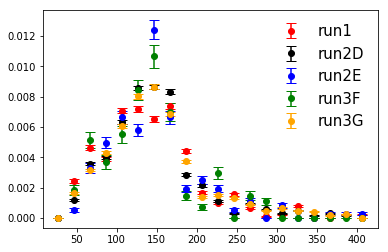

In [18]:
# Make data plots, normalized
# checking to see if any bins look realyl off
var_r1 = df_data_r1_pi0filter_pi0["_pi0mass_new"].values
var_r2D = df_data_r2D_pi0filter_pi0["_pi0mass_new"].values
var_r2E = df_data_r2E_pi0filter_pi0["_pi0mass_new"].values
var_r3F = df_data_r3F_pi0filter_pi0["_pi0mass_new"].values
var_r3G = df_data_r3G_pi0filter_pi0["_pi0mass_new"].values

# turn into histograms
r1_Hist,binedges = np.histogram( var_r1, bins = 20, range = [0,400],density = True)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(400.0/15.0)
    
r2D_Hist,_ = np.histogram( var_r2D, bins = 20, range = [0,400],density = True)
r2E_Hist,_ = np.histogram( var_r2E, bins = 20, range = [0,400],density = True)
r3F_Hist,_ = np.histogram( var_r3F, bins = 20, range = [0,400],density = True)
r3G_Hist,_ = np.histogram( var_r3G, bins = 20, range = [0,400],density = True)

err_1 = [sqrt(float(i))/float(len(var_r1)) for i in r1_Hist]
err_2d = [sqrt(float(i))/float(len(var_r2D)) for i in r2D_Hist]
err_2e = [sqrt(float(i))/float(len(var_r2E)) for i in r2E_Hist]
err_3f = [sqrt(float(i))/float(len(var_r3F)) for i in r3F_Hist]
err_3g = [sqrt(float(i))/float(len(var_r3G)) for i in r3G_Hist]


plt.errorbar(bincenters,r1_Hist, yerr=err_1,  fmt='o', color = 'red', ecolor='red', capsize=5,label = 'run1')
plt.errorbar(bincenters,r2D_Hist, yerr=err_2d,  fmt='o', color = 'black', ecolor='black', capsize=5,label = 'run2D')
plt.errorbar(bincenters,r2E_Hist, yerr=err_2e,  fmt='o', color = 'blue', ecolor='blue', capsize=5,label = 'run2E')
plt.errorbar(bincenters,r3F_Hist, yerr=err_3f,  fmt='o', color = 'green', ecolor='green', capsize=5,label = 'run3F')
plt.errorbar(bincenters,r3G_Hist, yerr=err_3g,  fmt='o', color = 'orange', ecolor='orange', capsize=5,label = 'run3G')

plt.legend(loc='upper right',fontsize=15,frameon=False,ncol=1)
plt.show()
plt.close()

# Make "DPF plots"

In [19]:
# # list of variables to plot:
# vars = ['Xreco','Yreco','Zreco','OpenAng','Thetas','Phis','ChargeNearTrunk','Enu_1e1p','PhiT_1e1p','AlphaT_1e1p','PT_1e1p','PTRat_1e1p','BjXB_1e1p','BjYB_1e1p','Q2_1e1p','SphB_1e1p','Q0_1e1p','Q3_1e1p','Lepton_PhiReco','Lepton_ThetaReco','Lepton_TrackLength','Muon_Edep','Proton_PhiReco','Proton_ThetaReco','Proton_TrackLength','Proton_Edep','Proton_CosTheta','Lepton_CosTheta']
# # list of ranges
# ranges = [(15,241.25),(-101.5,101.),(15,1021.8),(.6,2.8),(0,6.3),(1.5,4),(0,600),(200,1200),(0,1),(0,np.pi),(0,320),(0,1),(0,1.8),(0.05,.75),(0,6e5),(0,1200),(70,600),(200,1000),(-np.pi,np.pi),(.2,2.8),(20,200),(50,600),(-np.pi,np.pi),(0,2),(5,100),(50,500),(-1,1),(-1,1),]
# print(vars)
# print(ranges)
# nbins =20

# for i in range(len(vars)):
#     vartest = vars[i]
#     varname = vars[i]
#     myrange = ranges[i]
#     norm = len(df_data_r1_pi0filter_pi0)/(len(df_numu_pi0)*NUMU_R1_PI0FILTER_SCALE+ len(df_nue_pi0)*NUE_R1_PI0FILTER_SCALE +len(df_ext_pi0)*EXT_R1_PI0FILTER_SCALE)
#     print("Norm", norm)
#     run1Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_pi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUE_R1_PI0FILTER_SCALE*norm))
#     run1Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#     run1Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#     run1Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#     run1Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#     run1Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#     run1Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#     run1Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#     run1DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [Run 1]')
#     cov = np.zeros((nbins,nbins))
#     fig,ax0,_ ,a= distplot_wratio_davio(vartest,nbins,myrange,run1Hists,run1DataHist,varname,m_cov=cov)

# Start of combined plots...

In [20]:
# add all of the data frames
# df_data_total = df_fakedata1_run1_pi0.append(df_fakedata1_run3_pi0)
df_data_total_1 = df_data_r1_pi0filter_pi0.append(df_data_r2D_pi0filter_pi0)
df_data_total_2 = df_data_total_1.append(df_data_r2E_pi0filter_pi0)
df_data_total_3 = df_data_total_2.append(df_data_r3F_pi0filter_pi0)
df_data_total = df_data_total_3.append(df_data_r3G_pi0filter_pi0)

print("total number of data pi0: ",len(df_data_total['_pi0mass'].values))
# scale CV weights:
def potscale(df,scalefactor=1.0,ext=False):
    pot_weight = []
    for i in range(len(df)):
        if ext==False:
            pot_weight.append(scalefactor)
        else:
            pot_weight.append(scalefactor)
    return pot_weight

# general mc
w_mu_1 =potscale(df_numu_pi0,DATA_R1_PI0FILTER_POT/NUMU_R1_POT)
w_mu_1_1mil =potscale(df_numu_1mil_pi0,DATA_R1_PI0FILTER_POT/NUMU_R1_1MIL_POT)
w_mu_2 =potscale(df_numu_r2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_POT)
w_mu_2_1mil =potscale(df_numu_r2_1mil_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_1MIL_POT)
w_mu_3 =potscale(df_numu_r3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/NUMU_R3_POT)
df_numu_pi0['pot_weight'] = w_mu_1
df_numu_1mil_pi0['pot_weight'] = w_mu_1_1mil
df_numu_r2_pi0['pot_weight'] = w_mu_2
df_numu_r2_1mil_pi0['pot_weight'] = w_mu_2_1mil
df_numu_r3_pi0['pot_weight'] = w_mu_3

# df_numu_total_1 = df_numu_pi0.append(df_numu_r2_pi0)
df_numu_total_1 = df_numu_1mil_pi0.append(df_numu_r2_1mil_pi0)
df_numu_total = df_numu_total_1.append(df_numu_r3_pi0)

w_e_1 =potscale(df_nue_pi0,DATA_R1_PI0FILTER_POT/NUE_R1_POT)
w_e_2 =potscale(df_nue_r2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUE_R2_POT)
w_e_3 =potscale(df_nue_r3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/NUE_R3_POT)
df_nue_pi0['pot_weight'] = w_e_1
df_nue_r2_pi0['pot_weight'] = w_e_2
df_nue_r3_pi0['pot_weight'] = w_e_3
df_nue_total_1 = df_nue_pi0.append(df_nue_r2_pi0)
df_nue_total = df_nue_total_1.append(df_nue_r3_pi0)
print('xsec_corr_weight' in df_nue_total.keys())


df_ext_r3_2_pi0 = df_ext_r3_pi0
df_ext_r3_3_pi0 = df_ext_r3_pi0
w_ext_1 =potscale(df_ext_pi0,DATA_R1_PI0FILTER_POT/EXT_R1_PI0FILTER_POT,True)
w_ext_2 =potscale(df_ext_r3_2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(EXT_R2D_PI0FILTER_POT+EXT_R2E_PI0FILTER_POT),True)
w_ext_3 =potscale(df_ext_r3_3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/(EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT),True)
df_ext_pi0['pot_weight'] = w_ext_1
df_ext_r3_2_pi0['pot_weight'] = w_ext_2
df_ext_r3_2_pi0['pot_weight'] = w_ext_3
df_ext_total_1 = df_ext_pi0.append(df_ext_r3_2_pi0)
df_ext_total = df_ext_total_1.append(df_ext_r3_3_pi0)

# df_bnb_ncpi0_r2 = df_numu_r2_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 and MC_parentPDG ==14')
# df_bnb_ccpi0_r2 = df_numu_r2_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5 and MC_parentPDG ==14")

# df_bnb_offvtx_pi0_r2 = df_numu_r2_pi0.query("haspi0==1 and  MC_scedr>=5 and MC_parentPDG ==14")
# w_off_2 =potscale(df_bnb_offvtx_pi0_r2,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_POT)
# df_bnb_offvtx_pi0_r2['pot_weight'] = w_off_2

w_cc_1 =potscale(df_ccpi0_r1_pi0,DATA_R1_PI0FILTER_POT/CCPI0_R1_POT)
w_cc_3 =potscale(df_ccpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(CCPI0_R3_POT))
w_cc_2 =potscale(df_ccpi0_r3_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(CCPI0_R3_POT))
df_ccpi0_r1_pi0['pot_weight'] = w_cc_1
df_ccpi0_r3_pi0['pot_weight'] = w_cc_3
df_ccpi0_r2_pi0 = df_ccpi0_r3_pi0
df_ccpi0_r2_pi0['pot_weight'] = w_cc_2
df_ccpi0_total1 = df_ccpi0_r1_pi0.append(df_ccpi0_r2_pi0)
df_ccpi0_total = df_ccpi0_total1.append(df_ccpi0_r3_pi0)

w_nc_1 =potscale(df_ncpi0_r1_pi0,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT)
w_nc_3 =potscale(df_ncpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
w_nc_2 =potscale(df_ncpi0_r3_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
df_ncpi0_r1_pi0['pot_weight'] = w_nc_1
df_ncpi0_r3_pi0['pot_weight'] = w_nc_3
df_ncpi0_r2_pi0 = df_ncpi0_r3_pi0
df_ncpi0_r2_pi0['pot_weight'] = w_nc_2
df_ncpi0_total1 = df_ncpi0_r1_pi0.append(df_ncpi0_r2_pi0)
df_ncpi0_total = df_ncpi0_total1.append(df_ncpi0_r3_pi0)

n=float(len(df_numu_total.query('newhaspi0==1') ))
print(sqrt(n)/n)
a = float(len(df_ncpi0_total)+len(df_ccpi0_total))
print(sqrt(a))
print(abs((234+1028+462)-(242+1039+472))/(234+1028+462))
                 
# tot1 = 0
# for i in range(len(df_numu_total)):
#     tot1+=df_numu_total['pot_weight'].values[i]*df_numu_total['xsec_corr_weight'].values[i]
# tot2 = 0
# for i in range(len(df_nue_total)):
#     tot2+=df_nue_total['pot_weight'].values[i]*df_nue_total['xsec_corr_weight'].values[i]
# print(tot1+tot2)
# tot3 = 0
# for i in range(len(df_ext_total)):
#     tot3+=df_ext_total['pot_weight'].values[i]
# print(tot3)


# # #specific categories
# df_bnb_ncpi0_total = df_numu_total.query('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ')
# tot4 = 0
# for i in range(len(df_bnb_ncpi0_total)):
#     tot4+=df_bnb_ncpi0_total['pot_weight'].values[i]*df_bnb_ncpi0_total['xsec_corr_weight'].values[i]
# print(tot4)
                 
# df_bnb_ccpi0_total = df_ccpi0_total.query(" MC_scedr<5 ") 
# df_bnb_ncpi0_total = df_ncpi0_total.query(" MC_scedr<5 ") 
# df_bnb_ccpi0_offvtx_total = df_ccpi0_total.query("MC_scedr>=5 ") 
# df_bnb_ncpi0_offvtx_total = df_ncpi0_total.query("MC_scedr>=5 ") 
# df_bnb_other_offvtx_total = df_numu_total.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good_total = df_numu_total.query("haspi0==0 and MC_scedr<5")



# print(df_numu_pi0['xsec_corr_weight'].values)

total number of data pi0:  2016


/home/kmason/.local/lib/python3.5/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


True
0.011177545850247397
65.39877674696982
0.016821345707656612


In [21]:
NUMU_POT_TOTAL = NUMU_R1_1MIL_POT+NUMU_R2_1MIL_POT+NUMU_R3_POT
NUE_POT_TOTAL = NUE_R1_POT+NUE_R2_POT+NUE_R3_POT
EXT_POT_TOTAL = EXT_R1_PI0FILTER_POT+EXT_R2D_PI0FILTER_POT+EXT_R2E_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT
CCPI0_POT_TOTAL = CCPI0_R1_POT+CCPI0_R3_POT
NCPI0_POT_TOTAL = NCPI0_R1_POT+NCPI0_R3a_POT+NCPI0_R3b_POT

# DATA_POT_TOTAL = FAKE_DATA_1_RUN1_POT + FAKE_DATA_1_RUN3_POT
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+ DATA_R2D_PI0FILTER_POT+ DATA_R2E_PI0FILTER_POT+ DATA_R3F_PI0FILTER_POT+ DATA_R3G_PI0FILTER_POT
DATA_R2_POT_TOTAL = DATA_R2D_PI0FILTER_POT+ DATA_R2E_PI0FILTER_POT
print("pot total:",DATA_POT_TOTAL)
POT_SCALE_FACTOR = DATA_POT_TOTAL
NUMU_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUMU_POT_TOTAL)
NUE_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUE_POT_TOTAL)
CCPI0_SCALE_TOTAL =POT_SCALE_FACTOR / float(CCPI0_POT_TOTAL)
NCPI0_SCALE_TOTAL = POT_SCALE_FACTOR / float(NCPI0_POT_TOTAL)
EXT_SCALE_TOTAL = POT_SCALE_FACTOR / float(EXT_POT_TOTAL)
DATA_SCALE_TOTAL = POT_SCALE_FACTOR / float(DATA_POT_TOTAL)
print(CCPI0_SCALE_TOTAL)

# make some lists of bin values:
numu_test=df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14')
var_numu=numu_test['_pi0mass_new'].values
weights_numu =[numu_test['pot_weight'].values[i]*numu_test['xsec_corr_weight'].values[i] for i in range(len(var_numu))]
numu_Hist,_ = np.histogram( var_numu, bins = 20, range = [30,300],weights=weights_numu)

nue_test=df_nue_total.query('MC_parentPDG ==12')
var_nue=nue_test['_pi0mass_new'].values
weights_nue =[nue_test['pot_weight'].values[i]*nue_test['xsec_corr_weight'].values[i] for i in range(len(var_nue))]
nue_Hist,_ = np.histogram( var_nue, bins = 20, range = [30,300],weights=weights_nue)

ccpi0_test=df_ccpi0_total
var_ccpi0=ccpi0_test['_pi0mass_new'].values
weights_ccpi0 =[ccpi0_test['pot_weight'].values[i]*ccpi0_test['xsec_corr_weight'].values[i] for i in range(len(var_ccpi0))]
ccpi0_Hist,_ = np.histogram( var_ccpi0, bins = 20, range = [30,300],weights=weights_ccpi0)

ncpi0_test=df_ncpi0_total
var_ncpi0=ncpi0_test['_pi0mass_new'].values
weights_ncpi0 =[ncpi0_test['pot_weight'].values[i]*ncpi0_test['xsec_corr_weight'].values[i] for i in range(len(var_ncpi0))]
ncpi0_Hist,_ = np.histogram( var_ncpi0, bins = 20, range = [30,300],weights=weights_ncpi0)

ext_test=df_ext_total
var_ext=ext_test['_pi0mass_new'].values
weights_ext =[ext_test['pot_weight'].values[i] for i in range(len(var_ext))]
ext_Hist,_ = np.histogram( var_ext, bins = 20, range = [30,300],weights=weights_ext)

data_test=df_data_total
var_data=data_test['_pi0mass_new'].values
data_Hist,_ = np.histogram( var_data, bins = 20, range = [30,300])

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

errdatalow=[]
errdatahigh=[]

for i in range(20):
    elow,ehigh=GetErrorsData(data_Hist[i])
    errdatalow.append(data_Hist[i] -elow)
    errdatahigh.append(ehigh-data_Hist[i])

numu = []
ext = []
total = []

for i in range(20):
    numu.append(numu_Hist[i]+nue_Hist[i]+ccpi0_Hist[i]+ncpi0_Hist[i])
    ext.append(ext_Hist[i])
    total.append(numu_Hist[i]+nue_Hist[i]+ccpi0_Hist[i]+ncpi0_Hist[i]+ext_Hist[i])
    
print(numu,sum(numu))
print(ext,sum(ext))
print(total,sum(total))
print(data_Hist,sum(data_Hist))
print(errdatalow)
print(errdatahigh)

pot total: 6.8767e+20
0.5340889762550319
[42.12349865160012, 60.350474842879265, 86.12309767307127, 122.49989661908275, 153.51731161184196, 209.09232639859798, 214.62372255208248, 227.67661077615546, 226.7429849899563, 157.61881561067477, 80.74224358896785, 49.36764488801843, 42.78770950300521, 28.57260808825346, 20.23949649536944, 17.97084387241771, 9.438492102416463, 11.164861362319764, 10.058013634415527, 16.878007284946722] 1787.5886605460728
[13.840030449156185, 17.568513285000126, 13.57155522560129, 24.741918586170843, 18.62732903225742, 28.470401422014792, 15.972747090633046, 13.034604778491506, 9.574597166202462, 12.512739478344, 7.978830971835386, 3.4600076122890466, 5.324249030211016, 5.0557738066561235, 7.188490448132985, 1.5957661943670773, 6.6515400010232, 1.5957661943670773, 1.5957661943670773, 1.5957661943670773] 209.95639316148777
[55.963529100756304, 77.91898812787939, 99.69465289867256, 147.2418152052536, 172.14464064409938, 237.56272782061276, 230.59646964271553, 240

In [22]:
# plot all of the seperate pi0  distributions
vartest_list = []
varname_list = []
myrange_list = []
detvar1_list  = []
detvar3_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass_new')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((30.0,350.0))
sys_list.append('../systematics/covar_cv_weighted__pi0_mass_reco.txt')
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run3_cov.csv')
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('Delta mass (MeV)')
myrange_list.append((1000,1400))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__Delta_mass_reco.txt')
bins_list.append(20)

vartest_list.append('pi0_energy_reco_new')
varname_list.append('Pi0 Energy (MeV)')
myrange_list.append((100.0,750.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__pi0_energy_reco.txt')
bins_list.append(20)

vartest_list.append('pi0_momentum_reco_new')
varname_list.append('Pi0 Momentum (MeV)')
myrange_list.append((100.0,700.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__pi0_momentum_reco.txt')
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((80.0,450.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__shower1_energy_reco.txt')
bins_list.append(20)

vartest_list.append('shower2_E_Y_new')
varname_list.append('shower2 energy (MeV)')
myrange_list.append((35.0,300.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__shower2_energy_reco.txt')
bins_list.append(20)


vartest_list.append('MPID_muon')
varname_list.append('MPID muon score')
myrange_list.append((0,1))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__mpid_muon_score.txt')
bins_list.append(20)

vartest_list.append('Enu_1e1p')
varname_list.append('Reco Neutrino Energy (MeV)')
myrange_list.append((0,1200))
detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')
bins_list.append(20)


vartest_list.append('Proton_Edep')
varname_list.append('Reco Proton Energy (MeV)')
myrange_list.append((0,450))
detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')
bins_list.append(20)

# 

782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



SUM 49.6870477922737
SUM 243.20883273021485
SUM 106.86938092810323
SUM 35.24839298037381
SUM 45.293265226425234
SUM 6.6361117047297595
SUM 83.89086380648862
Normalization Uncertainty: 0.0
yerr_mc_total [5.45043348 6.30662773 6.74379051 8.40767818 8.88117952 9.33134428
 8.45734184 7.91838467 7.48315623 4.5909568  5.4385621  3.02162881
 4.32653779 2.29823753 2.52751621 1.88890727 1.99840977 1.12800456
 1.423178   0.69225358]
yerr_data 87.00490359257526
ERROR HERE
[ 0.18802946  0.15691868  0.11637705  0.09683561  0.08744727  0.08000534
  0.08554849  0.0987703   0.11061574  0.17363045  0.08422959  0.24869399
  0.12771878  0.22051318  0.289914    0.08314127  0.15968528  1.3937776
 -0.0857621  -0.36247948]
[0.27996803 0.21967347 0.16737119 0.12945229 0.11555129 0.10571766
 0.11401619 0.13051335 0.15213273 0.26808029 0.17032644 0.46680442
 0.27117266 0.59785682 0.7070152  0.64381718 0.65928581 2.95927028
 0.92228432 3.89809883]
chi2 in bins
0.21410464078461533
0.148562326759217
1.008187351598

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 102.02928637137833
SUM 422.1481036971761
SUM 205.00980132067048
SUM 71.85593467705685
SUM 75.53236393492294
SUM 22.027863452909227
SUM 74.55881153578623
Normalization Uncertainty: 0.0
yerr_mc_total [ 5.71158208  6.75424108  8.67765221  9.8113103  10.80905178 11.69138766
 11.37492593 10.88387143  8.49816069  5.78893918  4.58490117  4.31895165
  4.02156743  3.4755698   3.52098726  2.8400524   3.02938466  2.14333611
  1.81129697  2.2097808 ]
yerr_data 116.9783686193736
ERROR HERE
[0.12928314 0.12369722 0.08935436 0.08240319 0.07140814 0.073881
 0.07760253 0.07351009 0.08540682 0.13732732 0.17852069 0.14370238
 0.0716923  0.19562335 0.14220983 0.23940152 0.14972078 0.20012809
 0.34726587 0.23499808]
[0.18962485 0.1669793  0.11553057 0.10293765 0.08828371 0.08840186
 0.092923   0.0902

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 10.27400433776666
SUM 390.2233740039454
SUM 126.63047748368473
SUM 52.44324274611965
SUM 59.67920153820309
SUM 8.620846558237169
SUM 64.62853087186663
Normalization Uncertainty: 0.0
yerr_mc_total [ 4.5136317   5.86195536  7.33968611  7.8644047   9.57423759  9.75904621
 10.30835168  9.34003171  7.28555425  4.91271275  4.32951033  3.46728637
  2.65742278  2.93000718  2.10298506  2.09163304  2.58763078  1.86712933
  1.64542837  1.80667218]
yerr_data 104.28827691051553
ERROR HERE
[0.22697936 0.16385848 0.11410182 0.11327024 0.08894259 0.09666872
 0.08735749 0.09504685 0.10306241 0.16536766 0.15671671 0.31347319
 0.3549315  0.26222363 0.49535976 0.39095208 0.23136829 0.39727599
 0.40601233 0.18617936]
[0.32096153 0.22045268 0.14997373 0.14471168 0.11009578 0.11738987
 0.10588946 0.11765181 0.1

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 50.18876756595384
SUM 245.1376402437174
SUM 107.7140619886593
SUM 35.81193372199542
SUM 46.69150071949072
SUM 6.84393950131495
SUM 85.7551052244106
Normalization Uncertainty: 0.0
yerr_mc_total [2.12117397 3.00708034 4.268401   5.77178321 6.9054754  6.5249655
 6.13362275 7.68943293 7.41037422 6.11474624 5.84201592 6.92432064
 5.27196098 6.5959846  5.74146054 5.27003078 5.35772812 4.82619586
 4.87963029 4.23632259]
yerr_data 98.50429067168706
ERROR HERE
[0.10270865 0.30554711 0.2293488  0.11939341 0.13091234 0.11771046
 0.13229496 0.09011672 0.10268645 0.11905891 0.15813653 0.11161604
 0.10198226 0.10915565 0.10532453 0.17371297 0.12411615 0.09708647
 0.15581358 0.20356566]
[0.79534016 0.57351906 0.36209436 0.19348886 0.1832667  0.16829115
 0.18520226 0.12677745 0.14375273 0.1722956

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 103.0686567531517
SUM 423.8817076628923
SUM 207.31987882779225
SUM 72.47841588421447
SUM 79.08875069719217
SUM 22.33856173110795
SUM 74.55881153578626
Normalization Uncertainty: 0.0
yerr_mc_total [1.19900066 2.86497713 4.44474667 6.24852737 7.58948121 8.29352116
 8.71109205 8.76420072 9.18342694 8.37862143 8.75668109 8.01349361
 7.54470368 6.90466714 7.05707191 6.49926209 6.61573532 5.85160381
 5.45555616 5.42577586]
yerr_data 129.6442808401383
ERROR HERE
[0.60852954 0.32622535 0.18253622 0.12484635 0.11815884 0.1019057
 0.08918745 0.09281551 0.0784785  0.0999605  0.08112527 0.09414441
 0.09105762 0.10922488 0.11939629 0.12653698 0.099097   0.12297454
 0.13245741 0.12308655]
[1.92828239 0.5666592  0.28183054 0.17563558 0.15245052 0.13068807
 0.11531477 0.11857914 0.10191537 0.128

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 10.814741408175433
SUM 392.35184421340927
SUM 130.49462534013207
SUM 52.751373409908005
SUM 62.253813562902096
SUM 8.907728497042864
SUM 64.62853087186664
Normalization Uncertainty: 0.0
yerr_mc_total [1.35254627 2.62792894 4.09841674 5.15525718 6.22281504 7.46212738
 7.02393191 8.18572129 7.41734587 7.3255368  6.92380574 6.99017874
 6.15842497 6.09306918 6.4406191  5.5028443  5.19536048 5.21106554
 4.56216861 4.36182476]
yerr_data 116.02633782652495
ERROR HERE
[0.46184297 0.32128869 0.20981376 0.16887755 0.16459059 0.11085582
 0.12802398 0.11417728 0.11483532 0.11657068 0.13845974 0.13052268
 0.13010455 0.13731787 0.11614479 0.14688675 0.16859503 0.15164965
 0.15613809 0.1569481 ]
[1.46346823 0.60306638 0.32394625 0.24287639 0.21473518 0.14608898
 0.16784535 0.14345661 0.15018242 0.153218

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 49.637288879591715
SUM 241.8531046714481
SUM 107.08990485204535
SUM 35.81193372199541
SUM 46.26206341740881
SUM 6.463403621165671
SUM 83.89086380648862
Normalization Uncertainty: 0.0
yerr_mc_total [4.43575964 9.06375534 9.49703787 9.33798989 8.41407328 8.40496071
 7.30224136 6.75187242 4.93678047 5.14233753 3.86488516 4.35913083
 3.49338595 3.02393308 2.18929577 2.43708385 1.79327363 1.01691707
 1.09959612 1.2831377 ]
yerr_data 86.41565144319918
ERROR HERE
[0.19962098 0.09357969 0.10055321 0.10514561 0.09294447 0.07752663
 0.07304507 0.11372681 0.11630044 0.11633992 0.23771918 0.11238701
 0.18395044 0.15461637 0.06189122 0.45018745 0.19830828 0.88903226
 0.24534179 0.1801737 ]
[0.33376056 0.12299976 0.12526806 0.13081537 0.12387331 0.10853101
 0.11277944 0.16457928 0.19799442 0.20

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 102.44503452408767
SUM 420.21903975670773
SUM 205.46297340754668
SUM 72.0671079141017
SUM 78.54163599364519
SUM 21.48589357114936
SUM 76.39976984531184
Normalization Uncertainty: 0.0
yerr_mc_total [ 4.66187439 10.12458468 11.69526371 12.07635801 10.69962057 10.04670386
  8.35751469  7.85945174  7.31792124  6.27768091  5.89630539  4.51266177
  4.31373999  3.79203612  3.34020553  2.78107766  2.44647411  2.17639664
  1.79186652  1.65748064]
yerr_data 116.22804104458682
ERROR HERE
[0.19492305 0.08933373 0.07497499 0.06361307 0.07075588 0.08450788
 0.09947017 0.09425961 0.10311231 0.09234654 0.09504659 0.1991999
 0.15172463 0.16831733 0.10304254 0.08092158 0.29630156 0.29239169
 0.09239035 0.41295965]
[0.28590158 0.10858371 0.08939386 0.07717776 0.08802989 0.10411144
 0.1278158  0.126

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 10.003635802562275
SUM 389.4997737926819
SUM 128.990193058045
SUM 52.043127639721476
SUM 61.71428001953382
SUM 8.259295523351227
SUM 66.2242970662337
Normalization Uncertainty: 0.0
yerr_mc_total [ 3.96003522  8.4649784  10.06019089  9.39538228  9.53136521  9.08979342
  7.40232645  6.54778309  6.02869879  5.7728496   4.77955197  3.96374928
  3.38306344  2.78270527  2.77807806  2.79479454  1.88422511  2.00992981
  1.87336169  1.16138027]
yerr_data 103.18009524472058
ERROR HERE
[ 0.20044258  0.1151549   0.09522549  0.10129433  0.09502602  0.09779673
  0.13222361  0.12818231  0.13800303  0.1520954   0.13234187  0.18666628
  0.18211962  0.11872828  0.14486214  0.14320291  0.49951624  0.15786003
  0.18171497 -0.11503151]
[0.32483706 0.14219886 0.11437098 0.12335628 0.11655092 0.12151377
 0.1680

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 47.23233848341542
SUM 226.47246403817738
SUM 97.6683435508508
SUM 32.802616267179246
SUM 43.4336848626895
SUM 6.350809704500298
SUM 72.70541529895681
Normalization Uncertainty: 0.0
yerr_mc_total [8.1076217  9.25217234 8.45072849 8.20010263 8.43723512 6.6994223
 6.17788118 5.6299909  5.41379013 3.95973018 4.14381049 2.96850459
 4.00403826 2.99731795 1.96082349 2.75943359 1.46463263 1.31009824
 0.90599154 1.202555  ]
yerr_data 83.71117054408292
ERROR HERE
[0.11440982 0.09006421 0.11791054 0.11068742 0.07732153 0.09039395
 0.11924569 0.11678176 0.08636132 0.17229972 0.13584504 0.20125178
 0.15210848 0.12469771 0.23911763 0.15314301 0.4285793  0.37155768
 1.41897942 0.20512946]
[0.1489168  0.11572946 0.14932256 0.14342381 0.11054692 0.13817794
 0.17369897 0.18669756 0.16772945 0.29928

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 97.20198625949382
SUM 395.2738184787752
SUM 192.98061430380065
SUM 62.576848970910284
SUM 72.41699988470782
SUM 21.053424979552233
SUM 69.95641576197228
Normalization Uncertainty: 0.0
yerr_mc_total [10.36023509 11.057055   11.27236095 10.17400968  9.26248236  8.31655445
  7.36487775  7.28181184  6.23203207  5.66436891  5.32785822  4.42094168
  3.97339294  3.95986388  3.12770057  2.52682093  2.24734013  2.29732807
  2.07988867  1.53581344]
yerr_data 112.78810401949336
ERROR HERE
[0.0798179  0.07570458 0.07390472 0.06941633 0.08561791 0.1047581
 0.10687757 0.09823411 0.11440412 0.1064716  0.1121444  0.15102895
 0.18680192 0.14413333 0.11906224 0.17833236 0.18203336 0.30060638
 0.26924287 0.12576535]
[0.09822177 0.09184764 0.0894241  0.08852224 0.10879615 0.13335182
 0.14332584 0.13

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 9.733267267357888
SUM 369.2892128764915
SUM 121.73993920153208
SUM 45.93141021749227
SUM 57.25742492164076
SUM 7.776782957611951
SUM 60.63911538594893
Normalization Uncertainty: 0.0
yerr_mc_total [8.85855748 9.20223484 9.23212783 8.54594814 8.18782849 7.59819249
 6.48184729 6.15514015 5.5473387  4.82085359 4.52017281 3.88843763
 2.8978074  2.99558007 2.81937874 2.335192   1.98321095 1.81630308
 1.78009854 1.81054645]
yerr_data 99.8366406006652
ERROR HERE
[0.09742261 0.10955953 0.1034948  0.10722436 0.12766614 0.11353409
 0.14134473 0.10910905 0.14390617 0.1401636  0.1644468  0.13832346
 0.29955151 0.03247435 0.19958937 0.20166164 0.29613283 0.35305937
 0.09361595 0.09049375]
[0.12222348 0.13245105 0.12615873 0.13394413 0.15728127 0.14744
 0.18782523 0.16120721 0.20825322 0.22407782 0.2596

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 48.55506120131239
SUM 237.5540481548957
SUM 105.40686755451978
SUM 35.2657255852083
SUM 45.73961394928393
SUM 5.98148313958237
SUM 80.16238097064469
Normalization Uncertainty: 0.0
yerr_mc_total [9.42839241 9.6010875  7.55005232 8.27867652 7.70135827 6.69249659
 6.72275023 5.68139956 4.4002215  4.13798057 5.09099549 4.23853831
 3.21222066 3.27326774 3.0594336  3.01176913 2.24634455 2.05323832
 2.05293868 2.53914867]
yerr_data 89.53804827570653
ERROR HERE
[0.09801317 0.08990935 0.13445362 0.09770247 0.09209634 0.11719435
 0.09163413 0.11837592 0.13952971 0.14135034 0.11903313 0.16519252
 0.18883925 0.23220046 0.14796502 0.23773862 0.05878753 0.27627759
 0.07038595 0.1318672 ]
[0.12476585 0.11553047 0.17146015 0.13061112 0.13093109 0.16329226
 0.14300711 0.18689111 0.24236557 0.25764

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 100.57416783689555
SUM 409.5791619231064
SUM 202.88644728098814
SUM 70.48901558392272
SUM 76.25367354792293
SUM 19.6027356540545
SUM 74.55881153578625
Normalization Uncertainty: 0.0
yerr_mc_total [10.66296045 10.65985287 10.61492414  9.95896016  9.59641199  8.3435745
  7.88092353  7.6774795   6.33895655  5.71385277  5.35885366  5.178131
  4.13323692  4.30669609  3.8071765   3.61609425  3.45193827  2.98757518
  2.8454854   2.35928393]
yerr_data 117.50916181273836
ERROR HERE
[0.08666925 0.0769754  0.07606048 0.08546987 0.08716417 0.08435035
 0.10035311 0.09567249 0.12132257 0.12137132 0.14480012 0.09993726
 0.18071432 0.15974408 0.19456974 0.14736298 0.05319224 0.03323535
 0.07876282 0.1145707 ]
[0.10409447 0.09431093 0.09359799 0.10541838 0.10858814 0.11276167
 0.1322482  0.129148

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 9.73326726735789
SUM 380.03986267939206
SUM 125.88552608368457
SUM 50.79064740285246
SUM 59.650481836232835
SUM 7.389729927267698
SUM 64.62853087186663
Normalization Uncertainty: 0.0
yerr_mc_total [8.57748643 9.33053323 9.36955076 8.25665805 7.56220498 7.39596823
 6.72776863 6.47831587 5.59468101 5.57632562 4.69176159 4.73997791
 3.25507963 3.38175354 3.23768897 2.84922288 2.55404196 2.6517203
 1.90351236 2.15807578]
yerr_data 106.59137390602095
ERROR HERE
[0.11692852 0.10572774 0.08665516 0.11417262 0.12570078 0.11735244
 0.13640799 0.15003326 0.14077187 0.13337534 0.15511619 0.12349911
 0.26751353 0.22417541 0.21332753 0.13799106 0.20719485 0.13074743
 0.32144967 0.25008694]
[0.14357013 0.1279297  0.10887678 0.14282425 0.15945602 0.15310533
 0.17976237 0.19621453 0.20371742 0.19706034 0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 49.21642256026087
SUM 237.3333274101213
SUM 102.55439593126104
SUM 32.80261345110327
SUM 43.28089233161854
SUM 6.539585984626175
SUM 80.16238097064469
Normalization Uncertainty: 0.0
yerr_mc_total [10.04512583 11.02316965  8.40921679  8.56587908  7.35227546  6.46819224
  5.47854895  6.04491533  5.02013395  4.06159076  3.35289672  3.42691744
  2.45348985  2.49792219  1.97804496  2.53001854  1.28467383  0.95291649
  1.08789662  1.10339764]
yerr_data 83.07195794834465
ERROR HERE
[ 0.09137121  0.07487237  0.10440585  0.09796191  0.10611457  0.09195579
  0.11830587  0.12857702  0.1166421   0.14200191  0.18802401  0.17502252
  0.15272849  0.25164471  0.35397192  0.13314137  0.17974308  1.28266931
  0.25064709 -0.14267562]
[0.1139833  0.09466282 0.13389437 0.12843258 0.14655159 0.14350911

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 97.4626421601352
SUM 402.14726267549634
SUM 201.45019481230705
SUM 68.23781725229942
SUM 74.17816489503723
SUM 21.408446473786288
SUM 66.27449914292112
Normalization Uncertainty: 0.0
yerr_mc_total [12.27231997 12.50332029 11.32097754 10.05065574  9.38243393  8.3279734
  6.98638314  6.64145591  5.4683284   5.41445235  4.27490638  3.83599647
  3.73336948  2.84035278  2.5046624   2.16531903  1.90882695  2.50274636
  1.62960558  1.31258973]
yerr_data 110.9995302701219
ERROR HERE
[0.06691157 0.06554327 0.07311394 0.08816432 0.08173515 0.09000694
 0.10653304 0.11055819 0.12877972 0.12052164 0.1805147  0.15430895
 0.20229831 0.21784522 0.36195044 0.24459799 0.25232221 0.14508057
 0.10870872 0.53361816]
[0.0800046  0.07820231 0.0885452  0.10779488 0.10423164 0.11861373
 0.14712953 0.1555

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 10.544372872971046
SUM 379.58573528711946
SUM 124.80520753367348
SUM 49.29092339014108
SUM 55.17640517321885
SUM 8.385260551659671
SUM 57.44758299721477
Normalization Uncertainty: 0.0
yerr_mc_total [10.69400853 10.1205093   9.41851658  8.01134303  7.88813298  7.44387302
  6.79238756  5.67980948  5.10799183  4.40077676  3.96635319  3.55874377
  2.96353035  3.03891408  1.67984093  1.89893154  1.88562243  1.79471885
  1.23763183  1.1438709 ]
yerr_data 98.64669167177692
ERROR HERE
[ 0.08030158  0.09396713  0.10098761  0.13281661  0.11539141  0.10700705
  0.11030131  0.13378341  0.17197899  0.16292881  0.17655194  0.19110864
  0.30206108  0.18873826  0.41275094  0.30917541  0.17935955  0.27181841
 -0.10260236 -0.13275774]
[0.09724985 0.11303725 0.12298276 0.16344058 0.14688748 0.14261544
 0.15

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 50.18876756595382
SUM 245.13764024371747
SUM 107.7140619886594
SUM 35.81193372199541
SUM 46.69150071949071
SUM 6.843939501314943
SUM 85.7551052244106
Normalization Uncertainty: 0.0
yerr_mc_total [6.17376089 4.81823979 5.14135866 4.07091719 4.20132227 4.41123868
 4.81245082 4.63932157 4.61202945 4.5466086  4.04143179 5.42405333
 5.03935023 5.43539624 4.85824935 6.58886093 6.8507431  7.91666287
 7.84859099 9.23414232]
yerr_data 98.6073866652376
ERROR HERE
[0.10334548 0.20605301 0.07640407 0.15469894 0.21443513 0.12722166
 0.11231975 0.12875192 0.17495366 0.09304242 0.21058554 0.1497027
 0.14929814 0.15088314 0.1639525  0.10467577 0.13016106 0.09701208
 0.09753855 0.0995722 ]
[0.16316115 0.29818875 0.16222121 0.2748499  0.33854876 0.23879803
 0.20472907 0.22875046 0.27621568 0.197547

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 103.06865675315171
SUM 423.8817076628918
SUM 207.3198788277926
SUM 72.47841588421446
SUM 79.08875069719215
SUM 22.33856173110796
SUM 76.39976984531184
Normalization Uncertainty: 0.0
yerr_mc_total [ 7.67701074  6.55609407  5.86425209  5.85084997  5.10233839  5.62181161
  5.98492     5.1950855   5.57211363  5.46772041  5.67107988  5.74762538
  6.44631974  6.72395893  6.87354597  7.11689276  8.30454061  9.6051716
 10.34607774 10.41362288]
yerr_data 131.52301556272226
ERROR HERE
[0.08240393 0.10963533 0.1389013  0.12126265 0.17351523 0.15445404
 0.13098115 0.12221549 0.14884315 0.12943897 0.14677372 0.13165947
 0.11088654 0.09372305 0.10800479 0.11757799 0.08636039 0.08686998
 0.07901271 0.08015408]
[0.115927   0.15586584 0.19641421 0.179164   0.24954621 0.21728809
 0.18621267 0.1953

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 10.814741408175431
SUM 392.3518442134093
SUM 130.49462534013207
SUM 52.75137340990802
SUM 62.253813562902096
SUM 8.907728497042863
SUM 66.2242970662337
Normalization Uncertainty: 0.0
yerr_mc_total [5.09409333 4.57963053 4.75041101 5.03172846 5.33300916 5.32048885
 5.24696671 5.17170393 5.27697959 4.59262745 4.53666335 5.08648216
 5.42801731 5.02747593 5.63642766 5.83413992 7.06219439 8.45087503
 9.2853252  9.00739784]
yerr_data 116.71730611678575
ERROR HERE
[0.17536666 0.20179595 0.14921907 0.15877458 0.14827159 0.14643608
 0.13442372 0.16348053 0.12678233 0.19301475 0.13771964 0.16381975
 0.11857186 0.20763513 0.16760853 0.18730777 0.12799076 0.09918704
 0.08996594 0.10915328]
[0.24931446 0.29598235 0.23558608 0.23640874 0.21747598 0.21635742
 0.20548269 0.23658017 0.1978605  0.28739092 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 50.06852004614503
SUM 244.7559291399453
SUM 107.23987115026742
SUM 35.5196949484103
SUM 46.52328815147127
SUM 6.594236195672115
SUM 85.7551052244106
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          5.82714775 11.18004802 11.4479434
 10.09649066  8.45988701  7.13328511  5.29914474  5.70751576  5.27234912
  2.73254725  4.10967451  2.5761351   2.95772866  2.27883039  1.02506519
  1.00375151  0.85211936]
yerr_data 77.3808549447467
ERROR HERE
[ 0.          0.          0.          0.12277395  0.08238082  0.07906582
  0.08082387  0.08383801  0.0884677   0.15852845  0.12725445  0.09899057
  0.21247551  0.18834135  0.05903022  0.2506352   0.25666907  0.87495482
  0.29443233 -0.23922854]
[0.         0.         0.         0.18139692 0.1009337  0.09638013
 0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 103.06865675315183
SUM 421.4127655636259
SUM 206.0374403688335
SUM 71.8530326214883
SUM 78.84616605862351
SUM 21.761871588420917
SUM 76.39976984531184
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          8.08820755 13.32086726 13.99664609
 13.08459862 10.6165979   8.94987216  7.44003159  5.80670322  4.94124488
  4.08530318  2.80719989  3.33614209  2.98700371  2.37870398  1.96270265
  1.52136877  0.76135279]
yerr_data 102.30397494483545
ERROR HERE
[ 0.          0.          0.          0.10991925  0.0631037   0.05575084
  0.06135126  0.08638681  0.08986441  0.08944103  0.13385448  0.14003291
  0.16116348  0.32233677  0.18624276  0.10137924  0.19815625  0.29128414
  0.38503294 -0.2996691 ]
[0.         0.         0.         0.14017303 0.07427765 0.065845

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through t

40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 10.544372872971048
SUM 391.7873970499283
SUM 129.74757167144122
SUM 51.933317839229794
SUM 62.055763073257936
SUM 8.491360661410464
SUM 66.2242970662337
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.          6.37508234 11.43107807 11.69339701
 11.1816422   9.17860597  7.72698265  6.18615133  5.48965794  4.44898306
  3.42082299  2.725533    2.95783455  2.01542869  1.98711601  1.93898105
  1.17489676  1.06858059]
yerr_data 91.07398987336116
ERROR HERE
[ 0.          0.          0.          0.17446069  0.07731774  0.08145459
  0.08095218  0.10390805  0.10574206  0.13830722  0.1263777   0.19742654
  0.24975137  0.33778611  0.06907339  0.36184763  0.14387733  0.15622191
  0.41366495 -0.15212455]
[0.         0.         0.         0.22247863 0.09238081 0.09572307
 0.09

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



782
1070
1211
271
339
2206
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 1.86424142 1.86424142 1.86424142]
SUM 49.81766015930494
SUM 242.73701324870052
SUM 103.18832398254092
SUM 34.031221656976975
SUM 45.71809872182447
SUM 6.545924150017162
SUM 70.84117388103485
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         4.44534954 9.4897204  9.63539038 9.03297078
 7.9363975  6.79771043 7.075374   6.42039081 5.05914463 5.00848729
 4.27433757 3.12207036 3.37617354 3.71721711 2.93467049 2.23947489
 2.07072729 2.74692094]
yerr_data 85.42174891826603
ERROR HERE
[0.         0.         0.16827481 0.07959816 0.08009508 0.0988294
 0.10952923 0.13746425 0.11021662 0.09344671 0.13864785 0.1673901
 0.11569539 0.18194068 0.12150429 0.10992774 0.25330669 0.18331424
 0.32299463 0.15492101]
[0.         0.         0.26901887 0.10435686 0.10449706 0.12649962
 0.14473001 0.18376567 0.15585248 0.145

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through t

450
2619
1357
954
1064
2530
hstack gh_weights [0.20787408 0.20787408 0.22748432 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
SUM 102.86078267679706
SUM 415.8143608889845
SUM 202.34438557801985
SUM 69.62309344459734
SUM 78.31043221588322
SUM 21.173670813955688
SUM 64.43354083339554
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          5.83180042 12.02726824 11.80465459 10.97151355
 10.25353516  8.77519326  8.16000396  7.94014436  6.72160504  5.77302983
  5.81716003  4.80195222  3.9292851   3.63333943  3.506304    3.29752451
  2.43439386  2.47716631]
yerr_data 113.72851827785122
ERROR HERE
[0.         0.         0.13299665 0.07009644 0.07200035 0.06905607
 0.06719266 0.09397665 0.10835942 0.09077274 0.11128111 0.15149992
 0.12495005 0.12253408 0.22783045 0.1931339  0.15755269 0.14492872
 0.2308491  0.18757037]
[0.         0.         0.19127318 0.08381267 0.08621483 0.08547965
 0.08600525 0.1

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



40
1284
553
504
598
1310
hstack gh_weights [0.27036854 0.27036854 0.27036854 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 10.544372872971048
SUM 385.6974969133168
SUM 126.71001683766488
SUM 49.24950162819882
SUM 61.18194888679555
SUM 8.478437726412471
SUM 55.851816802847694
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          5.27253132 10.13701888  9.68206917  8.94501674
  8.91567888  7.90426228  7.30750936  6.5675218   5.95563522  5.10479895
  4.2143279   4.11641751  3.51992172  3.53776692  2.51256307  2.87802637
  1.86053249  2.10106919]
yerr_data 101.36049045007252
ERROR HERE
[0.         0.         0.1339091  0.09364426 0.10154666 0.10231625
 0.10003899 0.11434683 0.11910761 0.11285985 0.13070626 0.13957115
 0.13929046 0.19439203 0.27056536 0.19092166 0.37383937 0.23074871
 0.53783993 0.25454314]
[0.         0.         0.20469603 0.11283081 0.12245304 0.12665009
 0.12462745 0.14555779 0

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


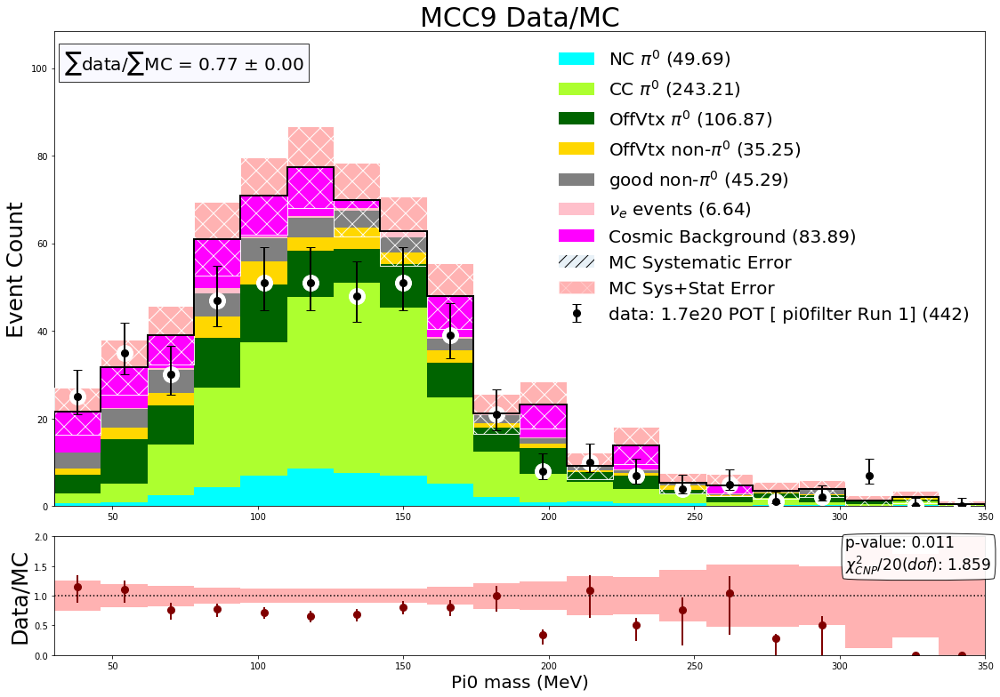

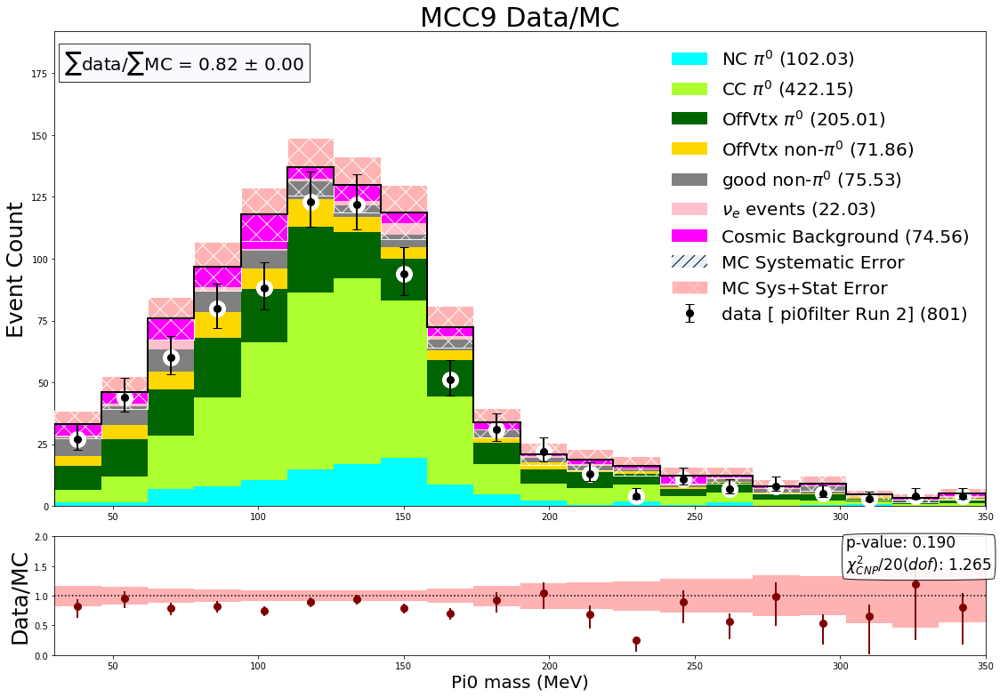

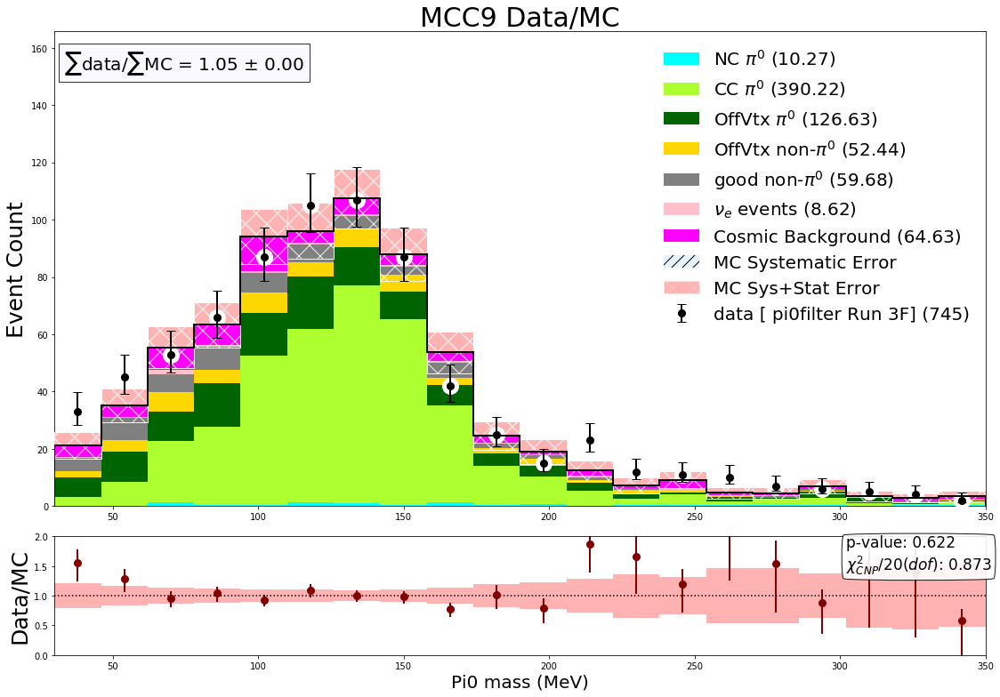

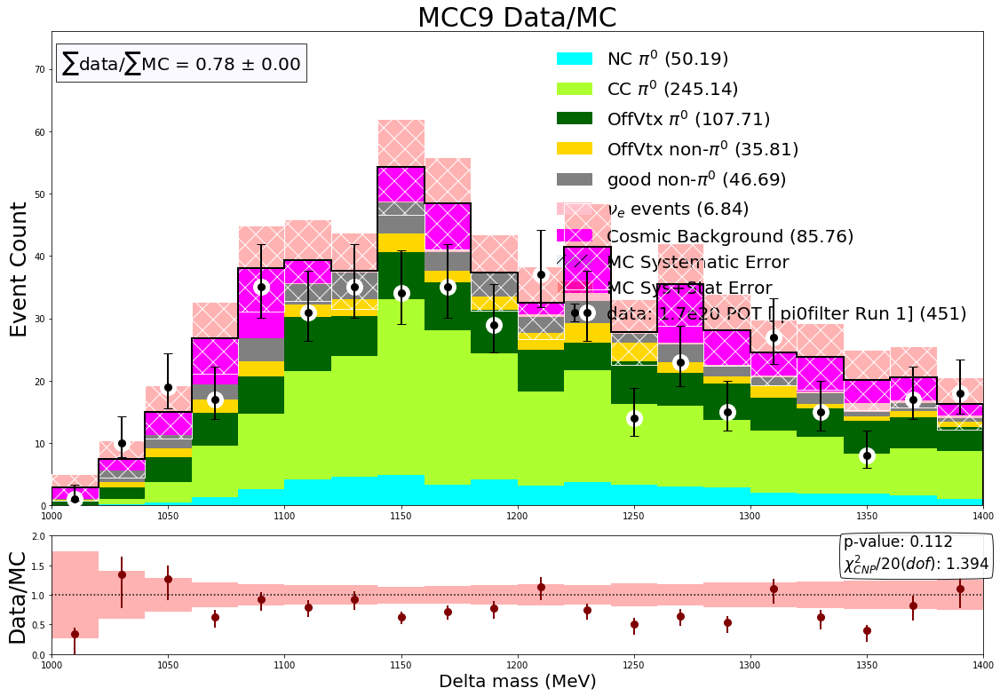

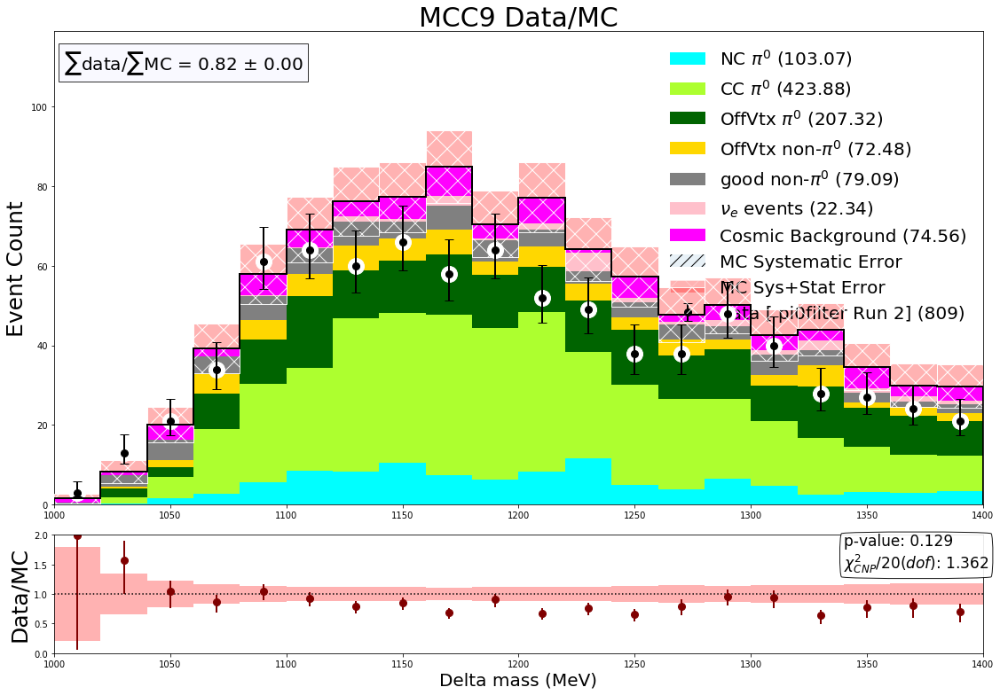

...

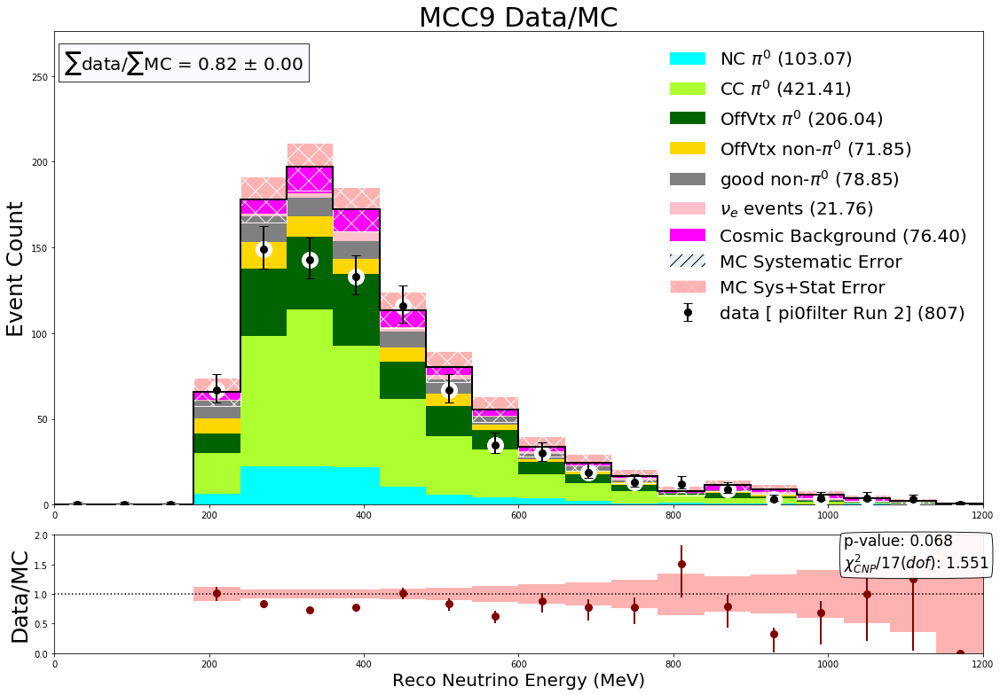

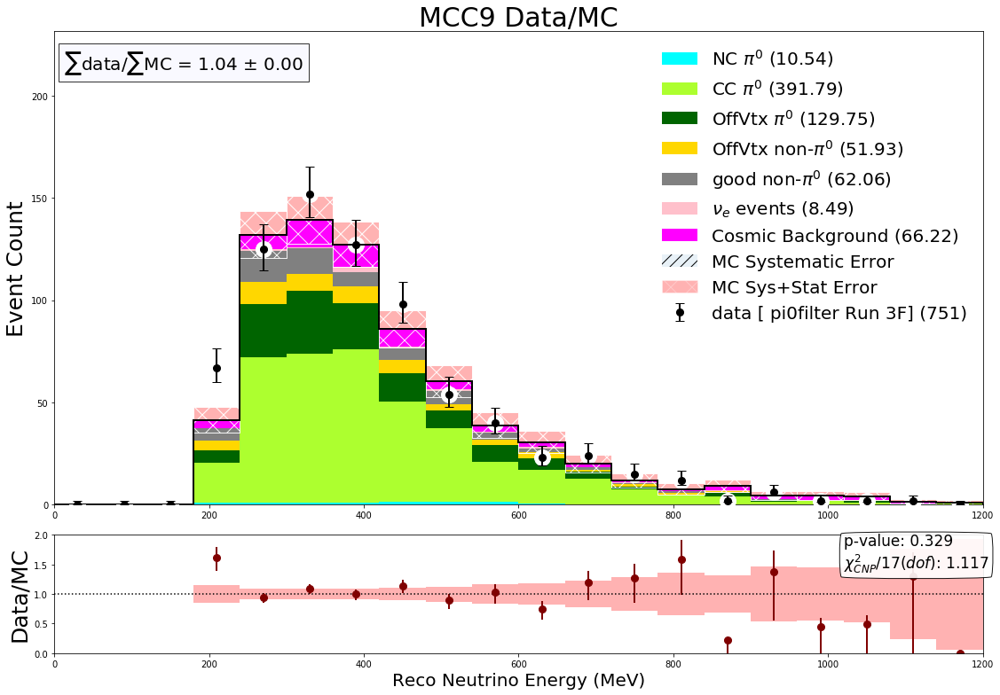

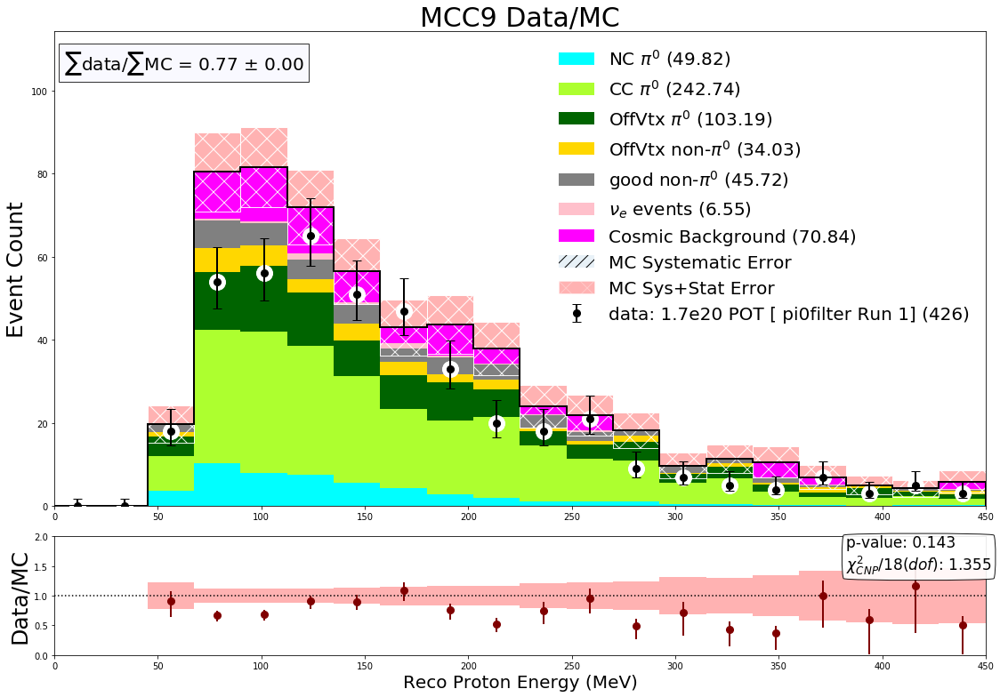

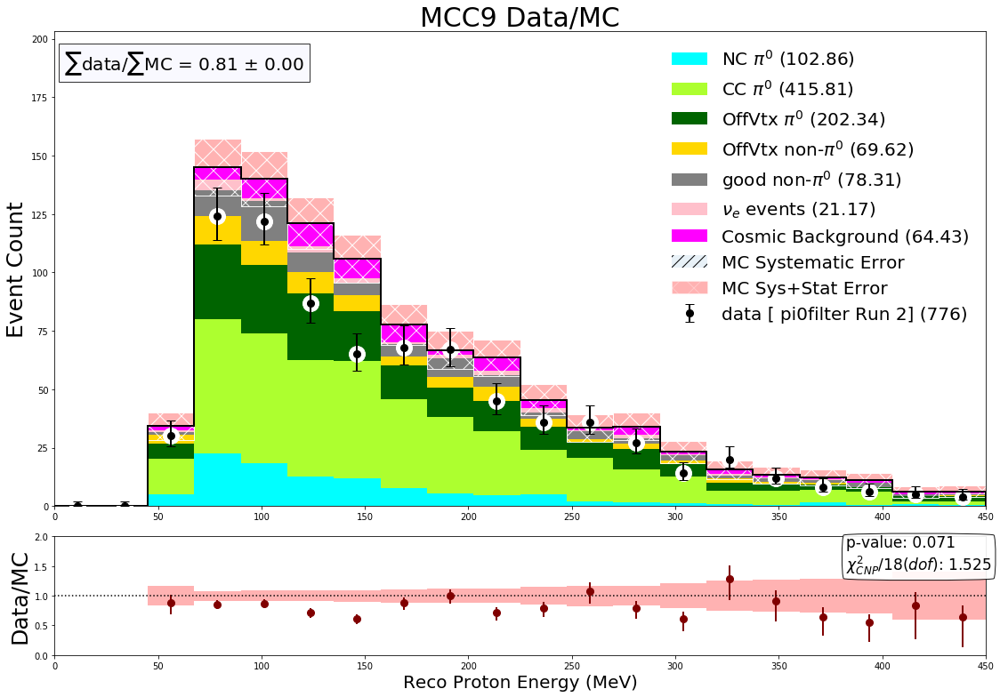

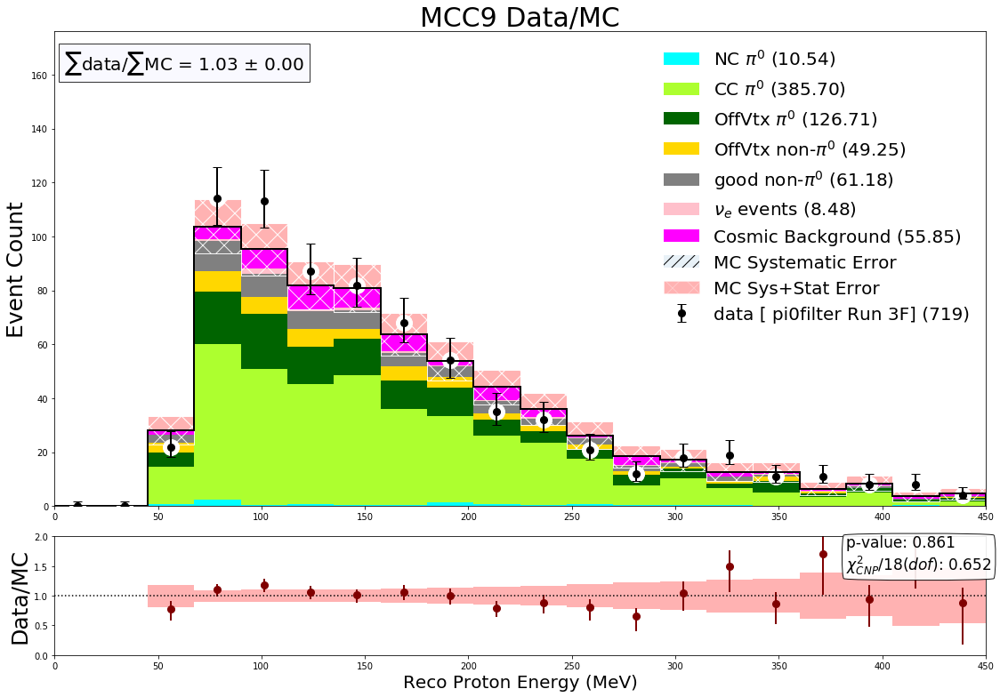

In [23]:
# individual runs again

EXT_R2_PI0FILTER_POT = EXT_R2D_PI0FILTER_POT +EXT_R2E_PI0FILTER_POT
EXT_R3_PI0FILTER_POT = EXT_R3F_PI0FILTER_POT +EXT_R3G_PI0FILTER_POT
EXT_R2_PI0FILTER_SCALE =  (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/ float(EXT_R2_PI0FILTER_POT)
EXT_R3_PI0FILTER_SCALE =  (DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/ float(EXT_R3_PI0FILTER_POT)

norm = 1.0
with PdfPages('output_20210205_individualruns_original.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]

        cov = np.zeros((nbins,nbins))
        run1_pi0filter_Hists = StackedHisto((df_numu_1mil_pi0.query('newhaspi0==0'),df_nue_pi0,df_ccpi0_r1_pi0,df_ncpi0_r1_pi0),(1.0,1.0,1.0,1.0))
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_pi0filter_Hists.AddStrata('haspi0==1  and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_pi0filter_Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_pi0filter_DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [ pi0filter Run 1]')
        fig3,ax3,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_pi0filter_Hists,run1_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        df_data_r2=df_data_r2D_pi0filter_pi0.append(df_data_r2E_pi0filter_pi0)
        run2D_pi0filter_Hists = StackedHisto((df_numu_r2_1mil_pi0,df_nue_r2_pi0),(1.0,1.0))
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2D_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2D_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2D_pi0filter_DataHist = SimpleHisto(df_data_r2,1.0,0,'','data [ pi0filter Run 2]')
        fig4,ax4,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2D_pi0filter_Hists,run2D_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        df_data_r3=df_data_r3F_pi0filter_pi0.append(df_data_r3G_pi0filter_pi0)
        run3F_pi0filter_Hists = StackedHisto((df_numu_r3_pi0.query('newhaspi0==0'),df_nue_r3_pi0,df_ccpi0_r3_pi0,df_ncpi0_r3_pi0),(1.0,1.0,1.0,1.0))
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run3F_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run3F_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run3F_pi0filter_DataHist = SimpleHisto(df_data_r3,1.0,0,'','data [ pi0filter Run 3F]')
        fig6,ax6,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3F_pi0filter_Hists,run3F_pi0filter_DataHist,varname,m_cov=cov)

        #save to pdf file of plots
#         pdf.savefig(fig1)
#         pdf.savefig(fig3)
#         pdf.savefig(fig4)
#         pdf.savefig(fig5)
#         pdf.savefig(fig6)
#         pdf.savefig(fig7)

In [24]:
print(len(df_numu_pi0.query('newhaspi0==1 and MC_scedr<5 and ccnc==0'))*(DATA_R1_PI0FILTER_POT)/NUMU_R1_POT)
print(len(df_ccpi0_r1_pi0.query('MC_scedr<5'))*(DATA_R1_PI0FILTER_POT)/CCPI0_R1_POT)
print(len(df_ext_total))

1270.622041175823
218.4559009641271
212



True
True
913
4568
2548
696
827


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



3345
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 76.50010536927894
SUM 1037.3436624823837
SUM 372.47006251278634
SUM 144.12465468714169
SUM 167.33133463959823
SUM 18.47657738537041
SUM 257.9136930038672
Normalization Uncertainty: 0.0
yerr_mc_total [ 9.36996778 11.01114804 12.58609159 14.76613028 16.66293435 17.44542409
 16.92140324 15.47013871 13.24599631  8.29821198  8.72101365  5.76516691
  6.65059069  4.45836708  4.60620203  3.51789413  4.51055569  2.91944208
  2.62124943  2.6248022 ]
yerr_data 175.8835939546948
ERROR HERE
[0.11153352 0.09459773 0.07309932 0.06386332 0.0527616  0.05468749
 0.05495235 0.05926017 0.06517264 0.11227491 0.08962357 0.17291823
 0.10907653 0.19940631 0.20387832 0.24438209 0.13112841 0.347627
 0.27334907 0.22198559]
[0.13840449 0.11310829 0.08633499 0.07369911 0.06022925 0.06160691
 0.06193187 0.06753114 0.07749795 0.14085673 0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 77.75043628972247
SUM 1042.9085140187235
SUM 380.3543137141763
SUM 145.5282561005137
SUM 174.26362297400573
SUM 18.876005784555378
SUM 261.38908906816295
Normalization Uncertainty: 0.0
yerr_mc_total [ 3.31494736  5.14066096  7.74063314 10.0805619  12.15136856 12.80970083
 11.81893371 14.05427555 13.41569637 11.94559769 11.53068448 12.46400297
 10.20638298 11.46344636 10.98239643  9.68645737  9.89452907  9.06171444
  8.42945387  7.55074133]
yerr_data 196.18156855514079
ERROR HERE
[0.2151538  0.20300716 0.1248256  0.0892392  0.08660765 0.07000793
 0.07987006 0.06470114 0.06586137 0.07733989 0.08441081 0.07388719
 0.07966203 0.07645579 0.07891014 0.10003166 0.08527574 0.08913262
 0.10223964 0.11748019]
[0.4568148  0.28706349 0.16105208 0.11132367 0.1017788  0.08249556
 0.09401287 0.07517233 0.07756626 0.09118652 0.0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 76.17997792139255
SUM 1034.1803549549581
SUM 376.1742636691982
SUM 144.94631715057636
SUM 173.3559430603649
SUM 17.7229307637762
SUM 260.460162750952
Normalization Uncertainty: 0.0
yerr_mc_total [ 7.84544857 16.21722618 17.69024969 16.92521978 16.11291271 15.71126901
 12.8245017  12.05416912  9.97845671 10.02002591  7.93837651  7.20727543
  6.15268232  5.25810575  4.51522544  4.8215848   3.12841709  3.12570199
  2.7903133   1.95368503]
yerr_data 174.9034266244726
ERROR HERE
[0.1268395  0.061538   0.057249   0.05923325 0.05620134 0.05707173
 0.07137173 0.07363487 0.0862421  0.07850194 0.10030947 0.12417387
 0.13193795 0.13493297 0.10112696 0.13654226 0.31544517 0.23240869
 0.14959547 0.33993497]
[0.16435296 0.06986284 0.06389813 0.06656239 0.06415583 0.06547273
 0.08382968 0.0885086  0.10612722 0.09941529 0.131510

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



SUM 350.3370328936017
SUM 126.96682370705831
SUM 160.3349420699642
SUM 17.308002543151588
SUM 230.69514225038097
Normalization Uncertainty: 0.0
yerr_mc_total [15.57684333 16.60590545 15.9804553  15.04444794 15.11085657 12.82386547
 10.87996049 10.91684996  9.96375369  8.08454173  7.80090945  5.98526704
  5.96428338  5.77974916  4.19987981  4.48652125  3.14126138  2.79864668
  2.84107503  2.76437467]
yerr_data 169.0433703147549
ERROR HERE
[0.06101402 0.05950103 0.06458036 0.06176766 0.06190494 0.06999319
 0.08679938 0.07122504 0.07988079 0.09258889 0.09830187 0.12838542
 0.15944473 0.09245008 0.15315883 0.13720684 0.23011205 0.3273224
 0.26187152 0.12030808]
[0.06964967 0.0670295  0.07272061 0.07095399 0.07149256 0.0824324
 0.10385926 0.08873135 0.10186689 0.12268515 0.13225381 0.18355318
 0.22320973 0.15739064 0.2660396  0.25009162 0.43192568 0.58154587
 0.50860232 0.38122709]
chi2 in bins
0.04200840630630247
0.3944258068504481
2.611183416690655
0.2575634070139621
0.6384326768630423
0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



SUM 1011.020795733128
SUM 368.1901338012974
SUM 142.5393971194329
SUM 169.4177779051326
SUM 16.4854972592391
SUM 250.9629008752758
Normalization Uncertainty: 0.0
yerr_mc_total [16.61942982 17.20619181 15.39326639 14.94157104 13.75936649 12.35161935
 12.22507698 10.99940485  9.14303157  8.89489791  8.76535394  7.93395132
  5.71454702  6.18610529  5.38711514  5.30765892  4.3928537   4.15285919
  3.54836588  3.91884438]
yerr_data 178.8328714280173
ERROR HERE
[0.06278896 0.05636841 0.06141226 0.065266   0.07110168 0.07162838
 0.07345113 0.08476189 0.09227287 0.08639667 0.09375794 0.08864253
 0.15994659 0.14349518 0.152045   0.13392583 0.09964515 0.11298183
 0.1408505  0.14174925]
[0.07071837 0.06365441 0.06992507 0.07472952 0.08233679 0.0847991
 0.0878238  0.10180363 0.11593508 0.11147043 0.12175788 0.12142452
 0.22089735 0.1999384  0.22003128 0.21144122 0.2014993  0.22846831
 0.29905396 0.2866409 ]
chi2 in bins
1.5713014391901863
0.04652678983807469
0.003178612085474139
0.074845089998793


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



SUM 135.62996519960762
SUM 160.25107574151397
SUM 18.023483324756626
SUM 239.50378701339426
Normalization Uncertainty: 0.0
yerr_mc_total [18.84958782 19.14750916 16.28644441 14.89715597 13.50557446 12.55980623
 10.99851605 10.66546591  9.0459882   7.73809505  6.43397371  6.42825831
  4.75391256  5.13938056  3.29330083  4.06446359  2.88189188  2.78550473
  1.92645553  2.00675609]
yerr_data 166.6464667303732
ERROR HERE
[0.04972512 0.05050986 0.0594432  0.07035322 0.06964632 0.06550241
 0.0721711  0.08078765 0.09312031 0.10169693 0.13027594 0.11375668
 0.19874292 0.14050373 0.31712922 0.16485391 0.19102441 0.28324958
 0.16069397 0.22829659]
[0.05564501 0.05650297 0.06703685 0.07991204 0.0810227  0.07855142
 0.08851901 0.10025125 0.11919211 0.13637845 0.17776699 0.16570342
 0.28582818 0.22462158 0.5006815  0.30943463 0.43089505 0.53166607
 0.66345034 0.72341647]
chi2 in bins
0.7854304039680396
0.4201513450675034
0.2678572665222652
2.908318735662385
0.010484830518408057
3.551851808343752
3.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



SUM 380.35431371417627
SUM 145.52825610051374
SUM 174.2636229740058
SUM 18.876005784555378
SUM 263.93555881524776
Normalization Uncertainty: 0.0
yerr_mc_total [ 9.92131369  8.27012028  8.70671307  8.13423079  8.67922386  8.72859387
  8.98323123  8.65131696  9.00434419  8.24457257  7.75813223  9.67585714
  9.27681225  9.44781121  9.56966655 11.1915117  12.81622344 14.9766087
 15.6554762  16.56832834]
yerr_data 197.48565423607616
ERROR HERE
[0.09081153 0.12828011 0.09535648 0.10474146 0.10654916 0.10091522
 0.09059317 0.0926749  0.0946156  0.09952453 0.1181048  0.09339835
 0.08766356 0.10179229 0.09786365 0.08999228 0.07202684 0.06060599
 0.05667084 0.06034079]
[0.11269011 0.15859598 0.12355866 0.13458923 0.13387235 0.12801463
 0.11595743 0.12008399 0.12002334 0.13015887 0.15117175 0.11770937
 0.11101761 0.12540538 0.11929443 0.10744853 0.08527083 0.07009975
 0.06499165 0.06825067]
chi2 in bins
0.1899995637369796
3.565501415505909
0.9426721720556658
0.10294943217334929
0.0669296248142996

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 77.3598202347094
SUM 1041.3170254501422
SUM 378.24291191141936
SUM 144.06333170173153
SUM 174.09541040598643
SUM 18.002331240259544
SUM 263.9355588152477
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.         11.09994616 20.54134074 20.86942896
 19.25332457 15.91704727 13.19259449 10.30412827  9.93602899  8.97458469
  5.43153377  6.31685072  5.2687471   4.84406765  3.86953764  2.54821692
  1.77981954  1.71669732]
yerr_data 154.70887227540766
ERROR HERE
[ 0.          0.          0.          0.0938239   0.04666922  0.04616536
  0.04807428  0.06141196  0.06521901  0.08615148  0.08405868  0.09069943
  0.16441431  0.15707592  0.10042751  0.15771034  0.16589145  0.30161557
  0.46320261 -0.05894221]
[0.         0.         0.         0.10980939 0.05175601 0.0510207
 0.05361341 0.06956241 0.0767

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


True
913
4568
2548
696
827
3345
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 76.7808387517058


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



SUM 1027.4065267771432
SUM 368.5817347381959
SUM 138.22152441707456
SUM 171.89613247787838
SUM 18.106199094187
SUM 219.5803369448309
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          8.43748905 17.71525237 17.61145954 16.08041842
 15.40907165 13.19156473 13.05692245 11.6258166   9.99514109  9.04041729
  7.72055917  6.67244319  5.95072387  6.62909823  5.06573057  4.68587152
  3.39545162  4.49153049]
yerr_data 170.87936827145697
ERROR HERE
[0.         0.         0.10335867 0.05418762 0.05518386 0.05918119
 0.05752218 0.07383835 0.07196792 0.06915577 0.08490477 0.10364033
 0.09863982 0.11842923 0.15833498 0.11165856 0.18192445 0.1444071
 0.28212952 0.13887881]
[0.         0.         0.13111424 0.06088028 0.06201195 0.06731126
 0.06626063 0.08554013 0.08448572 0.08438323 0.10522773 0.12983452
 0.13146387 0.16287883 0.21373693 0.16377416 0.26879103 0.23402601
 0.45103698 0.25313918]
chi2 in bins
0.02044778715611414
0.047018103993153634
0.0003434736011626177
0.0666657798

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


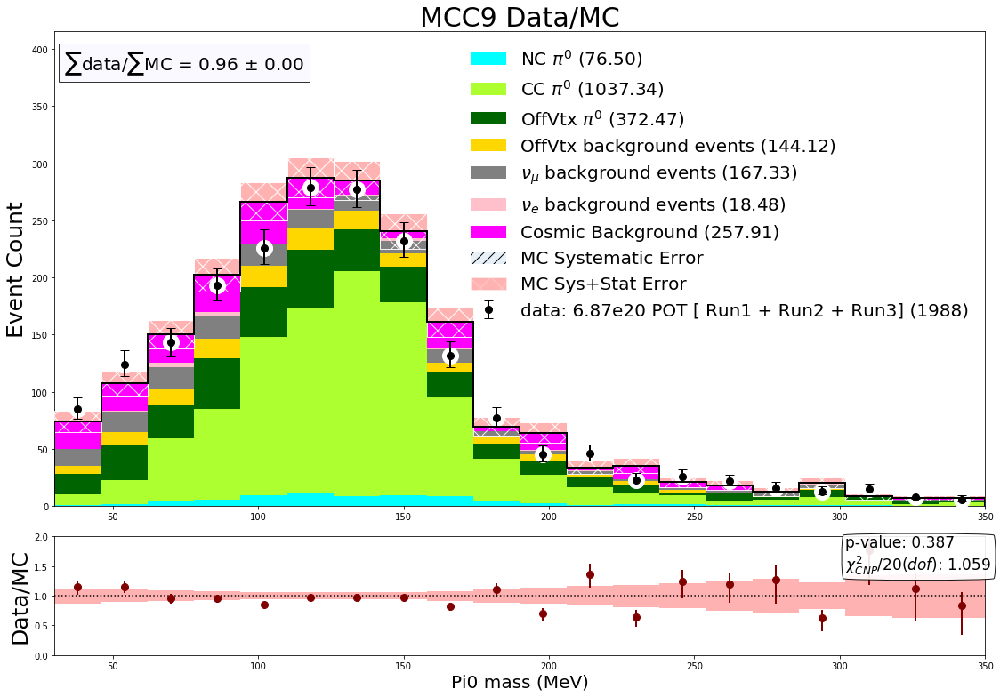

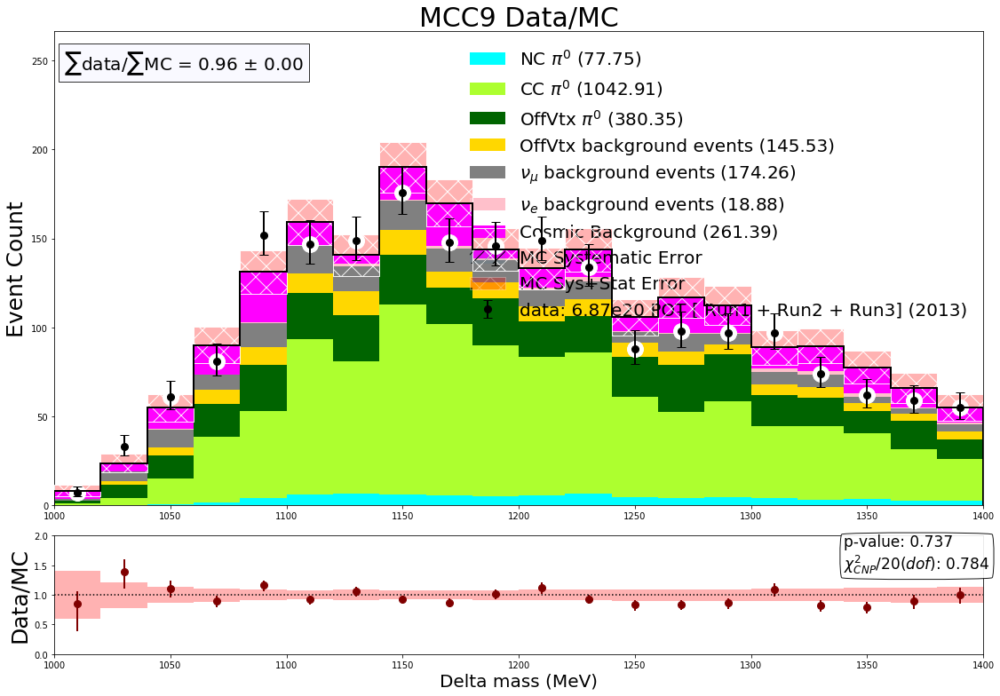

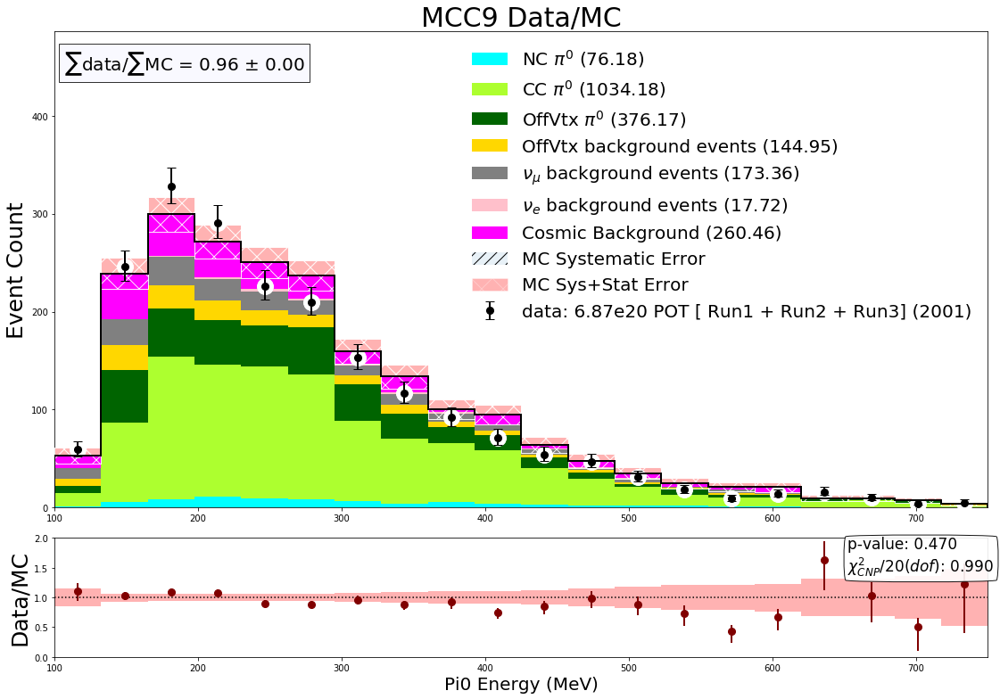

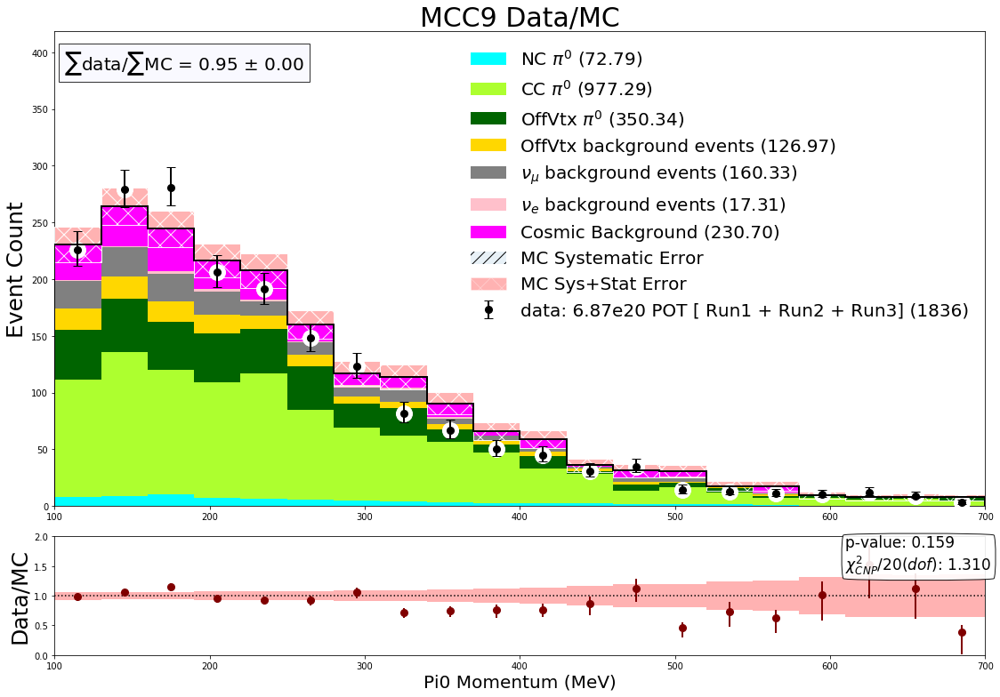

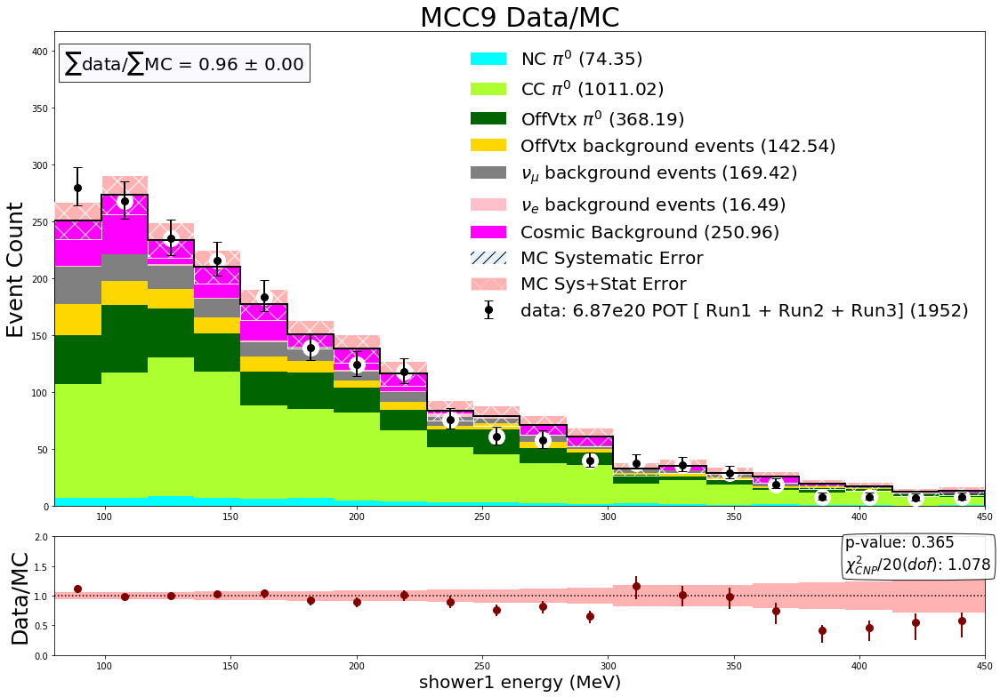

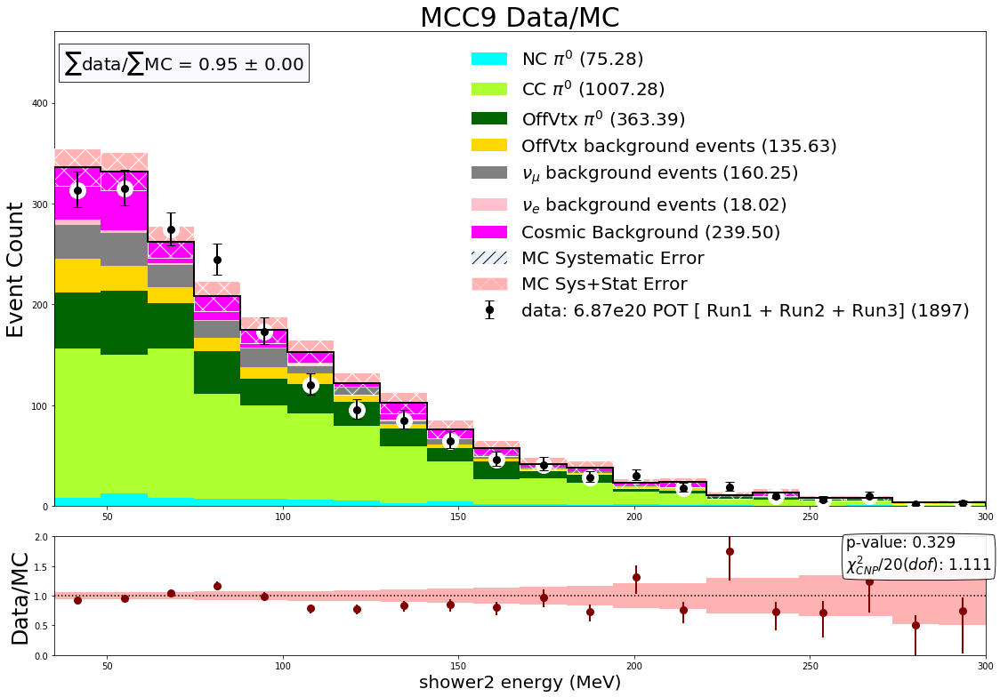

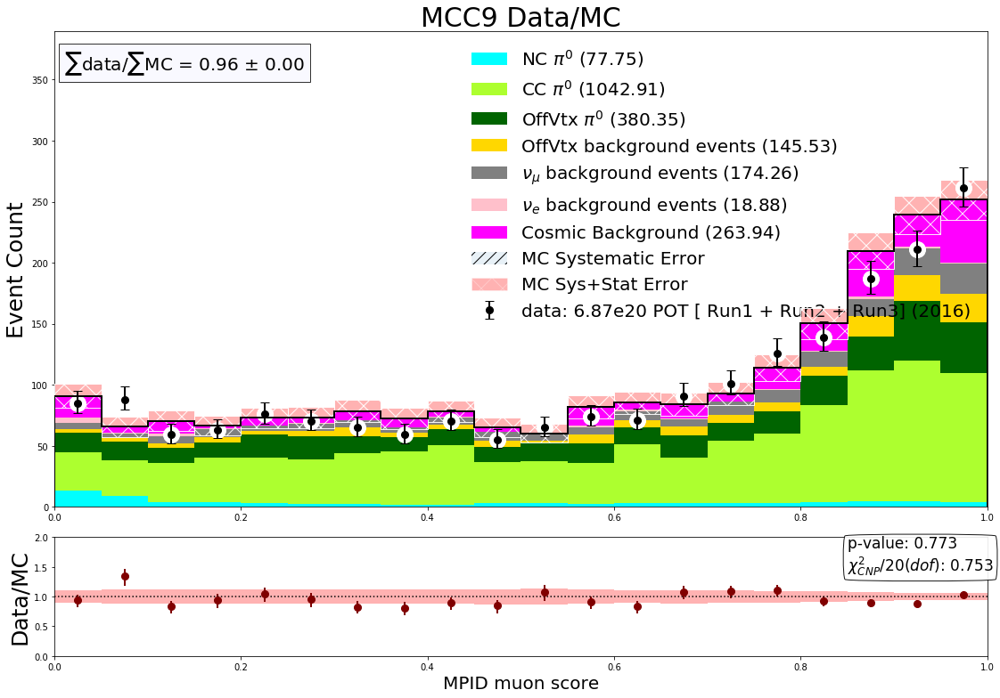

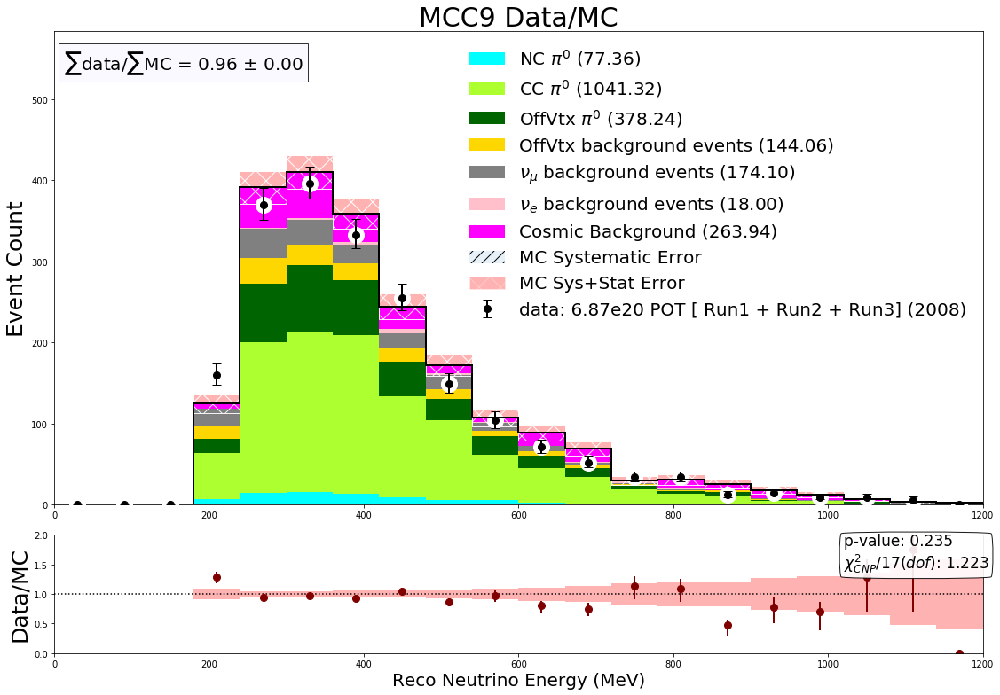

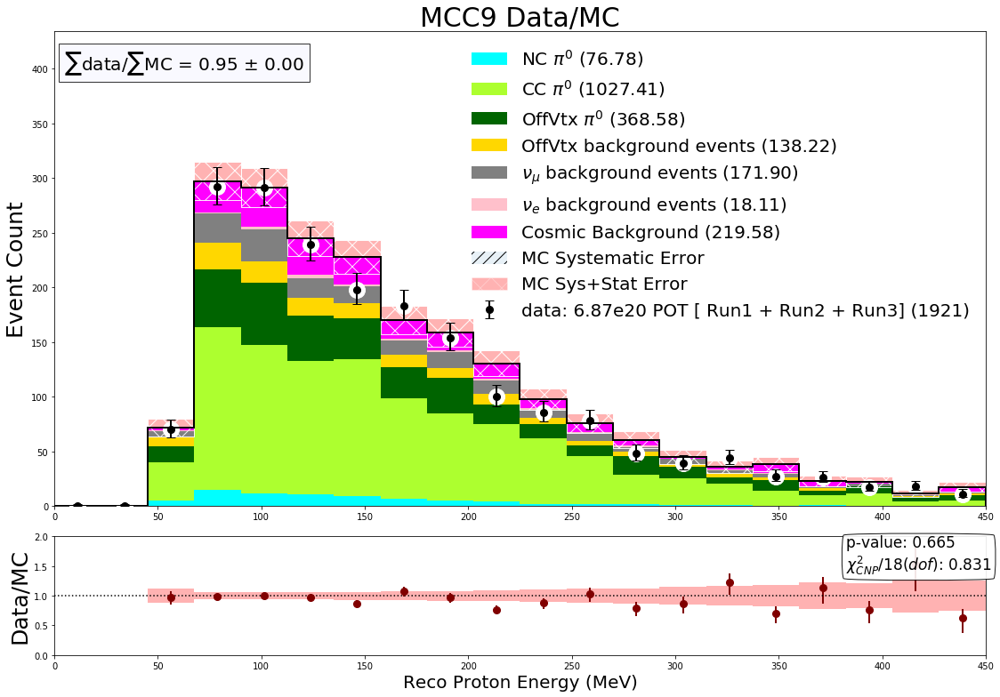

In [25]:
norm = 1.0
print()
print('xsec_corr_weight' in df_nue_total.keys())
with PdfPages('output_combined_20210205_highstatsrun1.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
#         cov = s_cov +d_cov
        cov = np.zeros((nbins,nbins))
        print('xsec_corr_weight' in df_ccpi0_total.keys())
        run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG == 12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
        run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],1.0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 6.87e20 POT [ Run1 + Run2 + Run3]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)
        fig1.savefig(vartest_list[i]+'_20210413.png')

In [26]:
# # # plot the resolution distributions

# # first cut for events with a true pi0 with two contained showers.
# contained_pi0='haspi0==1 and shower_energy_true >=0 and secondshower_energy_true >=0 '
# df_numu_total.query(contained_pi0+'and (newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14')
# df_nue_total.query(contained_pi0+'and MC_parentPDG ==12')
# df_ncpi0_total.query(contained_pi0)
# df_ccpi0_total.query(contained_pi0)

# df_nue_r1=df_nue_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7 ")
# df_nue_r2=df_nue_r2_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7")
# df_nue_r3=df_nue_r3_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7")

# def getangleres(df):
# #     funtion to get the angle between true and reco shower directions
#     angleres= []
#     for i in range(len(df)):
#         recox1 = df['shower1_dir_3d_X'].values[i]
#         recoy1 = df['shower1_dir_3d_Y'].values[i]
#         recoz1 = df['shower1_dir_3d_Z'].values[i]
#         recox2 = df['shower2_dir_3d_X'].values[i]
#         recoy2 = df['shower2_dir_3d_Y'].values[i]
#         recoz2 = df['shower2_dir_3d_Z'].values[i]
        
#         truex1 = df['first_direction_true_X'].values[i]
#         truey1 = df['first_direction_true_Y'].values[i]
#         truez1 = df['first_direction_true_Z'].values[i]
#         truex2 = df['second_direction_true_X'].values[i]
#         truey2 = df['second_direction_true_Y'].values[i]
#         truez2 = df['second_direction_true_Z'].values[i]
        
#         dot1 = recox1*recox2+recoy1*recoy2+recoz1*recoz2
#         dot2 = truex1*truex2+truey1*truey2+truez1*truez2
        
#         magreco1 = sqrt(recox1**2+recoy1**2+recoz1**2)             
#         magreco2 = sqrt(recox2**2+recoy2**2+recoz2**2)
#         magtrue1 = sqrt(truex1**2+truey1**2+truez1**2)             
#         magtrue2 = sqrt(truex2**2+truey2**2+truez2**2) 
        
#         cosdir1 = dot1/(magreco1*magreco2)
#         cosdir2 = dot2/(magtrue1*magtrue2)
#         alpha1 = acos(cosdir1) * 180.0 / 3.14159
#         alpha2 = acos(cosdir2) * 180.0 / 3.14159

#         angleres.append((alpha1-alpha2)/alpha2)

#     return angleres




# def getenergyres(df):
# #     funtion to get the angle between true and reco shower directions
#     energyres1 = []
#     energyres2 = []
#     for i in range(len(df)):
#         reco1 = df['shower1_E_Y_new'].values[i]
#         reco2 = df['shower2_E_Y_new'].values[i]
#         if(reco2 >reco1):
#             reco2 = df['shower1_E_Y_new'].values[i]
#             reco1 = df['shower2_E_Y_new'].values[i]
#         true1 = df['gamma_1_true'].values[i]
#         true2 = df['gamma_2_true'].values[i]
#         if (true2>true1):
#             true2 = df['gamma_1_true'].values[i]
#             true1 = df['gamma_2_true'].values[i]
#         print(true1,true2)
        
#         energyres1.append((reco1-true1)/true1)
#         energyres2.append((reco2-true2)/true2)
# #         energyres2.append(-999)

#     return energyres1,energyres2

# # add all of the data frames
# # df_data_total = df_fakedata1_run1_pi0.append(df_fakedata1_run3_pi0)
# df_data_total_1 = df_data_r1_pi0filter_pi0.append(df_data_r3F_pi0filter_pi0)
# df_data_total = df_data_total_1.append(df_data_r3G_pi0filter_pi0)

# print("total number of data pi0: ",len(df_data_total['_pi0mass'].values))
# # scale CV weights:
# def potscale(df,scalefactor=1.0,ext=False):
#     pot_weight = []
#     for i in range(len(df)):
#         if ext==False:
#             pot_weight.append(scalefactor)
#         else:
#             pot_weight.append(scalefactor)
#     return pot_weight

# # general mc
# w_cc_1 =potscale(df_ccpi0_r1_pi0,DATA_R1_PI0FILTER_POT/CCPI0_R1_POT)
# w_cc_3 =potscale(df_ccpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(CCPI0_R3_POT))
# df_ccpi0_r1_pi0['pot_weight'] = w_cc_1
# df_ccpi0_r3_pi0['pot_weight'] = w_cc_3
# df_ccpi0_total = df_ccpi0_r1_pi0.append(df_ccpi0_r3_pi0)

# w_nc_1 =potscale(df_ncpi0_r1_pi0,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT)
# w_nc_3 =potscale(df_ncpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
# df_ncpi0_r1_pi0['pot_weight'] = w_nc_1
# df_ncpi0_r3_pi0['pot_weight'] = w_nc_3
# df_ncpi0_total = df_ncpi0_r1_pi0.append(df_ncpi0_r3_pi0)

                 


# a1_cc = getangleres(df_ccpi0_total)
# e1_cc,e2_cc = getenergyres(df_ccpi0_total)
# df_ccpi0_total["AngleRes"]=a1_cc
# # df_ccpi0_total["AngleRes2"]=a2_cc
# df_ccpi0_total["EnergyRes1"]=e1_cc
# df_ccpi0_total["EnergyRes2"]=e2_cc

# a1_nc = getangleres(df_ncpi0_total)
# e1_nc,e2_nc = getenergyres(df_ncpi0_total)
# df_ncpi0_total["AngleRes"]=a1_nc
# # df_ncpi0_total["AngleRes2"]=a2_nc
# df_ncpi0_total["EnergyRes1"]=e1_nc
# df_ncpi0_total["EnergyRes2"]=e2_nc


In [27]:
# vartest_list = []
# varname_list = []
# myrange_list = []
# detvar_list  = []
# sys_list = []
# bins_list = []


# vartest_list.append('AngleRes')
# varname_list.append('Opening Angle Res (reco-true)/true')
# # myrange_list.append((-1,1))
# myrange_list.append((-1,2))
# detvar_list.append('none')
# sys_list.append('none')
# bins_list.append(20)

# # vartest_list.append('AngleRes2')
# # varname_list.append('Cosine Angle between true and reco subleading showers')
# # myrange_list.append((-1,1))
# # # myrange_list.append((0,180))
# # detvar_list.append('none')
# # sys_list.append('none')
# # bins_list.append(20)

# vartest_list.append('EnergyRes1')
# varname_list.append('Energy Res of leading shower (reco-true)/true')
# myrange_list.append((-1,2))
# detvar_list.append('none')
# sys_list.append('none')
# bins_list.append(20)

# vartest_list.append('EnergyRes2')
# varname_list.append('Energy Res of subleading shower (reco-true)/true')
# myrange_list.append((-1,2))
# detvar_list.append('none')
# sys_list.append('none')
# bins_list.append(20)



# for i in range(len(vartest_list)):
#     vartest = vartest_list[i]
#     varname = varname_list[i]
#     myrange = myrange_list[i]
#     nbins =bins_list[i]

#     cov = np.zeros((nbins,nbins))
#     run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
#     run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#     run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#     run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=2 ',r"OffVtx $\pi^0$",'darkgreen')
# #     run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
# #     run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
# # #         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
# #     run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
#     fig1,ax1 = distplot_mc(vartest,nbins,myrange,run1_open_Hists,varname)
#     fig1.savefig(vartest_list[i]+'_20210413.png')
    

In [28]:
# # make 2d hist:
# import matplotlib

# var_reco =df_nue_r1['shower1_E_Y_new'].values
# var_true =df_nue_r1['shower_energy_true'].values

# x = [i for i in range(80,1000)]
# y = [i for i in range(80,1000)]

# plt.hist2d(var_true, var_reco, bins=(20, 20), range = ((80,1000),(80,1000)))
# plt.plot(x,y,'--',color = 'black')
# plt.xlabel('true leading shower energy (MeV)')
# plt.ylabel('reco leading shower energy (MeV)')
# plt.colorbar(label='number of events')

# # plt.show()



In [29]:
# # electron simple resolution

# print(df_nue_r1["EnergyRes1"].values)
# vartest = "EnergyRes1"
# varname = 'Energy Res of electron (reco-true)/true'
# myrange = [-1,2]
# nbins =20

# cov = np.zeros((nbins,nbins))
# run1_open_Hists = StackedHisto((df_nue_r1,df_nue_r3,df_nue_r3),(1.0,1.0,1.0))
# # run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
# # run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
# # run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=2 ',r"OffVtx $\pi^0$",'darkgreen')
# # run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
# # run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
# #         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
# run1_open_Hists.AddStrata('haspi0==1 or haspi0==0',r"$\nu_e$ simulated events",'pink')
# fig1,ax1 = distplot_mc(vartest,nbins,myrange,run1_open_Hists,varname)
# fig1.savefig('electronres_20210413.png')

In [30]:
# # choose mpid muon cut value

# pur_NC = []
# pur_CC = []
# cutvals= [.01*i for i in range(1,99)]

# eff_NC=[]
# eff_CC=[]


# for cut in cutvals:
#     muoncut = str(cut)
#     countcc=len(df_numu_total.query('haspi0 ==1 and ccnc==0 and MC_scedr<5 and MPID_muon >=' + muoncut))
#     totalcc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and MPID_muon >=' + muoncut))
#     countnc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and ccnc==1 and MPID_muon <' + muoncut))
#     totalnc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and MPID_muon <' + muoncut))
#     pur_CC.append(float(countcc)/float(totalcc))
#     pur_NC.append(float(countnc)/float(totalnc))
#     print(float(countnc)/float(totalnc), cut)
#     eff_CC.append(float(countcc)/float(len(df_numu_total.query('haspi0 ==1 and ccnc==0 and MC_scedr<5' ))))
#     eff_NC.append(float(countnc)/float(len(df_numu_total.query('haspi0 ==1 and ccnc==1 and MC_scedr<5' ))))
    
# plt.scatter(cutvals,pur_NC,color ='blue',label = "NC purity",marker='.')
# plt.scatter(cutvals,pur_CC,color ='red',label = "CC purity",marker='.')
# plt.legend()
# plt.xlabel('Muon MPID cut value')
# plt.ylabel('sample purity (cc or nc)pi0/totalpi0')
# plt.show()
# plt.close()

# plt.scatter(cutvals,eff_NC,color ='blue',label = "NC eff",marker='.')
# plt.scatter(cutvals,eff_CC,color ='red',label = "CC eff",marker='.')
# plt.legend()
# plt.xlabel('Muon MPID cut value')
# plt.ylabel('sample efficiency (cc or nc)pi0 in cut /total(cc or nc) pi0')
# plt.show()

In [31]:
# reset covariance matrices for weighted
detvar1_list  = []
detvar3_list  = []
sys_list = []

sys_list.append('../systematics/covar_pi0_weighted__pi0_mass_reco.txt')
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run3_cov.csv')


detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__Delta_mass_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__pi0_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__pi0_momentum_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__shower1_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__shower2_energy_reco.txt')

detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run3_cov.csv')
sys_list.append('../systematics/covar_pi0_weighted__mpid_muon_score.txt')

detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')

detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 16.83539055756503
SUM 62.91544521770039
SUM 31.63909072006914
SUM 5.9951869612831015
SUM 9.436005707484256
SUM 4.789994357833299
SUM 17.03156283789034
Normalization Uncertainty: 0.0
yerr_mc_total [1.22120294 2.60198321 3.04154479 4.30425696 4.10921515 4.4878406
 4.2295231  4.82643434 3.21335523 2.39311442 3.35168205 1.10403457
 1.95995779 1.12271452 0.82402374 1.03131358 1.14076806 0.62051573
 1.27307317 0.49615438]
yerr_data 46.35689918426982
ERROR HERE
[ 0.78099581  0.4401172   0.18524362  0.1130358   0.21266565  0.23868277
  0.19498183  0.16385244  0.3438903   0.27702394  0.14538264  1.13625493
 -0.04521894  0.92402923  1.71531914  0.86438481  0.2279519   0.77042849
  0.15265464 -0.70563513]
[2.11744108 0.82611026 0.39330948 0.22857746 0.32834948 0.3375108
 0.30429479 0.24814136 0.5366860

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 17.297223305344968
SUM 63.62554010330938
SUM 31.67377078342102
SUM 6.203061037637781
SUM 9.43600570748426
SUM 4.887165463364528
SUM 18.627329032257418
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.91761189 1.15804831 2.59398475 2.80212162 3.23701955
 3.14575311 4.00835525 3.58514951 3.23631722 3.64162901 3.10181998
 3.0010172  3.18504472 2.77428382 2.19147339 2.01996101 2.59970544
 2.39345643 2.88189777]
yerr_data 52.28556035232613
ERROR HERE
[0.         0.35230586 0.68554386 0.13663242 0.42350348 0.2705069
 0.22945538 0.17734993 0.21512509 0.26253961 0.19887872 0.30215797
 0.25212188 0.15639151 0.26070433 0.56252698 0.47754801 0.22405243
 0.24891603 0.27769586]
[0.         2.72813449 2.17232206 0.43295497 0.67704981 0.46052154
 0.4306931  0.31509338 0.36623737 0.44695771 0.3454

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: divide by zero encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 17.059239201317276
SUM 63.1932975346489
SUM 31.55302868638039
SUM 6.203061037637782
SUM 9.436005707484258
SUM 4.6506752185021405
SUM 18.62732903225742
Normalization Uncertainty: 0.0
yerr_mc_total [1.11593975 3.87241036 4.93062607 4.42094483 4.06429884 4.00603592
 3.82282767 2.85212945 2.92959435 2.37811238 2.01481866 2.09612949
 2.75242026 0.89337145 1.47414406 2.19468335 0.42407265 0.89026544
 0.63639105 0.25506706]
yerr_data 47.296205072206405
ERROR HERE
[ 0.93528268  0.24404479  0.17695476  0.22145186  0.15520318  0.20522544
  0.20669173  0.24993577  0.28789578  0.31358151  0.58505537  0.24695844
  0.15413551  1.1519257  -0.06960386  0.19894858  1.64951928 -0.21916683
  0.73246994 -2.66996206]
[ 2.53574468  0.37679796  0.25776075  0.3324517   0.27574577  0.34313105
  0.33998294  0.4854209

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 16.09888881966005
SUM 57.18683065438
SUM 24.985540724901313
SUM 5.920598536079063
SUM 9.13599197279579
SUM 4.559747221255013
SUM 18.62732903225742
Normalization Uncertainty: 0.0
yerr_mc_total [3.74840498 3.96432896 4.53812997 3.99711268 3.27332187 3.59837951
 3.05146306 2.72057091 2.04418652 2.26813052 2.48415613 1.62756557
 2.53160566 1.80452454 0.54326719 2.14377966 0.52109036 0.64913422
 0.71956543 0.27906577]
yerr_data 45.6910988088224
ERROR HERE
[ 0.22831616  0.26526436  0.16193882  0.21490411  0.25213802  0.15642643
  0.25122855  0.25226596  0.61352298  0.26921859  0.3331286   0.34706564
  0.17954958  0.19584315  1.00510393  0.09939087  1.09247586  0.70399395
 -0.33548513  3.80912111]
[ 0.37000896  0.39192467  0.25566793  0.35349132  0.4379682   0.33212478
  0.45792292  0.51012431  1.0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 16.76809576150735
SUM 62.07357669265075
SUM 31.49644799632715
SUM 5.724818426078716
SUM 9.135991972795788
SUM 4.451397495228644
SUM 15.167321419968374
Normalization Uncertainty: 0.0
yerr_mc_total [3.70974557 4.54540178 3.94279996 3.44345836 4.2052108  2.97624795
 3.28622132 2.98486857 2.2220918  2.6264154  2.18950719 2.30280863
 1.92480398 1.86269492 1.24381542 2.04771098 1.38825503 1.10728942
 1.04153952 0.74428026]
yerr_data 49.72214430704158
ERROR HERE
[ 0.27363388  0.17712821  0.1905916   0.33493235  0.15637086  0.23862473
  0.27902708  0.23765087  0.39461993  0.20077715  0.22764268  0.34637382
  0.47867657  0.18380212  0.89521892  0.35607227 -0.07720993  0.52012971
  0.27345535  0.53550672]
[0.41828202 0.27348073 0.31866369 0.50281281 0.27782037 0.46345281
 0.49574073 0.44607622 0.79798

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 16.941669348975317
SUM 61.21783332513707
SUM 30.60657972653983
SUM 5.9832004178384075
SUM 9.03502480524865
SUM 4.700246336824897
SUM 17.03156283789034
Normalization Uncertainty: 0.0
yerr_mc_total [4.44283965 5.97039695 3.93640496 3.49934963 4.30786551 2.72927881
 3.00050317 2.80377343 2.83235014 2.05220556 1.72527273 1.5339812
 1.49154286 1.21435969 0.4875226  0.56838509 0.71379581 1.04760796
 0.45030664 0.62946575]
yerr_data 44.88657189049425
ERROR HERE
[ 0.19604527  0.12432444  0.27523293  0.32431878  0.15080637  0.28376437
  0.15383422  0.19386337  0.32970408  0.25688297  0.53300186  0.27101535
  0.52354367  0.78982286  1.24809725  1.97400666 -0.34093051  0.27029645
 -0.85663765 -0.4383991 ]
[0.29689481 0.18511391 0.40369536 0.48687933 0.26195333 0.55112224
 0.37515652 0.43729892 0.640345

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 17.29722330534497
SUM 63.62554010330936
SUM 31.67377078342102
SUM 6.203061037637781
SUM 9.43600570748426
SUM 4.8871654633645285
SUM 18.627329032257414
Normalization Uncertainty: 0.0
yerr_mc_total [9.3492101  8.27824047 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.        ]
yerr_data 17.80155942610398
ERROR HERE
[0.09838673 0.1275924  0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.        ]
[0.12193675 0.15719042 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 17.068790563587058
SUM 63.545302986422655
SUM 31.572781621725678
SUM 6.203061037637782
SUM 9.43600570748426
SUM 4.690632814429568
SUM 18.62732903225742
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         0.         3.60379743 5.95213528 4.71043176
 5.30721037 5.03230975 2.96635845 2.43144993 2.29276649 2.40837747
 1.24672222 0.9926536  1.33331924 0.9728346  0.27014113 0.23267321
 0.23415175 0.15061796]
yerr_data 39.17956835545474
ERROR HERE
[ 0.          0.          0.          0.26483679  0.14822392  0.23900684
  0.14226646  0.12965818  0.33844802  0.33904194  0.48645578  0.15223356
  0.59149245  1.1820312  -0.08270627 -0.18354216 -2.38030402 -3.20864074
 -3.16824695 -7.65703013]
[ 0.          0.          0.          0.41812257  0.20652717  0.32871237
  0.21545112  0.2072829

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



264
544
335
35
45
555
hstack gh_weights [0.12355357 0.12202305 0.07244477 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
SUM 17.06879056358706
SUM 63.55612011456067
SUM 31.64574152892089
SUM 6.203061037637782
SUM 9.436005707484258
SUM 4.743823353096487
SUM 18.627329032257414
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         2.05150484 6.00950266 5.08307023 4.31938396
 4.44568015 3.50601625 2.54192477 2.74357603 2.52504542 3.03271137
 2.15020074 1.49820219 0.91196722 0.85545772 0.38330124 0.53665788
 0.34158538 0.22186195]
yerr_data 42.29166565189008
ERROR HERE
[ 0.          0.          0.46297541  0.14840715  0.19263057  0.20048052
  0.12290018  0.26097674  0.47780181  0.28926254  0.04652641  0.25685006
  0.19885229  0.35812848  1.66526237  0.40535995 -1.18231555  1.03001346
 -1.48872787 -3.52897199]
[ 0.          0.          0.93621435  0.20775802  0.26966723  0.30361164
  0.2306865   0.42293868

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


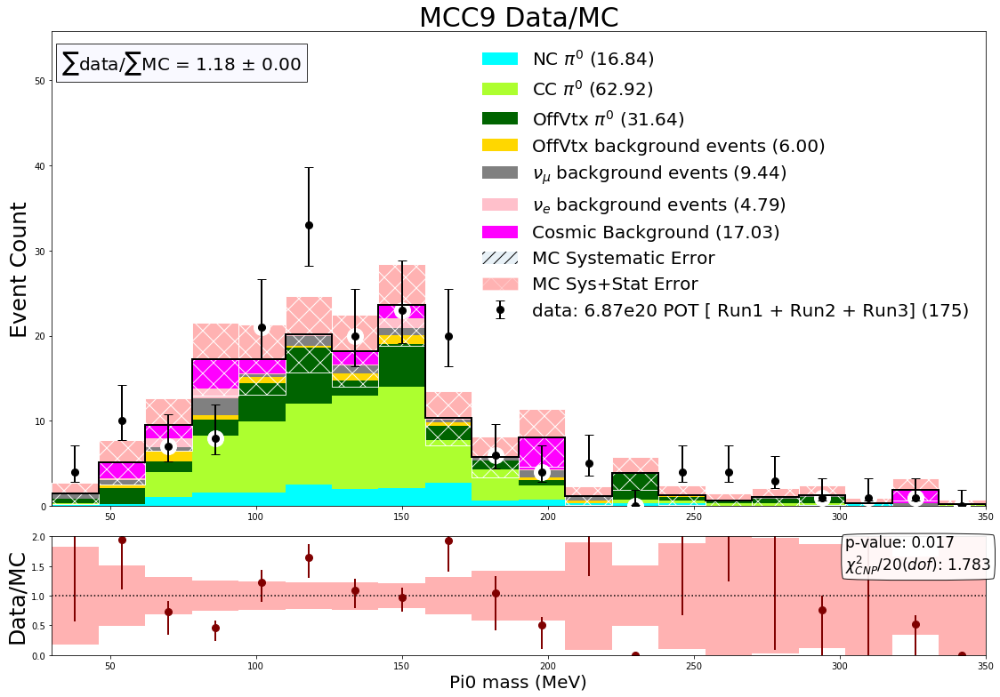

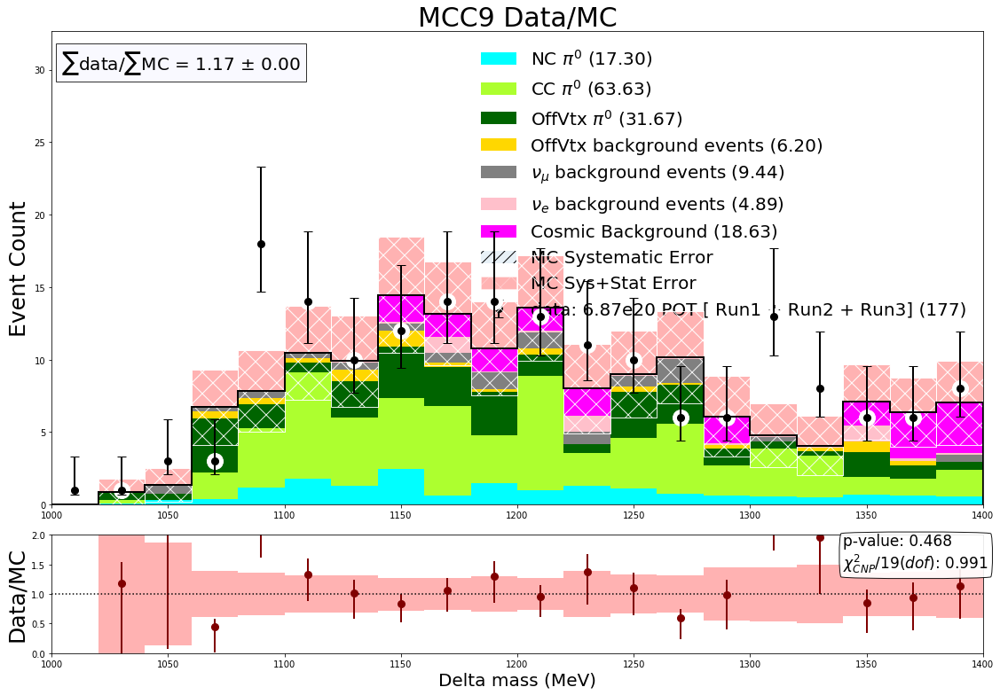

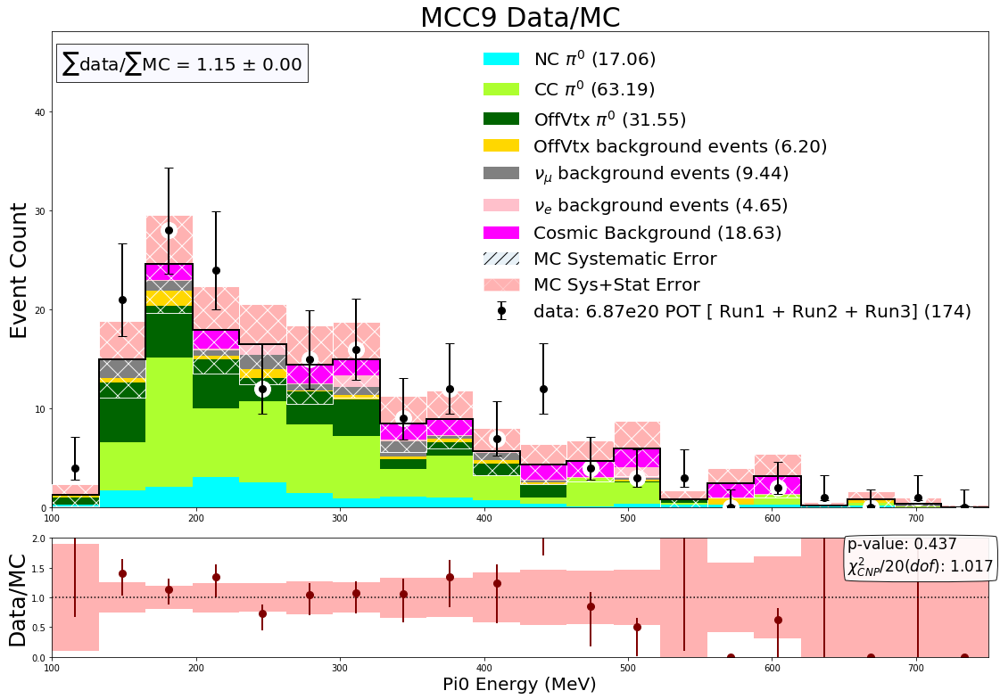

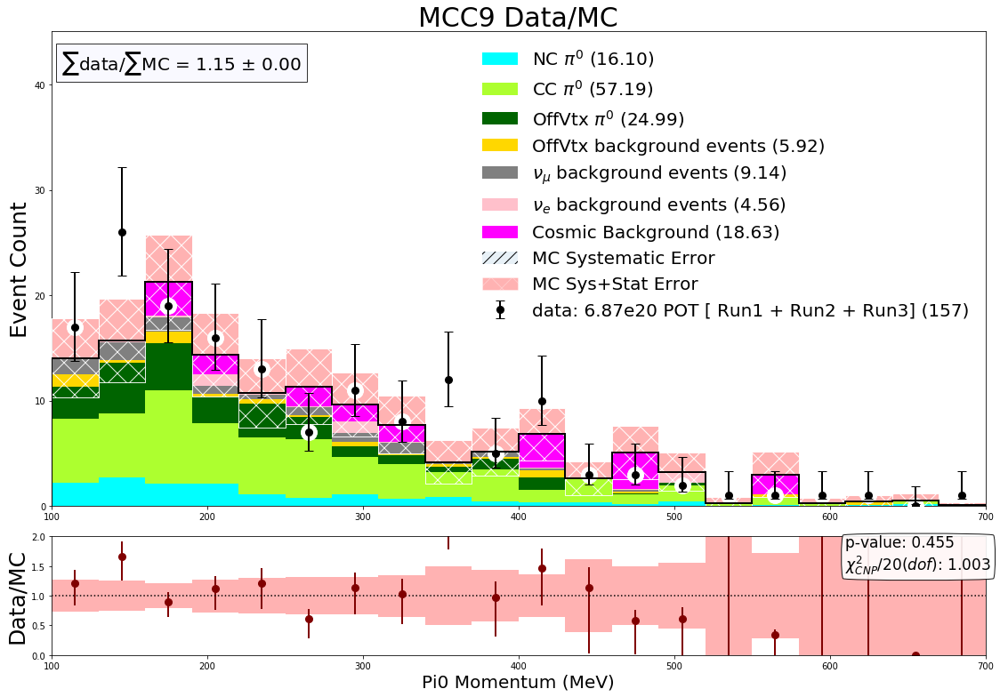

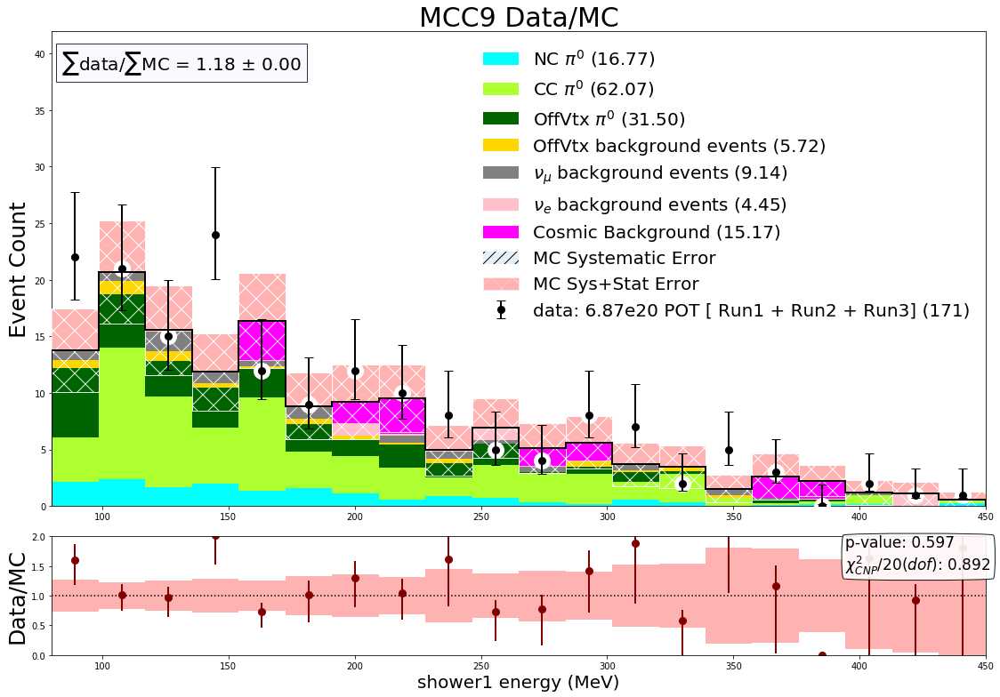

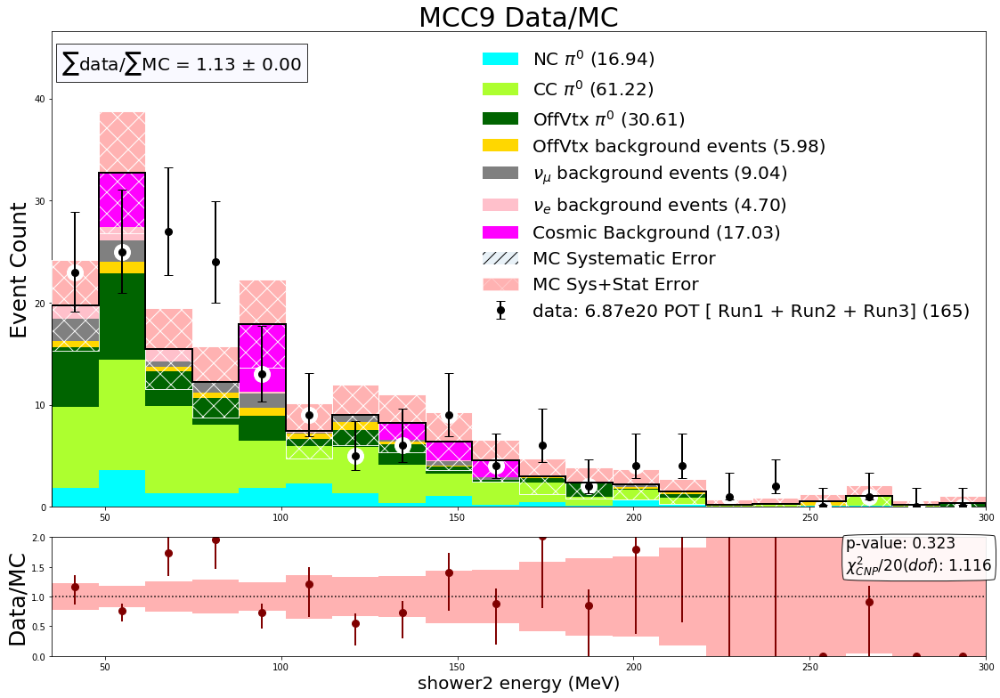

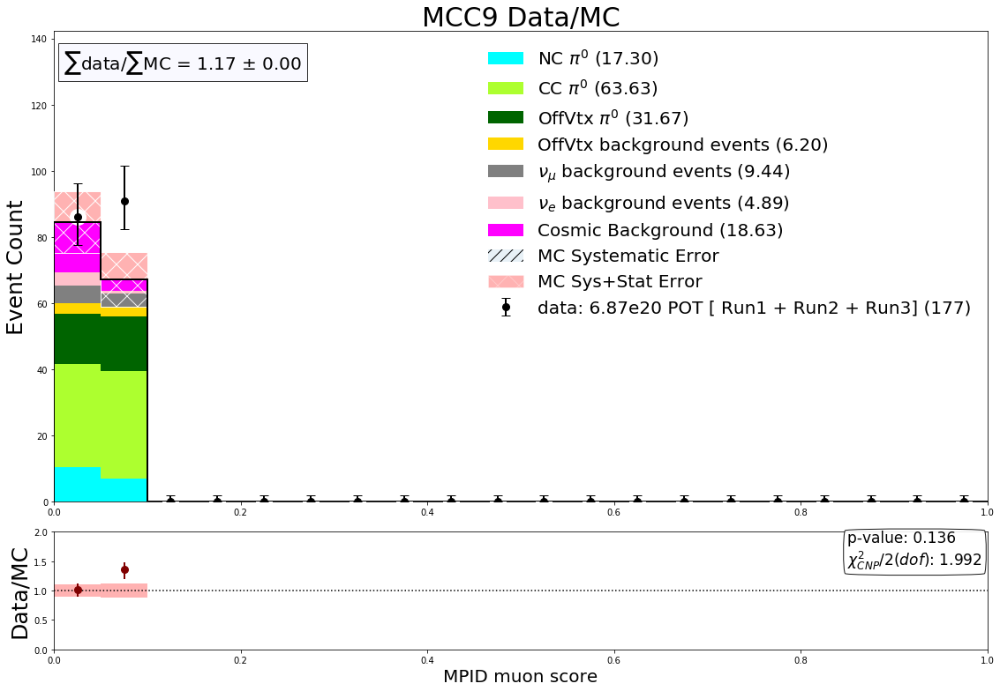

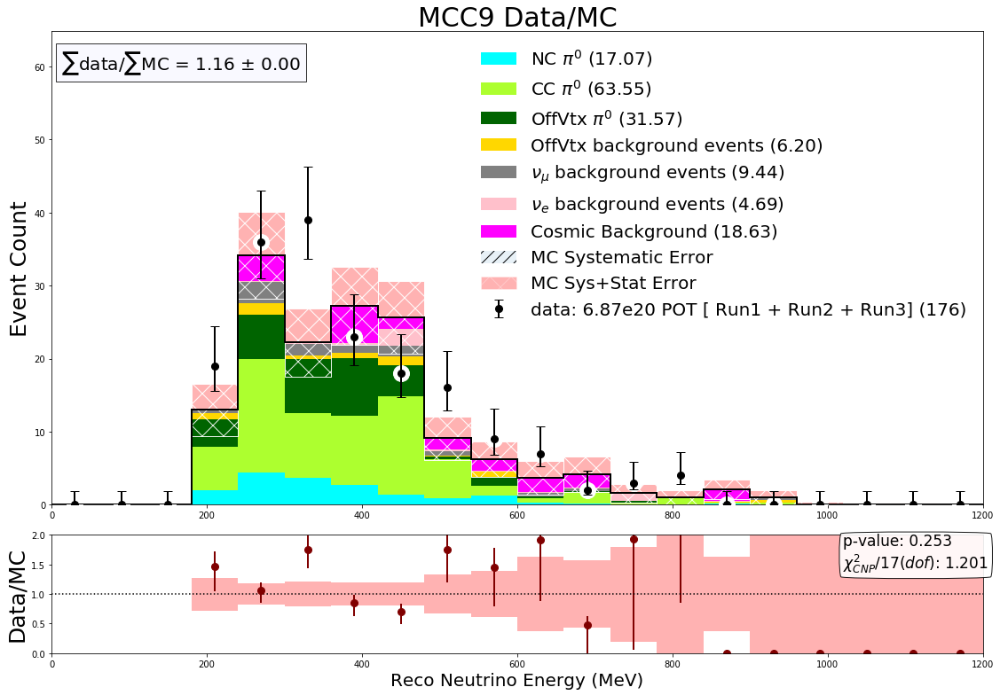

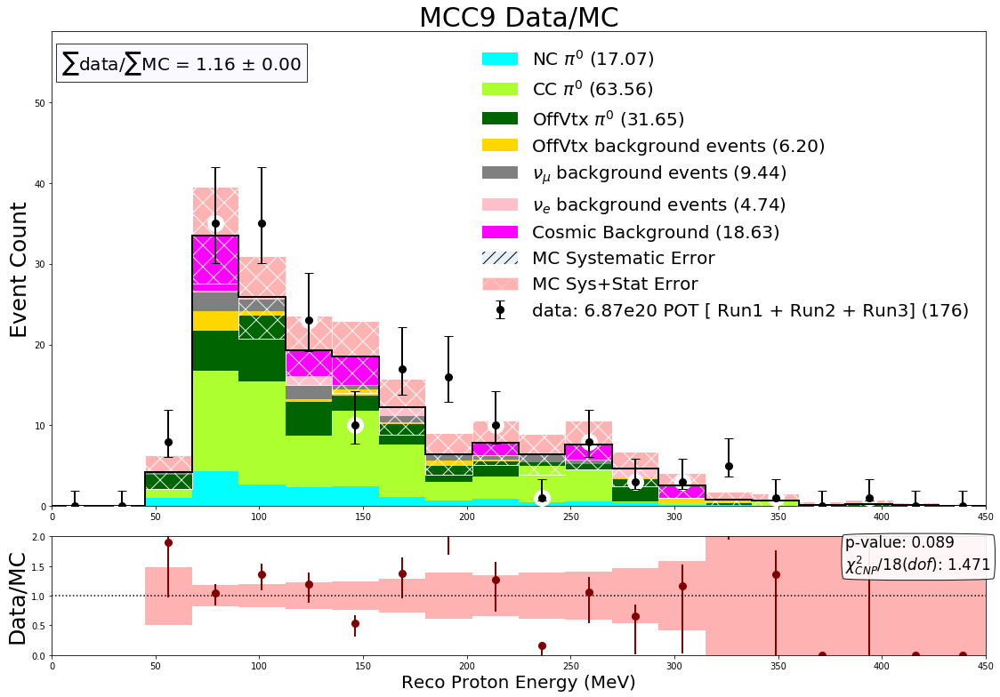

In [121]:
def getweights(df):
    a_CC= 3.425e-06
    b_CC= -0.0039
    c_CC = 1.784

    a_NC= 1.885e-06
    b_NC= -0.00316
    c_NC = 1.442
    weights =[]
    mom = df['pi0_momentum_true'].values
    pi0s = df['_pi0mass'].values
    ccnc = df['ccnc'].values

    for i in range(len(mom)):
        if pi0s[i] > 0 and a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC <4:
            if ccnc[i]==0:
                weights.append(a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC)
            else:
                if(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC <0):
                    weights.append(.001)
                else:
                    weights.append(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC)
        else:
            weights.append(1.0)
    return weights

def resetweights(df):
    weights_v = []
    for i in range(len(df)):
        weights_v.append(1.0)
    return weights_v

#reset new weights column
df_numu_total.drop(['new_weight'], axis=1)
df_nue_total.drop(['new_weight'], axis=1)
df_ccpi0_total.drop(['new_weight'], axis=1)
df_ncpi0_total.drop(['new_weight'], axis=1)

# now add in new weights
pi0_new4 = getweights(df_numu_total)
df_numu_total['new_weight'] = pi0_new4

pi0_new8 = resetweights(df_nue_total)
df_nue_total['new_weight'] = pi0_new8

pi0_new5 = getweights(df_ccpi0_total)
df_ccpi0_total['new_weight'] = pi0_new5

pi0_new6 = getweights(df_ncpi0_total)
df_ncpi0_total['new_weight'] = pi0_new6

# print(df_ncpi0_total['new_weight'])
# print(df_ccpi0_total['new_weight'])

with PdfPages('output_combined_20201109_weighted.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
        cov = d_cov+s_cov
        cov =np.zeros((nbins,nbins))
        run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
        run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
        run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 6.87e20 POT [ Run1 + Run2 + Run3]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)
        pdf.savefig(fig1)

QE count:  55
Res count:  659
Dis count:  202
Coh count:  2
MEC count:  15
[  0.   9.  78. 152. 140. 127. 113.  98.  57.  34.  28.  34.  23.  13.
   9.   4.   6.   3.   1.   0.] 929.0
55
2
0


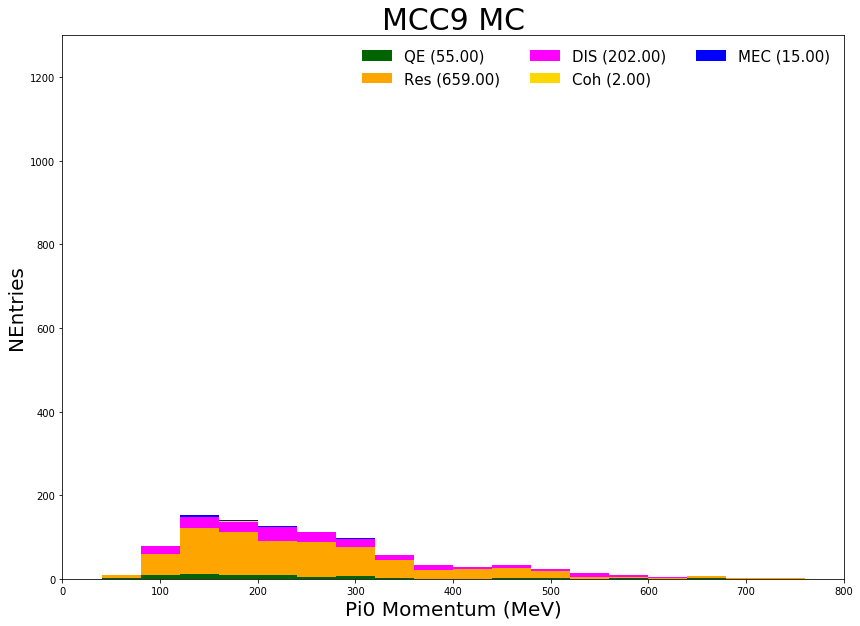

In [119]:
var_bnb_QE = df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Res = df_numu_total.query("nu_interaction_mode ==1 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Dis = df_numu_total.query("nu_interaction_mode ==2 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Coh = df_numu_total.query("nu_interaction_mode ==3 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_MEC = df_numu_total.query("nu_interaction_mode ==10 and haspi0==1")['pi0_momentum_reco'].values

print("QE count: ",len(df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")))
print("Res count: ",len(df_numu_total.query("nu_interaction_mode ==1 and haspi0==1")))
print("Dis count: ",len(df_numu_total.query("nu_interaction_mode ==2 and haspi0==1")))
print("Coh count: ",len(df_numu_total.query("nu_interaction_mode ==3 and haspi0==1")))
print("MEC count: ",len(df_numu_total.query("nu_interaction_mode ==10 and haspi0==1")))

fig,ax = plt.subplots(figsize=(14,10))
_hists=[var_bnb_QE,var_bnb_Res,var_bnb_Dis,var_bnb_Coh,var_bnb_MEC]
tmp_colors = ['darkgreen','orange','magenta','gold','blue']
myrange = (0,800)
nbins = 20
ymax =1300
tmp_labels = ['QE'+' (%.2f)'%len(var_bnb_QE),'Res'+' (%.2f)'%len(var_bnb_Res),'DIS'+' (%.2f)'%len(var_bnb_Dis),'Coh'+' (%.2f)'%len(var_bnb_Coh),'MEC'+' (%.2f)'%len(var_bnb_MEC)]

fig.patch.set_alpha(1)
vals_mc = np.zeros(nbins)

for i in range(0,len(_hists)):
    v1,binedges = np.histogram(_hists[i],nbins,range=myrange)
    vals_mc += v1

print (vals_mc, sum(vals_mc))


bincenters = np.diff(binedges)/2 + binedges[:-1]     

plt.ylim(0,ymax)
plt.xlim(myrange)
ax.set_xlabel("Pi0 Momentum (MeV)",fontsize=20)
ax.set_ylabel('NEntries',fontsize=20)
ax.set_title('MCC9 MC',fontsize=30)

plt.hist(_hists,nbins,range=myrange,color=tmp_colors,stacked=True,linewidth=2.5,label=tmp_labels,edgecolor='None')

ax.legend(loc='upper right',fontsize=15,frameon=False,ncol=3)

print(len(df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")))
print(len(df_numu_total.query("nu_interaction_type ==1096 and haspi0==1")))
print(len(df_numu_total.query("nu_interaction_mode ==0 and nu_interaction_type ==1096 and haspi0==1 and MC_scedr<5")))

## Save selection for Lauren

In [83]:
def getpi0weights(df):
    a_CC= 3.425e-06
    b_CC= -0.0039
    c_CC = 1.784

    a_NC= 1.885e-06
    b_NC= -0.00316
    c_NC = 1.442


    weights =[]
    mom = df['pi0_momentum_true'].values
    pi0s = df['_pi0mass'].values
    ccnc = df['ccnc'].values

    for i in range(len(mom)):
        if pi0s[i] > 0 and a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC <4:
            if ccnc[i]==0:
                weights.append(a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC)
            else:
                weights.append(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC)
        else:
            weights.append(1.0)
    return weights

weights1mu = getpi0weights(df_numu_1mil_pi0)
weights2mu = getpi0weights(df_numu_r2_1mil_pi0)
weights3mu = getpi0weights(df_numu_r3_pi0)
weights1e = getpi0weights(df_nue_pi0)
weights2e = getpi0weights(df_nue_r2_pi0)
weights3e = getpi0weights(df_nue_r3_pi0)
weights1cc = getpi0weights(df_ccpi0_r1_pi0)
weights3cc = getpi0weights(df_ccpi0_r3_pi0)
weights1nc = getpi0weights(df_ncpi0_r1_pi0)
weights3nc = getpi0weights(df_ncpi0_r3_pi0)

df_numu_1mil_pi0['pi0_weight']=weights1mu
df_numu_r2_1mil_pi0['pi0_weight']=weights2mu
df_numu_r3_pi0['pi0_weight']=weights3mu
df_nue_pi0['pi0_weight']=weights1e
df_nue_r2_pi0['pi0_weight']=weights2e
df_nue_r3_pi0['pi0_weight']=weights3e
df_ccpi0_r1_pi0['pi0_weight']=weights1cc
df_ccpi0_r3_pi0['pi0_weight']=weights3cc
df_ncpi0_r1_pi0['pi0_weight']=weights1nc
df_ncpi0_r3_pi0['pi0_weight']=weights3nc

In [84]:
df_numu_pi0=df_numu_1mil_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_pi0=df_nue_pi0.query("MC_parentPDG ==12")

# file1 = open("2021Apr02_pi0selection_bnb_overlay_run1.txt","w")
# file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_numu_pi0)):
#     teststr = "[" +str(df_numu_pi0['run'].values[event])+","+str(df_numu_pi0['subrun'].values[event])+","+str(df_numu_pi0['event'].values[event])+","+str(df_numu_pi0['_pi0mass_new'].values[event])+","+str(df_numu_pi0['DeltaMass_new'].values[event])
#     teststr2 =","+ str(df_numu_pi0['shower1_E_Y_new'].values[event])+","+str(df_numu_pi0['shower2_E_Y_new'].values[event])+","+ str(df_numu_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_numu_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_numu_pi0['MPID_muon'].values[event])+","+ str(df_numu_pi0['pi0_weight'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2)
# file1.close()


# file2 = open("2021Apr02_pi0selection_nue_intrinsic_run1.txt","w")
# file2.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_nue_pi0)):
#     teststr = "[" +str(df_nue_pi0['run'].values[event])+","+str(df_nue_pi0['subrun'].values[event])+","+str(df_nue_pi0['event'].values[event])+","+str(df_nue_pi0['_pi0mass_new'].values[event])+","+str(df_nue_pi0['DeltaMass_new'].values[event])
#     teststr2 =","+  str(df_nue_pi0['shower1_E_Y_new'].values[event])+","+str(df_nue_pi0['shower2_E_Y_new'].values[event])+","+ str(df_nue_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_nue_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_nue_pi0['MPID_muon'].values[event])+","+ str(df_nue_pi0['pi0_weight'].values[event])+"]"+"\n"
#     file2.write(teststr+teststr2)
# file2.close()

# file3 = open("2021Apr02_pi0selection_ext_run1.txt","w")
# file3.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_ext_pi0)):
#     teststr = "[" +str(df_ext_pi0['run'].values[event])+","+str(df_ext_pi0['subrun'].values[event])+","+str(df_ext_pi0['event'].values[event])+","+str(df_ext_pi0['_pi0mass_new'].values[event])+","+str(df_ext_pi0['DeltaMass_new'].values[event])
#     teststr2 = ","+ str(df_ext_pi0['shower1_E_Y_new'].values[event])+","+str(df_ext_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ext_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ext_pi0['pi0_momentum_reco'].values[event])+","+ str(df_ext_pi0['MPID_muon'].values[event])+","+'1.0'+"]"+"\n"
#     file3.write(teststr+teststr2)
# file3.close()


file1 = open("2021May31_fullpi0selection_bnb_overlay_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_numu_pi0)):
    teststr = "[" +str(df_numu_pi0['run'].values[event])+","+str(df_numu_pi0['subrun'].values[event])+","+str(df_numu_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run1.txt","w")
file2.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_nue_pi0)):
    teststr = "[" +str(df_nue_pi0['run'].values[event])+","+str(df_nue_pi0['subrun'].values[event])+","+str(df_nue_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()

file3 = open("2021May31_fullpi0selection_ext_run1.txt","w")
file3.write("[run,subrun,event,weight, reco Enu]\n")
for event in range(len(df_ext_pi0)):
    teststr = "[" +str(df_ext_pi0['run'].values[event])+","+str(df_ext_pi0['subrun'].values[event])+","+str(df_ext_pi0['event'].values[event])
    teststr2 = ","+ "1.0"+ ","+ str(df_ext_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file3.write(teststr+teststr2)
file3.close()


In [85]:
df_numu_r2_1mil_pi0=df_numu_r2_1mil_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_r2_pi0=df_nue_r2_pi0.query("MC_parentPDG ==12")

file1 = open("2021May31_fullpi0selection_bnb_overlay_run2.txt","w")
file1.write("[run,subrun,event,pi0mass, weight, reco Enu,true neutrino energy]\n")
for event in range(len(df_numu_r2_1mil_pi0)):
    teststr = "[" +str(df_numu_r2_1mil_pi0['run'].values[event])+","+str(df_numu_r2_1mil_pi0['subrun'].values[event])+","+str(df_numu_r2_1mil_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_r2_1mil_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_r2_1mil_pi0['Enu_1e1p'].values[event])+ "," +str(df_numu_r2_1mil_pi0['nu_energy_true'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run2.txt","w")
file2.write("[run,subrun,event,pi0mass, weight, reco Enu,true neutrino energy]\n")
for event in range(len(df_nue_r2_pi0)):
    teststr = "[" +str(df_nue_r2_pi0['run'].values[event])+","+str(df_nue_r2_pi0['subrun'].values[event])+","+str(df_nue_r2_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_r2_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_r2_pi0['Enu_1e1p'].values[event])+ "," +str(df_nue_r2_pi0['nu_energy_true'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()


In [86]:
df_numu_r3_pi0=df_numu_r3_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_r3_pi0=df_nue_r3_pi0.query("MC_parentPDG ==12")

file1 = open("2021May31_fullpi0selection_bnb_overlay_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_numu_r3_pi0)):
    teststr = "[" +str(df_numu_r3_pi0['run'].values[event])+","+str(df_numu_r3_pi0['subrun'].values[event])+","+str(df_numu_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run3.txt","w")
file2.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_nue_r3_pi0)):
    teststr = "[" +str(df_nue_r3_pi0['run'].values[event])+","+str(df_nue_r3_pi0['subrun'].values[event])+","+str(df_nue_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()

file3 = open("2021May31_fullpi0selection_ext_run3.txt","w")
file3.write("[run,subrun,event,weight, reco Enu]\n")
for event in range(len(df_ext_r3_pi0)):
    teststr = "[" +str(df_ext_r3_pi0['run'].values[event])+","+str(df_ext_r3_pi0['subrun'].values[event])+","+str(df_ext_r3_pi0['event'].values[event])
    teststr2 = ","+ "1.0"+ ","+ str(df_ext_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file3.write(teststr+teststr2)
file3.close()

In [87]:
file1 = open("2021May31_fullpi0selection_CCPi0_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ccpi0_r1_pi0)):
    teststr = "[" +str(df_ccpi0_r1_pi0['run'].values[event])+","+str(df_ccpi0_r1_pi0['subrun'].values[event])+","+str(df_ccpi0_r1_pi0['event'].values[event])
    teststr2 = ","+ str(df_ccpi0_r1_pi0['pi0_weight'].values[event])+ ","+ str(df_ccpi0_r1_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021May31_fullpi0selection_CCPi0_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ccpi0_r3_pi0)):
    teststr = "[" +str(df_ccpi0_r3_pi0['run'].values[event])+","+str(df_ccpi0_r3_pi0['subrun'].values[event])+","+str(df_ccpi0_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_ccpi0_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_ccpi0_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()



In [88]:
file1 = open("2021May31_fullpi0selection_NCPi0_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ncpi0_r1_pi0)):
    teststr = "[" +str(df_ncpi0_r1_pi0['run'].values[event])+","+str(df_ncpi0_r1_pi0['subrun'].values[event])+","+str(df_ncpi0_r1_pi0['event'].values[event])
    teststr2 = ","+ str(df_ncpi0_r1_pi0['pi0_weight'].values[event])+ ","+ str(df_ncpi0_r1_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021May31_fullpi0selection_NCPi0_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ncpi0_r3_pi0)):
    teststr = "[" +str(df_ncpi0_r3_pi0['run'].values[event])+","+str(df_ncpi0_r3_pi0['subrun'].values[event])+","+str(df_ncpi0_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_ncpi0_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_ncpi0_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()
